In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from collections import Counter
from textwrap import wrap
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Data Balancing

stage1: Data balanced based on Gender


stage2: Data balanced based on Educational Qualification

In [ ]:
data = pd.read_csv('/content/data_balanced.csv')
data.head()

,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,...,Would you be comfortable using blockchain technology to track the origin and sustainability of food products?,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender
0,21,Urban,Bachelor's Degree,INR 1-5 Lakhs,More than 40%,Quality,Yes (Strictly),Rarely or Never,Never,No,...,Yes,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,No,Agree,Female
1,21,Semi Urban,High School,None as of now (Student),Less than 10%,"Price, Quality, Health Benefits, Environmental...",Yes (Strictly),Rarely or Never,Never,No,...,Yes,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,No,Neutral,Male
2,19,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),10% - 20%,Quality,No,Rarely or Never,Never,No,...,Yes,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,No,Strongly agree,Male
3,20,Urban,Bachelor's Degree,None as of now (Student),20% - 30%,Price,Yes (Sometimes),Often,Sometimes,No,...,Yes,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,No,Neutral,Male
4,21,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),10% - 20%,"Price, Quality, Supporting Local Farmers",No,Sometimes,Rarely,No,...,Yes,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,No,Agree,Male


In [ ]:
# @title
# Create a copy of the dataset to avoid overwriting the original data
data_numerical = data.copy()

# Identify all categorical columns
categorical_columns = data_numerical.select_dtypes(include=['object']).columns

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each categorical column
for column in categorical_columns:
    data_numerical[column] = le.fit_transform(data_numerical[column])

# Check the first few rows of the transformed data
data_numerical = data_numerical[data_numerical['Educational Qualification'] != 4]
data_numerical.head()

,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,...,Would you be comfortable using blockchain technology to track the origin and sustainability of food products?,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender
0,21,3,0,0,4,17,2,3,0,0,...,1,3,0,2,3,1,1,0,0,0
1,21,2,2,4,3,11,2,3,0,0,...,1,3,0,2,2,3,0,0,2,1
2,19,3,3,4,0,17,0,3,0,0,...,1,1,0,4,3,3,1,0,3,1
3,20,3,0,4,1,4,1,2,3,0,...,1,2,0,2,3,2,0,0,2,1
4,21,3,3,4,0,14,0,4,2,0,...,1,4,2,2,4,3,1,0,0,1


In [ ]:
# Assuming 'TargetColumn' is your label column (class labels) and 'data_numerical' is the feature set

# Step 1: Separate features and target
X = data_numerical.drop('Educational Qualification', axis=1)  # Replace 'TargetColumn' with the name of your target
y = data_numerical['Educational Qualification']

# Step 2: Check the original class distribution
print("Original class distribution:", Counter(y))

# Step 3: Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 4: Check the new class distribution after resampling
print("New class distribution after SMOTE:", Counter(y_resampled))

# Step 5: Convert back to DataFrame (optional)
data_resampled = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.DataFrame(y_resampled, columns=['Educational Qualification'])], axis=1)

# Step 6: Display the first few rows of the resampled data
data_resampled.head()


Original class distribution: Counter({0: 71, 2: 40, 3: 37, 1: 15})
New class distribution after SMOTE: Counter({0: 71, 2: 71, 3: 71, 1: 71})


,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification
0,21,3,0,4,17,2,3,0,0,3,...,3,0,2,3,1,1,0,0,0,0
1,21,2,4,3,11,2,3,0,0,1,...,3,0,2,2,3,0,0,2,1,2
2,19,3,4,0,17,0,3,0,0,1,...,1,0,4,3,3,1,0,3,1,3
3,20,3,4,1,4,1,2,3,0,2,...,2,0,2,3,2,0,0,2,1,0
4,21,3,4,0,14,0,4,2,0,4,...,4,2,2,4,3,1,0,0,1,3


In [ ]:
# Assuming 'data_numerical' is your DataFrame with the Gender column

# Step 1: Pop the 'Gender' column (remove it temporarily)
gender_column = data.pop('Educational Qualification')

# Step 2: Insert the 'Gender' column at the last position
data['Educational Qualification'] = gender_column

# Step 3: Display the updated DataFrame to verify
data.head()


,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification
0,21,Urban,INR 1-5 Lakhs,More than 40%,Quality,Yes (Strictly),Rarely or Never,Never,No,Rarely,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,No,Agree,Female,Bachelor's Degree
1,21,Semi Urban,None as of now (Student),Less than 10%,"Price, Quality, Health Benefits, Environmental...",Yes (Strictly),Rarely or Never,Never,No,Never,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,No,Neutral,Male,High School
2,19,Urban,None as of now (Student),10% - 20%,Quality,No,Rarely or Never,Never,No,Never,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,No,Strongly agree,Male,"High school graduate, diploma or the equivalent"
3,20,Urban,None as of now (Student),20% - 30%,Price,Yes (Sometimes),Often,Sometimes,No,Often,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,No,Neutral,Male,Bachelor's Degree
4,21,Urban,None as of now (Student),10% - 20%,"Price, Quality, Supporting Local Farmers",No,Sometimes,Rarely,No,Sometimes,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,No,Agree,Male,"High school graduate, diploma or the equivalent"


In [ ]:
# Assuming 'data_numerical' is the DataFrame with label-encoded columns
# and 'data' is the original DataFrame with categorical values

# Step 1: Initialize the LabelEncoder again
le = LabelEncoder()

# Step 2: Reverse label encoding for each column that was encoded
for column in categorical_columns:
    # Fit the LabelEncoder on the original column (before encoding)
    le.fit(data[column])  # Use the original categorical data for fitting

    # Inverse transform the label-encoded column back to original categories
    data_resampled[column] = le.inverse_transform(data_resampled[column])

# Step 3: Display the first few rows of the data to verify
data_resampled.head()

,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification
0,21,Urban,INR 1-5 Lakhs,More than 40%,Quality,Yes (Strictly),Rarely or Never,Never,No,Rarely,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,No,Agree,Female,Bachelor's Degree
1,21,Semi Urban,None as of now (Student),Less than 10%,"Price, Quality, Health Benefits, Environmental...",Yes (Strictly),Rarely or Never,Never,No,Never,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,No,Neutral,Male,High School
2,19,Urban,None as of now (Student),10% - 20%,Quality,No,Rarely or Never,Never,No,Never,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,No,Strongly agree,Male,"High school graduate, diploma or the equivalent"
3,20,Urban,None as of now (Student),20% - 30%,Price,Yes (Sometimes),Often,Sometimes,No,Often,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,No,Neutral,Male,Bachelor's Degree
4,21,Urban,None as of now (Student),10% - 20%,"Price, Quality, Supporting Local Farmers",No,Sometimes,Rarely,No,Sometimes,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,No,Agree,Male,"High school graduate, diploma or the equivalent"


In [ ]:
data_resampled.to_csv('data_balanced2.csv')

In [ ]:
data = pd.read_csv('/content/data_balanced2.csv')
data = data.drop(data.columns[0], axis=1)
data.head()

,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification
0,21,Urban,INR 1-5 Lakhs,More than 40%,Quality,Yes (Strictly),Rarely or Never,Never,No,Rarely,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,No,Agree,Female,Bachelor's Degree
1,21,Semi Urban,None as of now (Student),Less than 10%,"Price, Quality, Health Benefits, Environmental...",Yes (Strictly),Rarely or Never,Never,No,Never,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,No,Neutral,Male,High School
2,19,Urban,None as of now (Student),10% - 20%,Quality,No,Rarely or Never,Never,No,Never,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,No,Strongly agree,Male,"High school graduate, diploma or the equivalent"
3,20,Urban,None as of now (Student),20% - 30%,Price,Yes (Sometimes),Often,Sometimes,No,Often,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,No,Neutral,Male,Bachelor's Degree
4,21,Urban,None as of now (Student),10% - 20%,"Price, Quality, Supporting Local Farmers",No,Sometimes,Rarely,No,Sometimes,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,No,Agree,Male,"High school graduate, diploma or the equivalent"


# Demographic Statistics

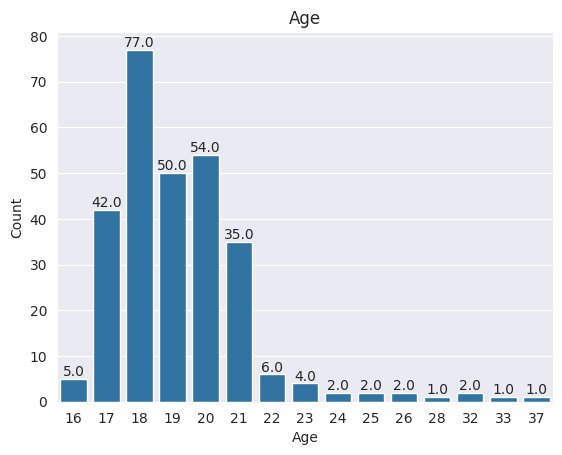

In [ ]:
# plt.figure(figsize=(10, 6))
ax=sns.countplot(data=data, x='Age')
# Add count values on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Age')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

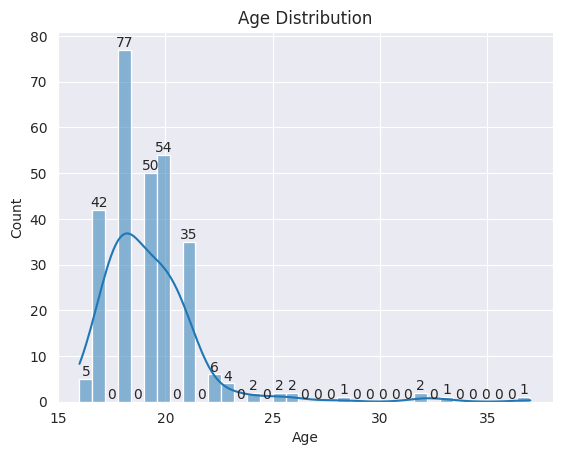

In [ ]:
# plt.figure(figsize=(10, 6))
ax=sns.histplot(data=data, x='Age',kde=True)
# Add count values on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

In [ ]:
data1 = data
df = pd.DataFrame(data1)
df.describe()

,Age
count,284.000000
mean,19.299296
std,2.476433
min,16.000000
25%,18.000000
50%,19.000000
75%,20.000000
max,37.000000


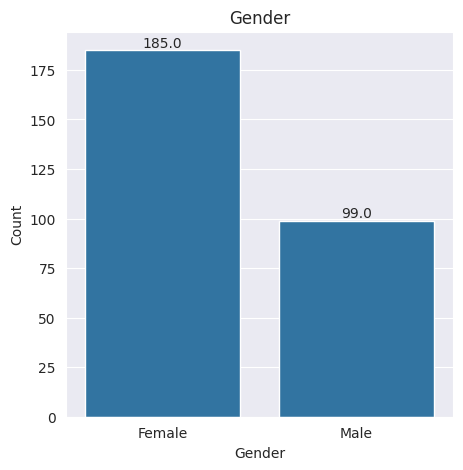

In [ ]:
plt.figure(figsize=(5,5))
ax=sns.countplot(data=data, x='Gender')
# Add count values on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

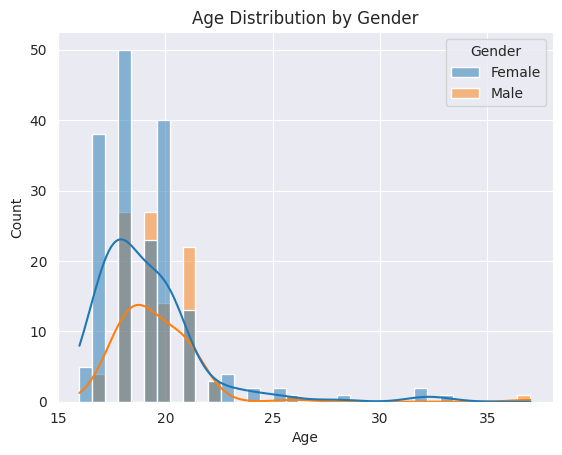

In [ ]:
# plt.figure(figsize=(10, 6))
sns.histplot(data, x='Age', hue='Gender', kde=True)
plt.title('Age Distribution by Gender')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

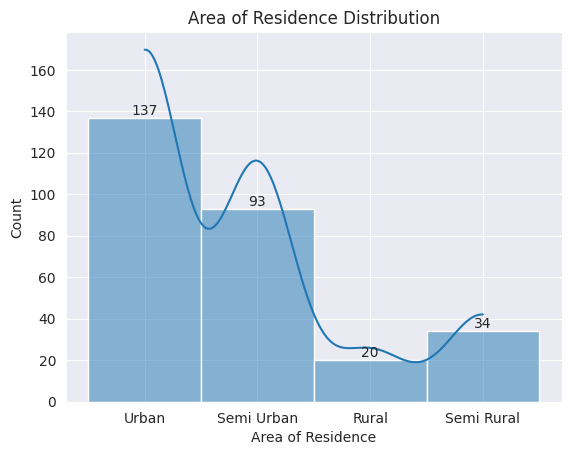

In [ ]:
# plt.figure(figsize=(10, 6))
ax=sns.histplot(data, x='Area of Residence', kde=True)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Area of Residence Distribution')
plt.xlabel('Area of Residence')
plt.ylabel('Count')
plt.show()

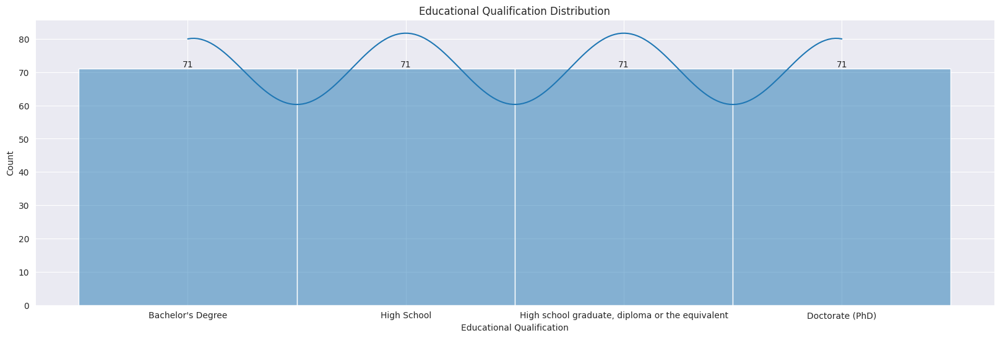

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='Educational Qualification', kde=True)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Educational Qualification Distribution')
plt.xlabel('Educational Qualification')
plt.ylabel('Count')
plt.show()

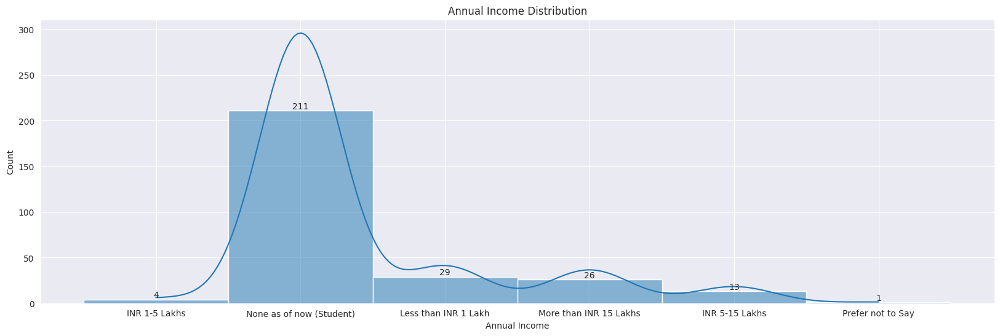

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='What is your Annual Income?', kde=True)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
plt.title('Annual Income Distribution')
plt.xlabel('Annual Income')
plt.ylabel('Count')
plt.show()

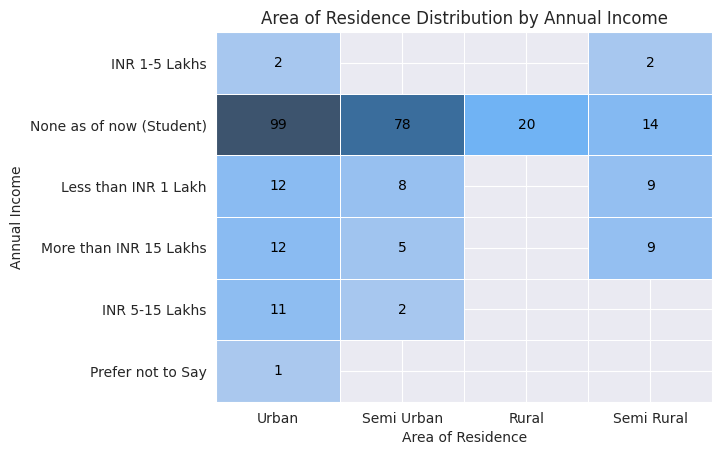

In [ ]:
ax = sns.histplot(data, x='Area of Residence', y='What is your Annual Income?', edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
# Add lines between cells
for p in ax.patches:
    plt.gca().add_patch(plt.Rectangle(
        (p.get_x(), p.get_y()),
        p.get_width(),
        p.get_height(),
        fill=False,
        edgecolor='black',  # You can change the color
        linewidth=0.5  # Adjust the line width
    ))

ax.margins(x=0, y=0)  # remove unneeded whitespace
# plt.tight_layout()
plt.title('Area of Residence Distribution by Annual Income')
plt.xlabel('Area of Residence')
plt.ylabel('Annual Income')
plt.show()

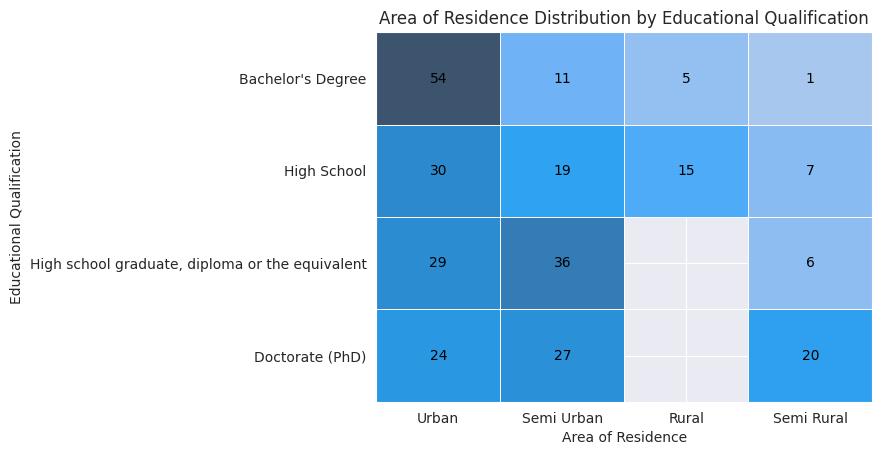

In [ ]:
ax = sns.histplot(data, x='Area of Residence', y='Educational Qualification', cbar=False, edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
# plt.tight_layout()
plt.title('Area of Residence Distribution by Educational Qualification')
plt.xlabel('Area of Residence')
plt.ylabel('Educational Qualification')
plt.show()

# Economical Analysis

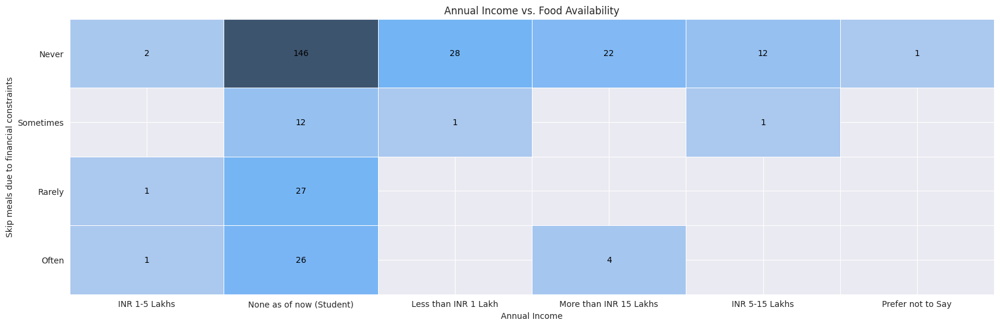

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='What is your Annual Income?', y='How frequently do you skip meals due to financial constraints or lack of access to food?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Annual Income vs. Food Availability')
plt.xlabel('Annual Income')
plt.ylabel('Skip meals due to financial constraints')
plt.show()

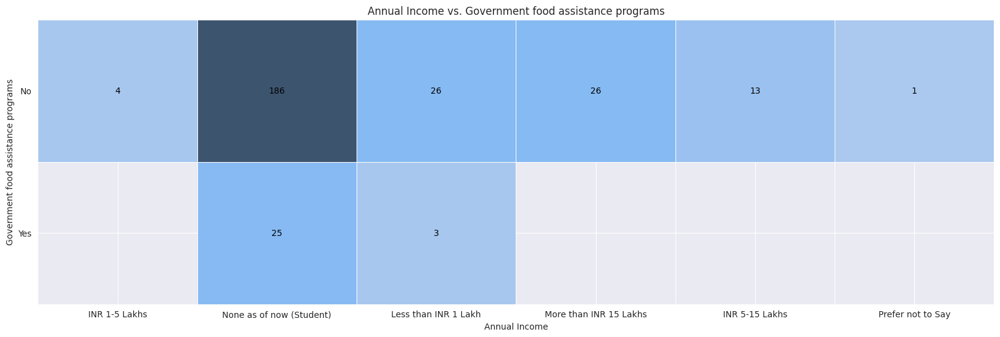

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='What is your Annual Income?', y='Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Annual Income vs. Government food assistance programs')
plt.xlabel('Annual Income')
plt.ylabel('Government food assistance programs')
plt.show()

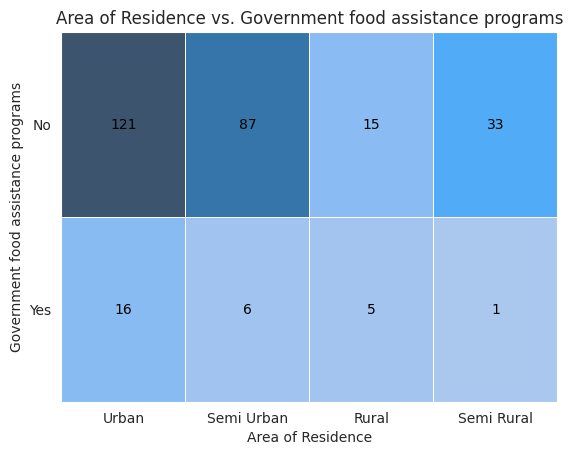

In [ ]:
# plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='Area of Residence', y='Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence vs. Government food assistance programs')
plt.xlabel('Area of Residence')
plt.ylabel('Government food assistance programs')
plt.show()

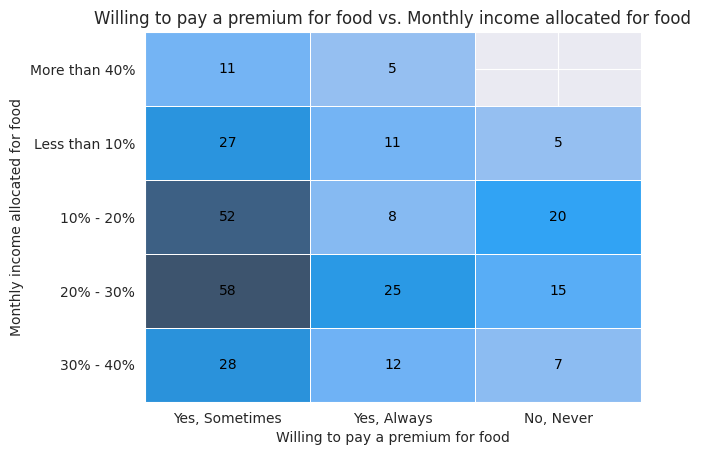

In [ ]:
# plt.figure(figsize=(20, 6))
ax=sns.histplot(data,x='Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?', y='On average, how much of your monthly income do you allocate towards purchasing food?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Willing to pay a premium for food vs. Monthly income allocated for food')
plt.xlabel('Willing to pay a premium for food')
plt.ylabel('Monthly income allocated for food')
plt.show()

# Health Analysis

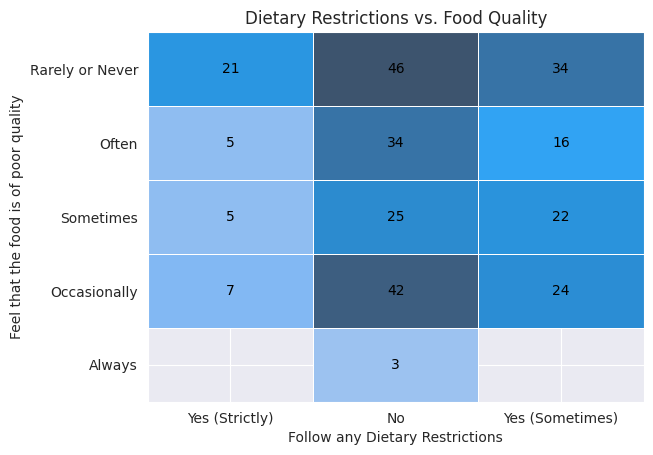

In [ ]:
# plt.figure(figsize=(20, 6))
ax=sns.histplot(data,x='Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?',
                y='How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Dietary Restrictions vs. Food Quality')
plt.xlabel('Follow any Dietary Restrictions')
plt.ylabel('Feel that the food is of poor quality')
plt.show()

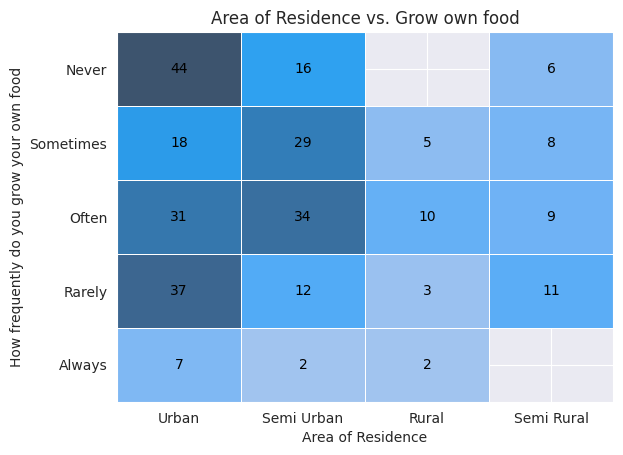

In [ ]:
# plt.figure(figsize=(20, 6))
ax=sns.histplot(data,x='Area of Residence',
                y='How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence vs. Grow own food')
plt.xlabel('Area of Residence')
plt.ylabel('How frequently do you grow your own food')
plt.show()

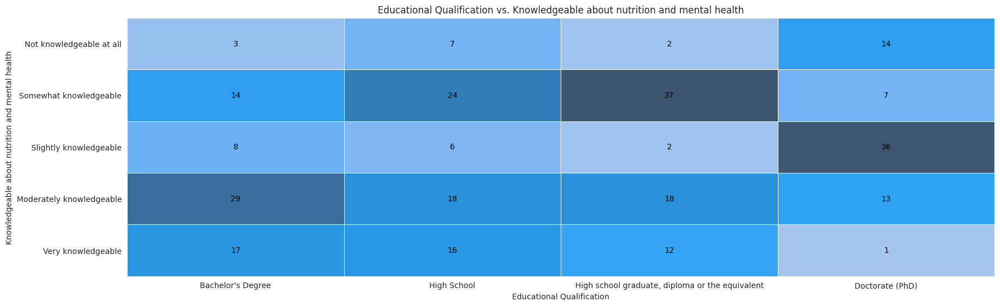

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data,x='Educational Qualification',
                y='How knowledgeable do you feel about the connection between nutrition and mental health?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Educational Qualification vs. Knowledgeable about nutrition and mental health')
plt.xlabel('Educational Qualification')
plt.ylabel('Knowledgeable about nutrition and mental health')
plt.show()

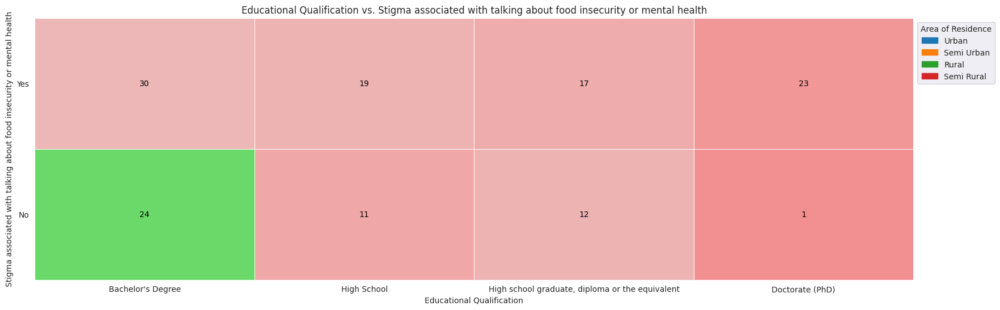

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data,x='Educational Qualification',
                hue='Area of Residence',y='Do you believe there is a stigma associated with talking about food insecurity or mental health?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Educational Qualification vs. Stigma associated with talking about food insecurity or mental health')
plt.xlabel('Educational Qualification')
plt.ylabel('Stigma associated with talking about food insecurity or mental health')
plt.show()

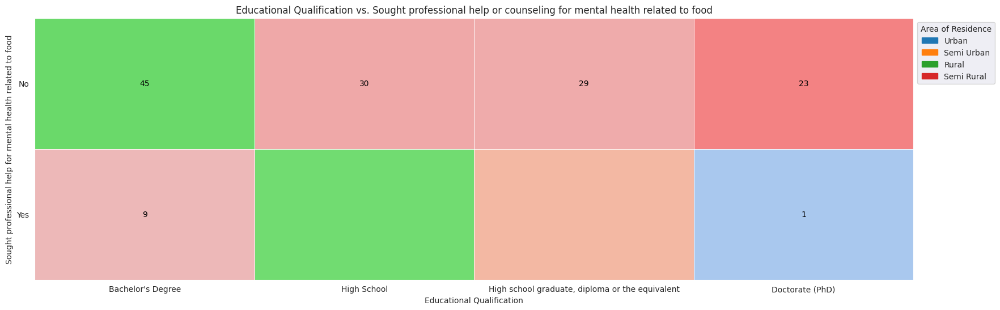

In [ ]:
plt.figure(figsize=(20, 6))
ax=sns.histplot(data, x='Educational Qualification', hue='Area of Residence',
                y='Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Educational Qualification vs. Sought professional help or counseling for mental health related to food')
plt.xlabel('Educational Qualification')
plt.ylabel('Sought professional help for mental health related to food')
plt.show()

# Socialogy Analysis

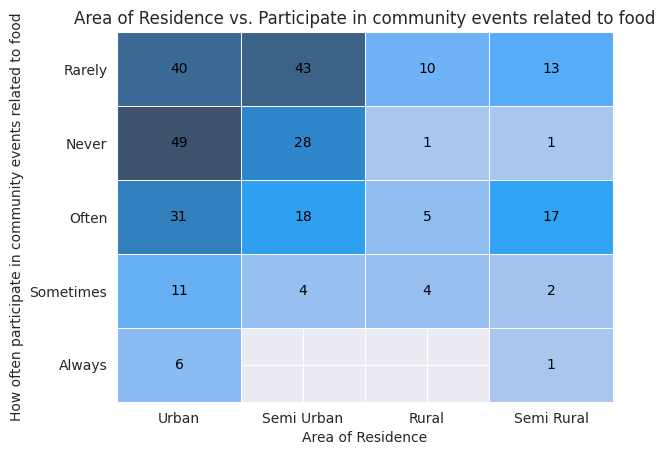

In [ ]:
# plt.figure(figsize=(30,10))
ax=sns.histplot(data, x='Area of Residence',
                y='How often do you participate in community events or activities related to food (e.g., food drives, community meals)?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence vs. Participate in community events related to food')
plt.xlabel('Area of Residence')
plt.ylabel('How often participate in community events related to food')
# plt.xticks(rotation=30)
plt.show()

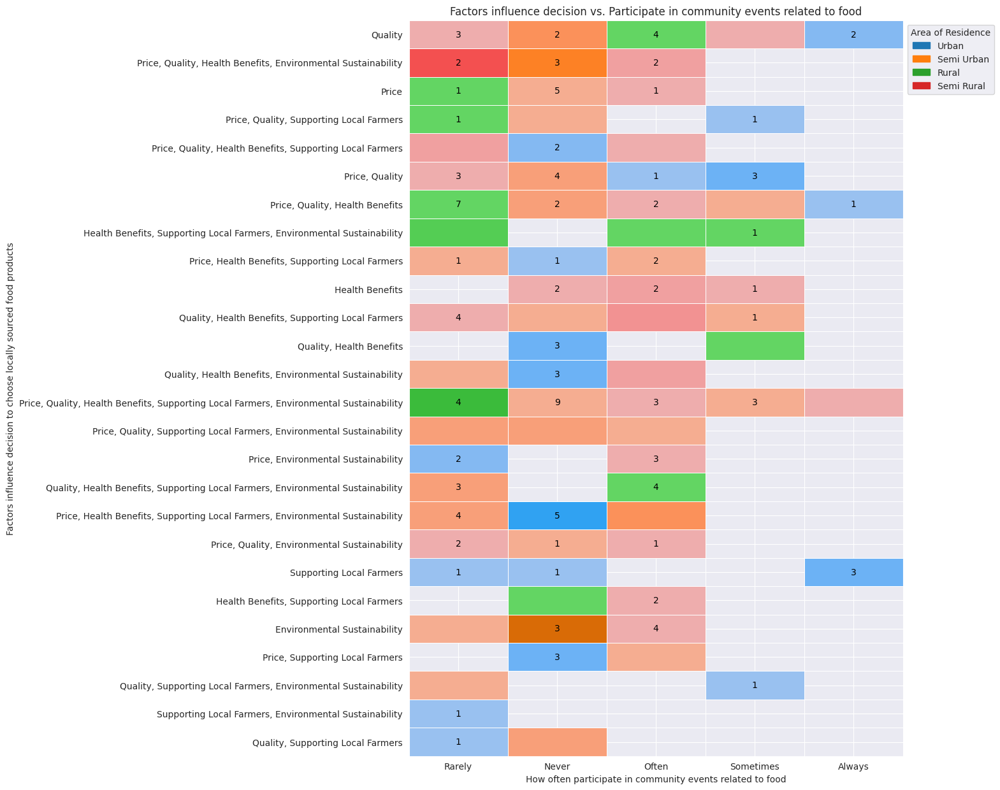

In [ ]:
plt.figure(figsize=(10,15))
ax=sns.histplot(data, y='What factors influence your decision to choose locally sourced food products? (Select all that apply)',
                hue='Area of Residence',
                x='How often do you participate in community events or activities related to food (e.g., food drives, community meals)?',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Factors influence decision vs. Participate in community events related to food')
plt.xlabel('How often participate in community events related to food')
plt.ylabel('Factors influence decision to choose locally sourced food products')
# plt.xticks(rotation=30)
plt.show()

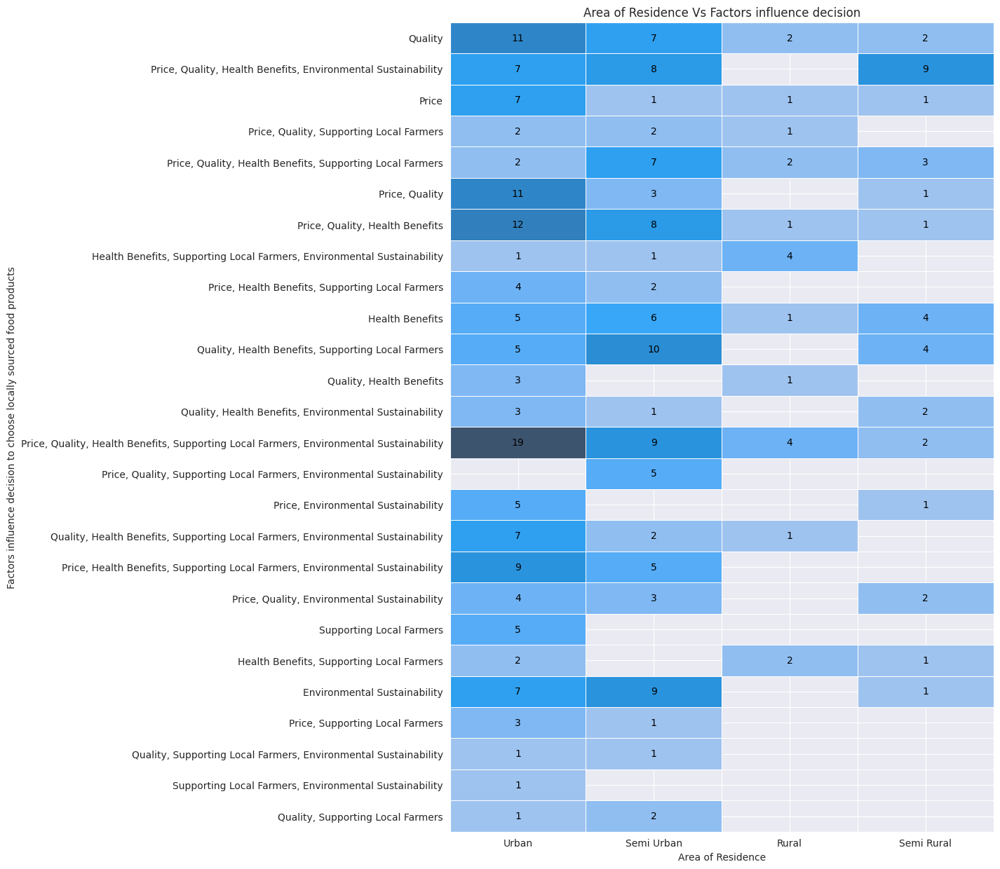

In [ ]:
plt.figure(figsize=(10,15))
ax=sns.histplot(data, y='What factors influence your decision to choose locally sourced food products? (Select all that apply)',
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence Vs Factors influence decision')
plt.ylabel('Factors influence decision to choose locally sourced food products')
plt.xlabel('Area of Residence')
# plt.xticks(rotation=30)
plt.show()

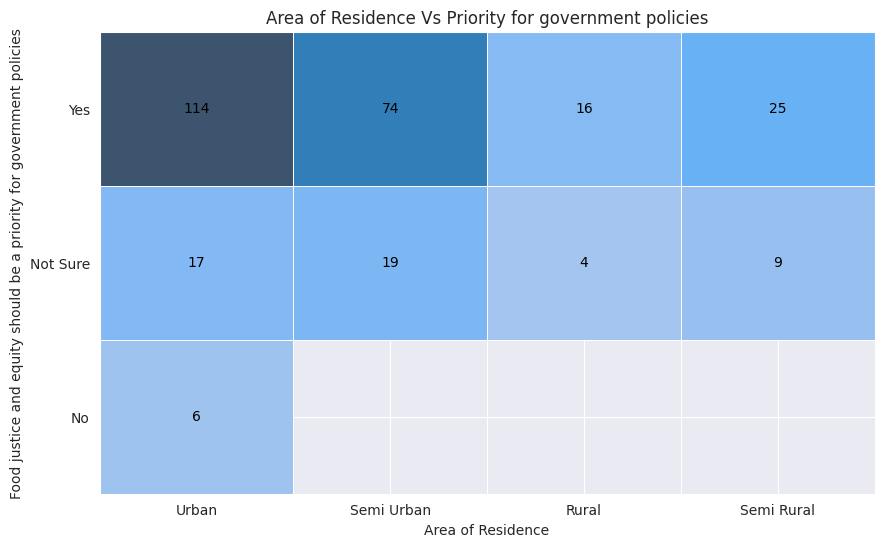

In [ ]:
plt.figure(figsize=(10,6))
ax=sns.histplot(data, y='Do you believe that food justice and equity should be a priority for government policies?',
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence Vs Priority for government policies')
plt.ylabel('Food justice and equity should be a priority for government policies',wrap=True)
plt.xlabel('Area of Residence')
# plt.xticks(rotation=30)
plt.show()

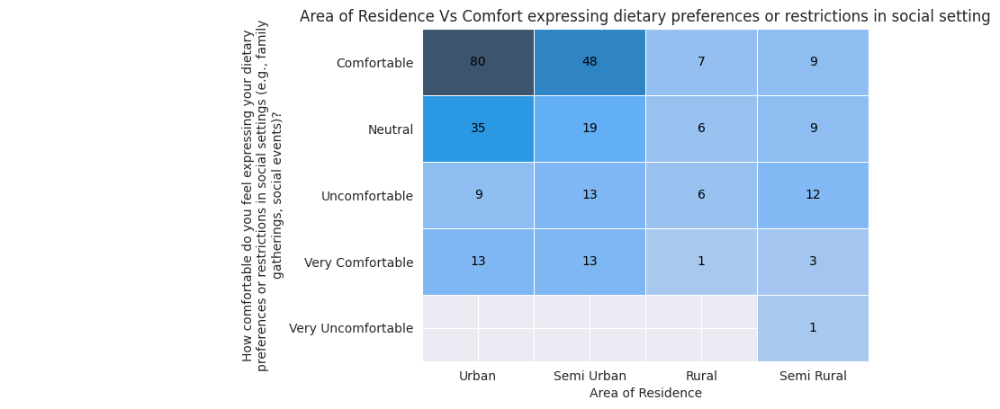

In [ ]:
# plt.figure(figsize=(10,6))
ax=sns.histplot(data, y='How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?',
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
plt.title('Area of Residence Vs Comfort expressing dietary preferences or restrictions in social setting')
plt.ylabel('How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?',wrap=True)
plt.xlabel('Area of Residence')
# plt.xticks(rotation=30)
plt.show()

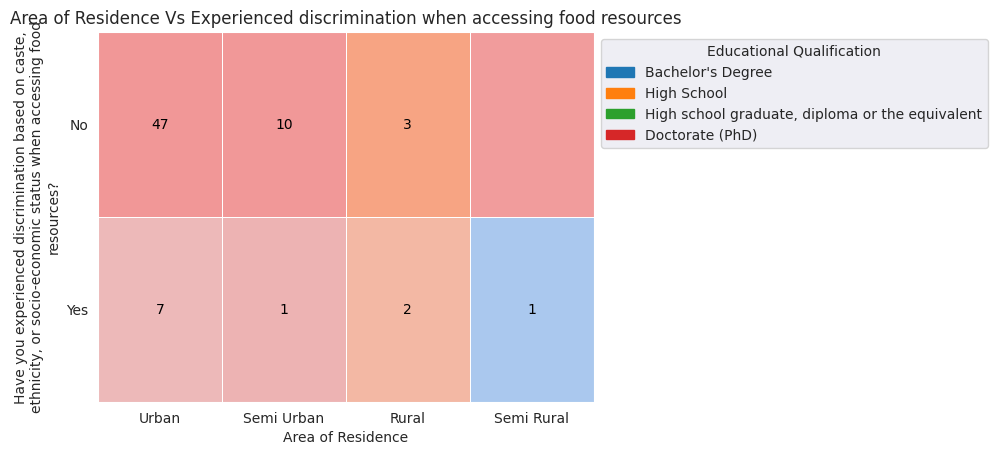

In [ ]:
# plt.figure(figsize=(10,6))
ax=sns.histplot(data, y='Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?',
                x='Area of Residence', hue='Educational Qualification',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Area of Residence Vs Experienced discrimination when accessing food resources')
plt.ylabel('Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?',wrap=True)
plt.xlabel('Area of Residence')
# plt.xticks(rotation=30)
plt.show()

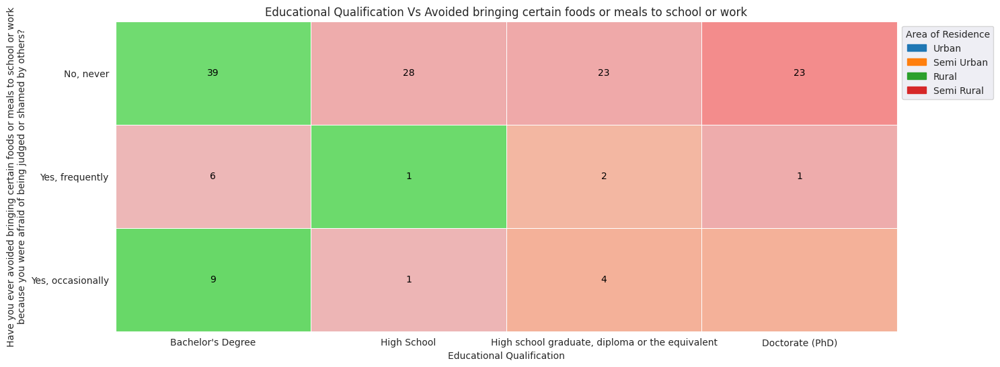

In [ ]:
plt.figure(figsize=(15,6))
ax=sns.histplot(data, y='Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?',
                x='Educational Qualification',hue='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Educational Qualification Vs Avoided bringing certain foods or meals to school or work')
plt.ylabel('Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?',wrap=True)
plt.xlabel('Educational Qualification',wrap=True)
# plt.xticks(rotation=30)
plt.show()

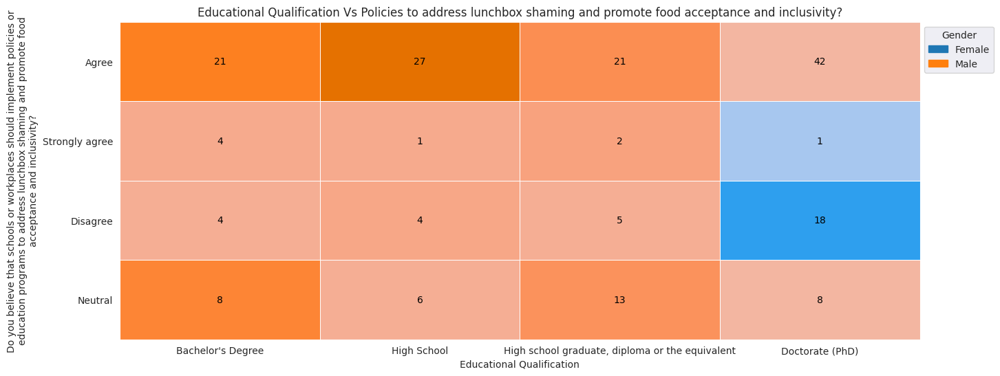

In [ ]:
plt.figure(figsize=(15,6))
ax=sns.histplot(data, y='Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?',
                x='Educational Qualification',hue='Gender',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Educational Qualification Vs Policies to address lunchbox shaming and promote food acceptance and inclusivity?')
plt.ylabel('Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?',wrap=True)
plt.xlabel('Educational Qualification',wrap=True)
# plt.xticks(rotation=30)
plt.show()

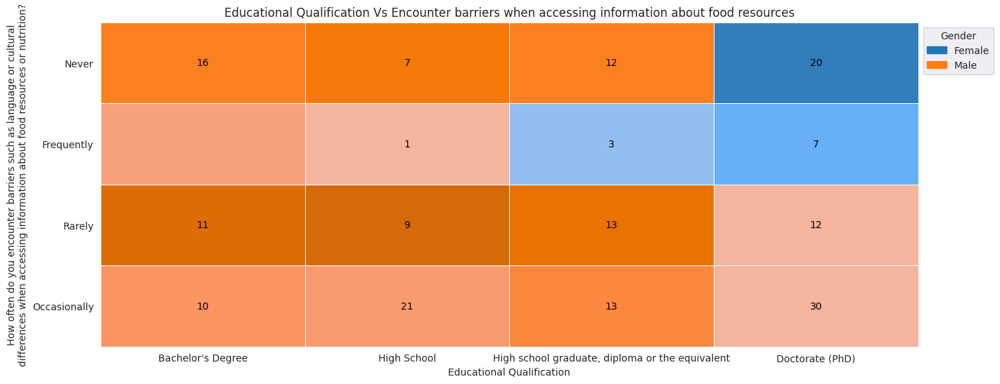

In [ ]:
plt.figure(figsize=(15,6))
ax=sns.histplot(data, y='How often do you encounter barriers such as language or cultural differences when accessing information about food resources or nutrition?',
                x='Educational Qualification',hue='Gender',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Educational Qualification Vs Encounter barriers when accessing information about food resources')
plt.ylabel('How often do you encounter barriers such as language or cultural differences when accessing information about food resources or nutrition?',wrap=True)
plt.xlabel('Educational Qualification',wrap=True)
# plt.xticks(rotation=30)
plt.show()

# Technology Analysis

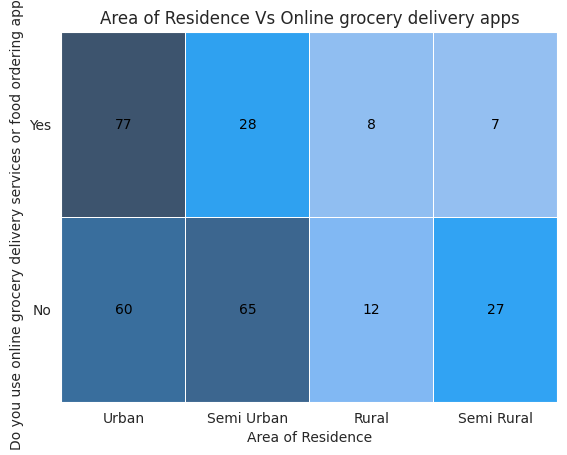

In [ ]:
# plt.figure(figsize=(15,6))
ax=sns.histplot(data, y='Do you use online grocery delivery services or food ordering apps?',
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Area of Residence Vs Online grocery delivery apps')
plt.xlabel('Area of Residence',wrap=False)
plt.ylabel('Do you use online grocery delivery services or food ordering apps?',wrap=False)
# plt.xticks(rotation=30)
plt.show()

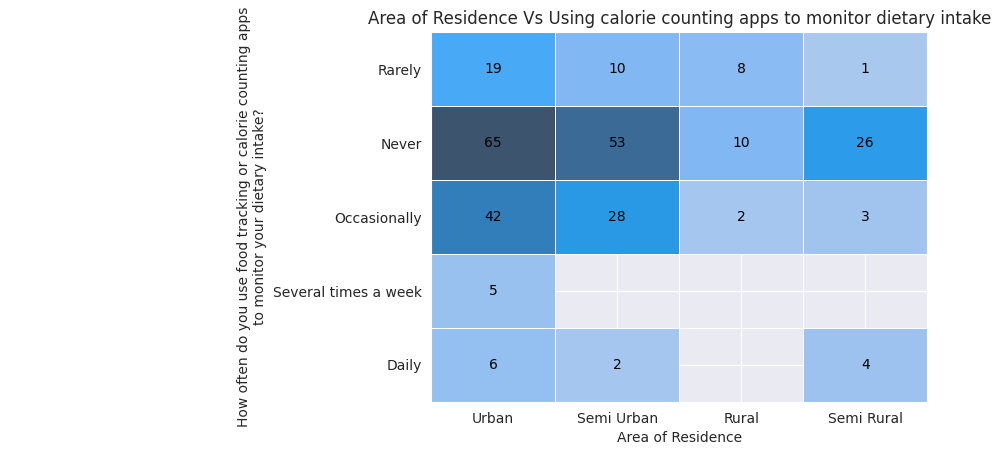

In [ ]:
# plt.figure(figsize=(15,6))
ax=sns.histplot(data, y='How often do you use food tracking or calorie counting apps to monitor your dietary intake?',
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Area of Residence Vs Using calorie counting apps to monitor dietary intake')
plt.xlabel('Area of Residence',wrap=False)
plt.ylabel('How often do you use food tracking or calorie counting apps to monitor your dietary intake?',wrap=True)
# plt.xticks(rotation=30)
plt.show()

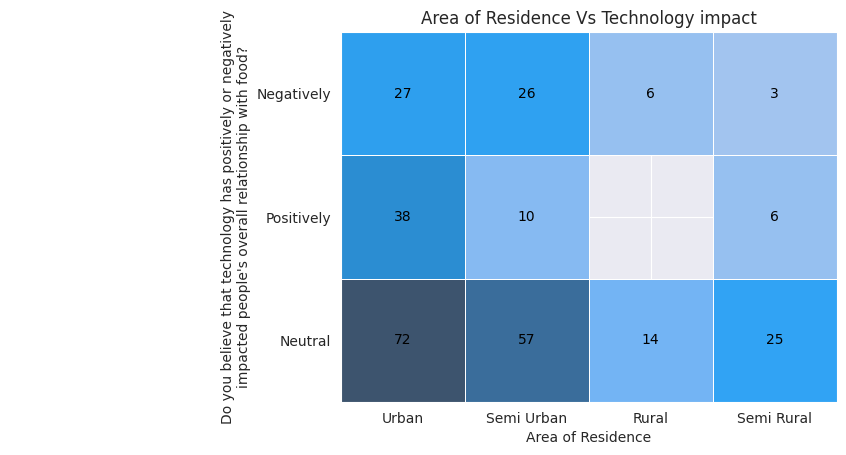

In [ ]:
# plt.figure(figsize=(15,6))
ax=sns.histplot(data, y="Do you believe that technology has positively or negatively impacted people's overall relationship with food?",
                x='Area of Residence',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
# sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Area of Residence Vs Technology impact')
plt.xlabel('Area of Residence',wrap=False)
plt.ylabel("Do you believe that technology has positively or negatively impacted people's overall relationship with food?",wrap=True)
# plt.xticks(rotation=30)
plt.show()

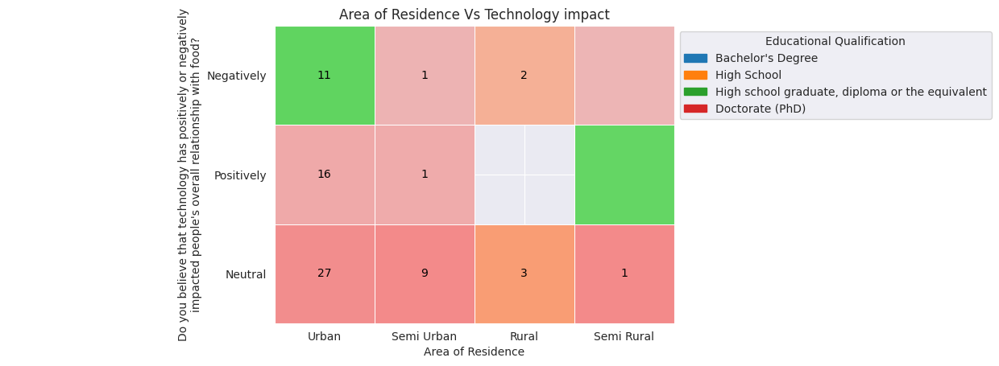

In [ ]:
# plt.figure(figsize=(15,6))
ax=sns.histplot(data, y="Do you believe that technology has positively or negatively impacted people's overall relationship with food?",
                x='Area of Residence',hue='Educational Qualification',
                edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
ax.margins(x=0, y=0)  # remove unneeded whitespace
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.title('Area of Residence Vs Technology impact')
plt.xlabel('Area of Residence',wrap=False)
plt.ylabel("Do you believe that technology has positively or negatively impacted people's overall relationship with food?",wrap=True)
# plt.xticks(rotation=30)
plt.show()

# Cross-tabulation (Contingency Tables)

## Health

###1

If the joint distribution is independent, it can be written as the outer product of the row and column marginal distributions:

  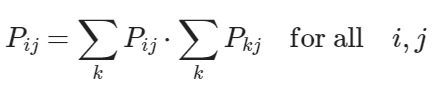

We can obtain the best-fitting independent distribution for our observed data, and then view residuals which identify particular cells that most strongly violate independence:

In [ ]:
df = data[["Area of Residence", "When making food choices, which factor influences you the most?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

"When making food choices, which factor influences you the most?",Convenience,Cost,Environmental Impact,Nutritional Value,Taste and Flavour
Area of Residence,,,,,
Rural,0.696335,0.549738,0.842932,13.267016,5.643979
Semi Rural,1.160558,0.916230,1.404887,22.111693,9.406632
Semi Urban,3.100349,2.447644,3.753054,59.069808,25.129145
Urban,4.542757,3.586387,5.499127,86.551483,36.820244


If the rows and columns of a table are unordered (i.e. are nominal factors), then the most common approach for formally assessing independence is using Pearson’s $χ^2$
 statistic. It’s often useful to look at the cell-wise contributions to the $\chi^2$
 statistic to see where the evidence for dependence is coming from.

In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.0011548593606156565


"When making food choices, which factor influences you the most?",Convenience,Cost,Environmental Impact,Nutritional Value,Taste and Flavour
Area of Residence,,,,,
Rural,0.132425,0.004500,0.139516,1.372383,3.361975
Semi Rural,0.375972,0.189088,0.252092,1.080675,2.064331
Semi Urban,0.261058,1.549783,0.016249,3.773681,7.944271
Urban,0.064847,1.624344,0.045303,2.794275,5.460732


###2

In [ ]:
df = data[["Area of Residence", "Do you believe there is a stigma associated with talking about food insecurity or mental health?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

Do you believe there is a stigma associated with talking about food insecurity or mental health?,No,Yes
Area of Residence,,
Rural,9.577465,10.422535
Semi Rural,16.281690,17.718310
Semi Urban,44.535211,48.464789
Urban,65.605634,71.394366


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.00016781312768765488


Do you believe there is a stigma associated with talking about food insecurity or mental health?,No,Yes
Area of Residence,,
Rural,3.070112,2.821184
Semi Rural,0.181344,0.166641
Semi Urban,2.458994,2.259616
Urban,4.724569,4.341496


## Socialogy

###1

In [ ]:
df = data[["Area of Residence", "To what extent do cultural traditions influence your food choices?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

To what extent do cultural traditions influence your food choices?,Slightly,Somewhat,To a great extent,Very Much
Area of Residence,,,,
Rural,0.492958,8.098592,9.295775,2.112676
Semi Rural,0.838028,13.767606,15.802817,3.591549
Semi Urban,2.292254,37.658451,43.225352,9.823944
Urban,3.376761,55.475352,63.676056,14.471831


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.7100574267952384


To what extent do cultural traditions influence your food choices?,Slightly,Somewhat,To a great extent,Very Much
Area of Residence,,,,
Rural,0.521529,0.149026,0.312441,0.586009
Semi Rural,0.031305,0.361979,0.497113,0.046451
Semi Urban,0.037261,0.355412,1.061781,0.811757
Urban,0.042037,0.114895,0.505961,0.860152


For tables with ordered row and column factors, we can us the linear by linear association test to obtain more power against alternative hypotheses that respect the ordering. The test statistic for the linear by linear association test is
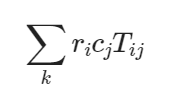

where $r_i$
 and $c_j$
 are row and column scores. Often these scores are set to the sequences 0, 1, …. This gives the ‘Cochran-Armitage trend test’.

In [ ]:
rslt = table.test_ordinal_association()
print(rslt.pvalue)
table.local_oddsratios

0.579913113799386


To what extent do cultural traditions influence your food choices?,Slightly,Somewhat,To a great extent,Very Much
Area of Residence,,,,
Rural,2.285714,0.517045,3.384615,NaN
Semi Rural,1.062500,1.809955,0.455000,NaN
Semi Urban,1.137255,0.680000,2.216749,NaN
Urban,NaN,NaN,NaN,NaN


###2

In [ ]:
df = data[["Area of Residence", "Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?,"No, never","Yes, frequently","Yes, occasionally"
Area of Residence,,,
Rural,16.338028,1.690141,1.971831
Semi Rural,27.774648,2.873239,3.352113
Semi Urban,75.971831,7.859155,9.169014
Urban,111.915493,11.577465,13.507042


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.1477937625438116


Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?,"No, never","Yes, frequently","Yes, occasionally"
Area of Residence,,,
Rural,0.681994,1.015141,2.086117
Semi Rural,0.113390,3.402651,0.545390
Semi Urban,0.213581,1.040159,0.149045
Urban,0.010509,0.214934,0.017991


In [ ]:
rslt = table.test_ordinal_association()
print(rslt.pvalue)
table.local_oddsratios

0.22821769434573147


Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?,"No, never","Yes, frequently","Yes, occasionally"
Area of Residence,,,
Rural,1.000000,0.250,NaN
Semi Rural,0.270833,4.800,NaN
Semi Urban,1.415929,0.875,NaN
Urban,NaN,NaN,NaN


###3

In [ ]:
df = data[["Area of Residence", "Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

"Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",No,Yes
Area of Residence,,
Rural,17.957746,2.042254
Semi Rural,30.528169,3.471831
Semi Urban,83.503521,9.496479
Urban,123.010563,13.989437


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.4625483493680932


"Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",No,Yes
Area of Residence,,
Rural,0.051080,0.449150
Semi Rural,0.200141,1.759863
Semi Urban,0.003036,0.026698
Urban,0.008302,0.073001


## Economics

###1

In [ ]:
df = data[["What is your Annual Income?", "How frequently do you skip meals due to financial constraints or lack of access to food?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

How frequently do you skip meals due to financial constraints or lack of access to food?,Never,Often,Rarely,Sometimes
What is your Annual Income?,,,,
INR 1-5 Lakhs,3.285467,0.506055,0.467128,0.241349
INR 5-15 Lakhs,10.221453,1.574394,1.453287,0.750865
Less than INR 1 Lakh,21.903114,3.373702,3.114187,1.608997
More than INR 15 Lakhs,19.712803,3.036332,2.802768,1.448097
None as of now (Student),154.051903,23.728374,21.903114,11.316609
Prefer not to Say,1.825260,0.281142,0.259516,0.134083


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

0.3245651939130898


How frequently do you skip meals due to financial constraints or lack of access to food?,Never,Often,Rarely,Sometimes
What is your Annual Income?,,,,
INR 1-5 Lakhs,0.502950,0.482124,0.607869,0.277192
INR 5-15 Lakhs,0.309470,0.733186,0.625311,0.082662
Less than INR 1 Lakh,1.697111,2.447805,2.194465,0.230502
More than INR 15 Lakhs,0.265374,0.305848,1.891966,0.620737
None as of now (Student),0.420853,0.217473,1.186053,0.041269
Prefer not to Say,0.373127,0.170373,0.222849,0.998599


In [ ]:
rslt = table.test_ordinal_association()
print(rslt.pvalue)
table.local_oddsratios

0.08214629365807585


How frequently do you skip meals due to financial constraints or lack of access to food?,Never,Often,Rarely,Sometimes
What is your Annual Income?,,,,
INR 1-5 Lakhs,0.083333,1.000000,4.000000,NaN
INR 5-15 Lakhs,0.428571,1.000000,1.000000,NaN
Less than INR 1 Lakh,10.181818,0.125000,0.500000,NaN
More than INR 15 Lakhs,0.979452,8.307692,0.444444,NaN
None as of now (Student),2.807692,0.962963,2.250000,NaN
Prefer not to Say,NaN,NaN,NaN,NaN


###2

In [ ]:
df = data[["What is your Annual Income?", "On average, how much of your monthly income do you allocate towards purchasing food?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

"On average, how much of your monthly income do you allocate towards purchasing food?",10% - 20%,20% - 30%,30% - 40%,Less than 10%,More than 40%
What is your Annual Income?,,,,,
INR 1-5 Lakhs,1.398964,1.692573,0.829016,0.768566,0.310881
INR 5-15 Lakhs,4.056995,4.908463,2.404145,2.228843,0.901554
Less than INR 1 Lakh,8.253886,9.986183,4.891192,4.534542,1.834197
More than INR 15 Lakhs,7.414508,8.970639,4.393782,4.073402,1.647668
None as of now (Student),59.036269,71.426598,34.984456,32.433506,13.119171
Prefer not to Say,0.839378,1.015544,0.497409,0.461140,0.186528


In [ ]:
rslt = table.test_ordinal_association()
print(rslt.pvalue)
table.local_oddsratios

0.0003428352997384551


"On average, how much of your monthly income do you allocate towards purchasing food?",10% - 20%,20% - 30%,30% - 40%,Less than 10%,More than 40%
What is your Annual Income?,,,,,
INR 1-5 Lakhs,0.222222,0.062500,4.000000,0.500000,NaN
INR 5-15 Lakhs,1.650000,1.454545,0.500000,0.500000,NaN
Less than INR 1 Lakh,1.115702,1.833333,2.000000,0.333333,NaN
More than INR 15 Lakhs,1.955556,1.666667,0.975000,2.307692,NaN
None as of now (Student),1.250000,0.900000,1.025641,2.600000,NaN
Prefer not to Say,NaN,NaN,NaN,NaN,NaN


## Technology

###1

In [ ]:
df = data[["Area of Residence", "How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?",Daily,Never,Occasionally,Rarely,Several times a week
Area of Residence,,,,,
Rural,2.816901,2.253521,8.380282,4.859155,1.690141
Semi Rural,4.788732,3.830986,14.246479,8.260563,2.873239
Semi Urban,13.098592,10.478873,38.968310,22.595070,7.859155
Urban,19.295775,15.436620,57.404930,33.285211,11.577465


In [ ]:
rslt = table.test_nominal_association()
print(rslt.pvalue)
table.chi2_contribs

8.088874015044212e-11


"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?",Daily,Never,Occasionally,Rarely,Several times a week
Area of Residence,,,,,
Rural,1.171901,0.247271,0.017256,0.151909,3.156808
Semi Rural,36.447556,0.007457,7.369563,1.286991,0.005592
Semi Urban,5.007194,2.908981,0.914095,4.791424,0.439800
Urban,0.562928,2.683882,4.797434,1.186830,0.028803


###2

In [ ]:
df = data[["Educational Qualification", "How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?"]]
table = sm.stats.Table.from_data(df)
table.fittedvalues

"How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",Daily,Neve,Occasionally,Rarely,Several times a week
Educational Qualification,,,,,
Bachelor's Degree,3.369069,9.233743,38.432337,15.472759,4.492091
Doctorate (PhD),3.369069,9.233743,38.432337,15.472759,4.492091
High School,3.392794,9.298770,38.702988,15.581722,4.523726
"High school graduate, diploma or the equivalent",3.369069,9.233743,38.432337,15.472759,4.492091


In [ ]:
rslt = table.test_ordinal_association()
print(rslt.pvalue)
table.local_oddsratios

0.5465729967944162


"How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",Daily,Neve,Occasionally,Rarely,Several times a week
Educational Qualification,,,,,
Bachelor's Degree,0.571429,0.648649,0.283991,0.301587,NaN
Doctorate (PhD),33.250000,0.307018,2.742857,1.500000,NaN
High School,0.039474,3.076190,1.617647,1.060606,NaN
"High school graduate, diploma or the equivalent",NaN,NaN,NaN,NaN,NaN


# Sentiment or Likert Scale Analysis

In [ ]:
mydict = {}
for column in data.columns[1:]:
    count = data[column].value_counts()
    mydict[column] = columndict = {}
    for i in range(len(count)):
        columndict[count.index[i]] = count[i]
mydict
pd.DataFrame(mydict).to_csv('abc.csv')

# Cluster Analysis

In [ ]:
# Preprocessing the data for cluster analysis

# 1. Encoding categorical variables using one-hot encoding
data_encoded = pd.get_dummies(data, drop_first=True)

# 2. Normalizing the data (since we have mixed categorical and numerical data)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_encoded)

# Inspect the preprocessed data
pd.DataFrame(data_scaled, columns=data_encoded.columns).head()


,Age,Area of Residence_Semi Rural,Area of Residence_Semi Urban,Area of Residence_Urban,What is your Annual Income?_INR 5-15 Lakhs,What is your Annual Income?_Less than INR 1 Lakh,What is your Annual Income?_More than INR 15 Lakhs,What is your Annual Income?_None as of now (Student),What is your Annual Income?_Prefer not to Say,"On average, how much of your monthly income do you allocate towards purchasing food?_20% - 30%",...,Do you believe there is a stigma associated with talking about food insecurity or mental health?_Yes,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?_Yes",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being? _Disagree,Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being? _Neutral,Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being? _Strongly agree,Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being? _Strongly disagree,Gender_Male,Educational Qualification_Doctorate (PhD),Educational Qualification_High School,"Educational Qualification_High school graduate, diploma or the equivalent"
0,0.687968,-0.368782,-0.697790,1.035854,-0.219022,-0.337232,-0.317451,-1.700121,-0.059444,-0.725866,...,0.958603,-0.244339,-0.330719,-0.965387,-0.296855,-0.059444,-0.731529,-0.57735,-0.577350,-0.577350
1,0.687968,-0.368782,1.433096,-0.965387,-0.219022,-0.337232,-0.317451,0.588193,-0.059444,-0.725866,...,-1.043185,-0.244339,-0.330719,1.035854,-0.296855,-0.059444,1.366999,-0.57735,1.732051,-0.577350
2,-0.121071,-0.368782,-0.697790,1.035854,-0.219022,-0.337232,-0.317451,0.588193,-0.059444,-0.725866,...,0.958603,-0.244339,-0.330719,-0.965387,3.368653,-0.059444,1.366999,-0.57735,-0.577350,1.732051
3,0.283448,-0.368782,-0.697790,1.035854,-0.219022,-0.337232,-0.317451,0.588193,-0.059444,1.377664,...,-1.043185,-0.244339,-0.330719,1.035854,-0.296855,-0.059444,1.366999,-0.57735,-0.577350,-0.577350
4,0.687968,-0.368782,-0.697790,1.035854,-0.219022,-0.337232,-0.317451,0.588193,-0.059444,-0.725866,...,0.958603,-0.244339,-0.330719,-0.965387,-0.296855,-0.059444,1.366999,-0.57735,-0.577350,1.732051


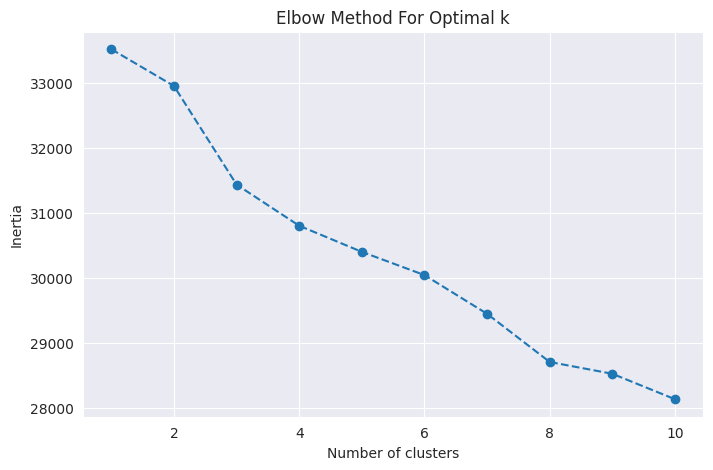

In [ ]:
# Perform K-means clustering and use the Elbow Method to determine the optimal number of clusters

# Range of possible cluster numbers
cluster_range = range(1, 11)
inertia = []

# Perform KMeans for different cluster numbers and store the inertia (within-cluster sum of squares)
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_scaled)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method results
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertia, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()


In [ ]:
# Perform K-means clustering with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(data_scaled)

# Add the cluster labels to the original dataframe
data['Cluster'] = clusters

# Display a few rows of the data with cluster labels
data[['Age', 'Gender', 'Area of Residence', 'Educational Qualification', 'Cluster']].head()

,Age,Gender,Area of Residence,Educational Qualification,Cluster
0,21,Female,Urban,Bachelor's Degree,0
1,21,Male,Semi Urban,High School,0
2,19,Male,Urban,"High school graduate, diploma or the equivalent",0
3,20,Male,Urban,Bachelor's Degree,0
4,21,Male,Urban,"High school graduate, diploma or the equivalent",2


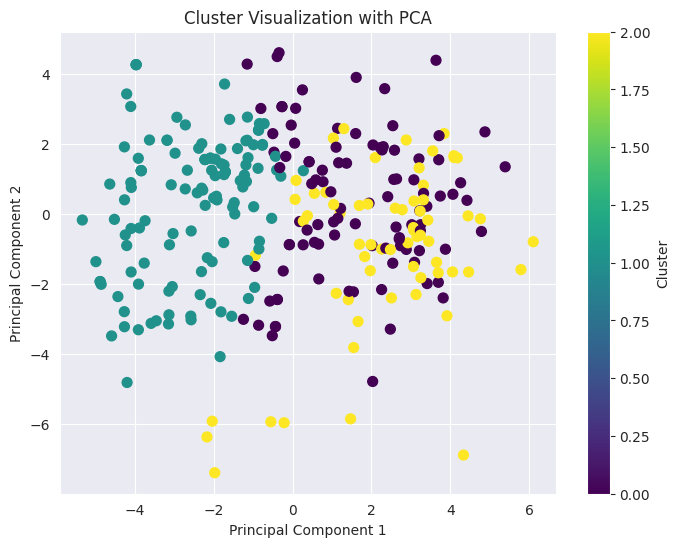

In [ ]:
# Perform PCA to reduce the data to 2 components for visualization
pca = PCA(n_components=2)
pca_components = pca.fit_transform(data_scaled)

# Create a DataFrame with the PCA components and the cluster labels
pca_df = pd.DataFrame(data=pca_components, columns=['PC1', 'PC2'])
pca_df['Cluster'] = clusters

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=pca_df['Cluster'], cmap='viridis', s=50)
plt.title('Cluster Visualization with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.grid(True)
plt.show()


In [ ]:
# Create a copy of the dataset to avoid overwriting the original data
data_numerical = data.copy()

# Identify all categorical columns
categorical_columns = data_numerical.select_dtypes(include=['object']).columns

# Initialize the LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each categorical column
for column in categorical_columns:
    data_numerical[column] = le.fit_transform(data_numerical[column])

# Check the first few rows of the transformed data
data_numerical.head()


,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification,Cluster
0,21,3,0,4,17,2,3,0,0,3,...,0,2,3,1,1,0,0,0,0,0
1,21,2,4,3,11,2,3,0,0,1,...,0,2,2,3,0,0,2,1,2,0
2,19,3,4,0,17,0,3,0,0,1,...,0,4,3,3,1,0,3,1,3,0
3,20,3,4,1,4,1,2,3,0,2,...,0,2,3,2,0,0,2,1,0,0
4,21,3,4,0,14,0,4,2,0,4,...,2,2,4,3,1,0,0,1,3,2


Are certain clusters dominated by a particular age group, gender, or income bracket?

In [ ]:
# Calculate the distribution of age, gender, and income across clusters
demographic_summary = data_numerical.groupby('Cluster').agg({
    'Age': 'mean',
    'Gender': lambda x: x.mode()[0],  # Mode for categorical values like Gender
    'What is your Annual Income?': 'mean'
})

demographic_summary

,Age,Gender,What is your Annual Income?
Cluster,,,
0,19.030303,1,3.59596
1,19.016529,0,3.53719
2,20.250000,1,3.34375


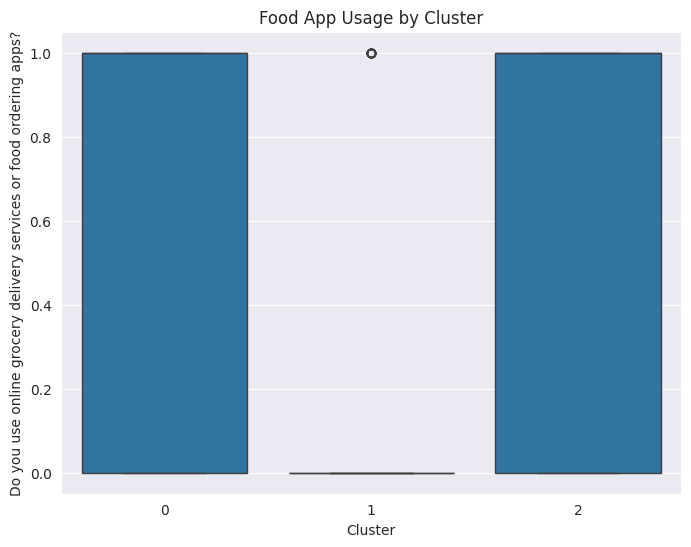

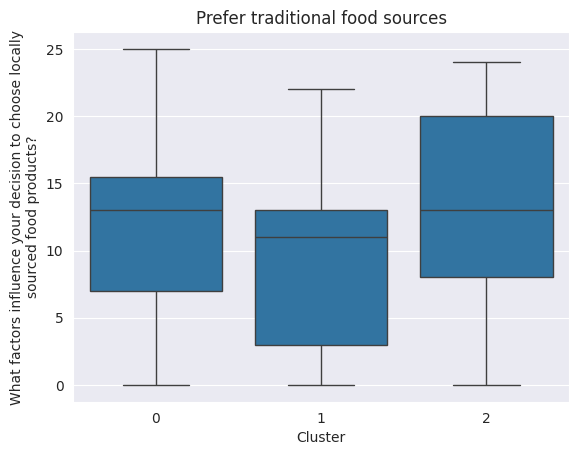

In [ ]:
# Visualize the distribution of app usage across clusters
plt.figure(figsize=(8, 6))
sns.boxplot(x='Cluster',
            y='Do you use online grocery delivery services or food ordering apps?', data=data_numerical)
plt.title('Food App Usage by Cluster')
plt.ylabel('Do you use online grocery delivery services or food ordering apps?',wrap=True)
plt.show()

# Visualize concern for food justice across clusters
# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='What factors influence your decision to choose locally sourced food products? (Select all that apply)', data=data_numerical)
plt.title('Prefer traditional food sources')
plt.ylabel('What factors influence your decision to choose locally sourced food products?',wrap=True)
plt.show()

Interpretation:

High App Usage Group: If one cluster shows significantly higher app usage, you can infer that people in this group are more tech-savvy and engaged with food-related technology.

Food Justice Concerned Group: If a particular cluster shows higher concern for food justice, this group may be more socially aware and prioritize ethical food practices.

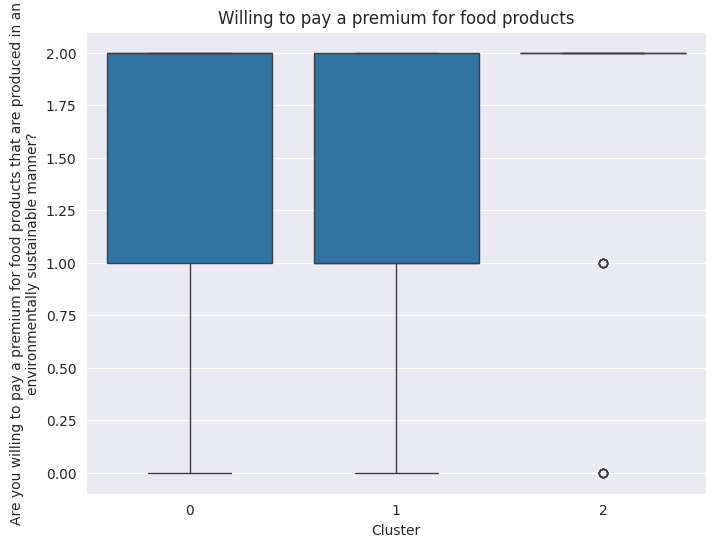

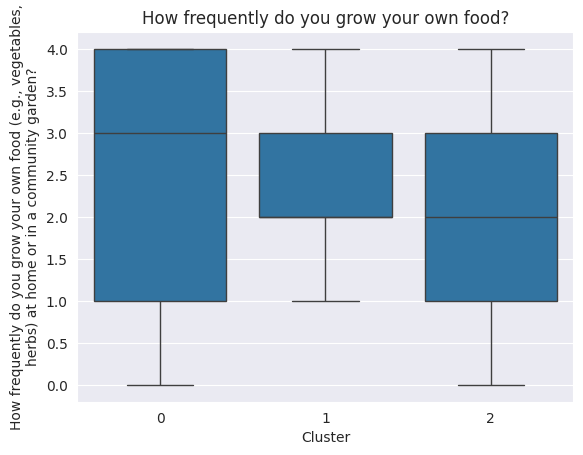

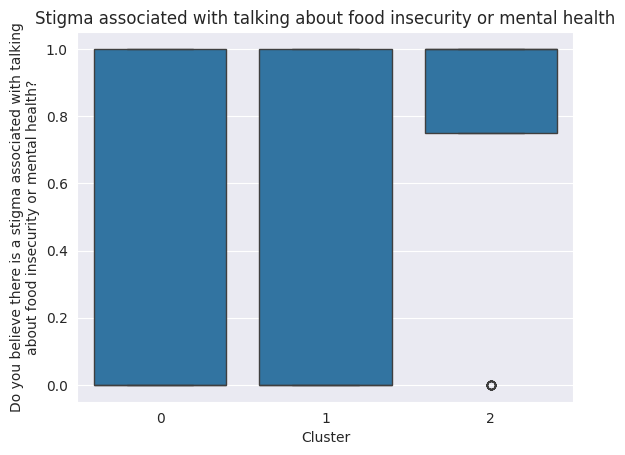

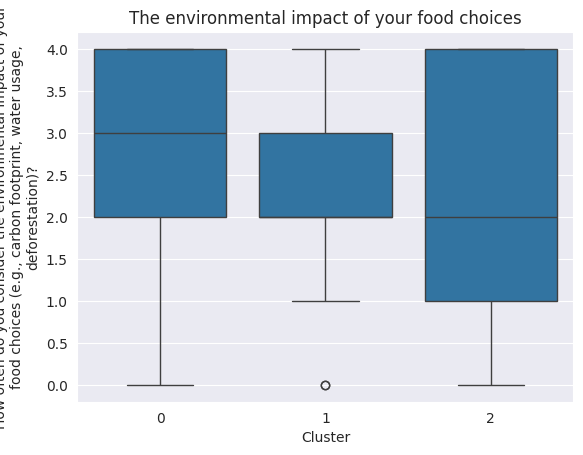

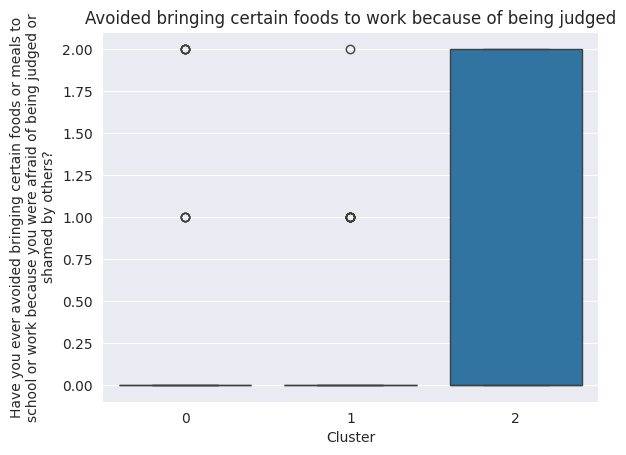

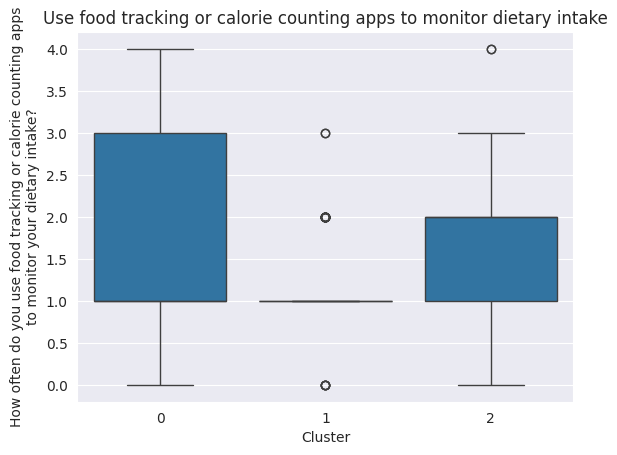

In [ ]:
# Visualize the distribution of app usage across clusters
plt.figure(figsize=(8, 6))
sns.boxplot(x='Cluster',
            y='Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?', data=data_numerical)
plt.title('Willing to pay a premium for food products')
plt.ylabel('Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?',wrap=True)
plt.show()

# Visualize concern for food justice across clusters
# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?', data=data_numerical)
plt.title('How frequently do you grow your own food?')
plt.ylabel('How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',wrap=True)
plt.show()

# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='Do you believe there is a stigma associated with talking about food insecurity or mental health?', data=data_numerical)
plt.title('Stigma associated with talking about food insecurity or mental health')
plt.ylabel('Do you believe there is a stigma associated with talking about food insecurity or mental health?',wrap=True)
plt.show()

# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?', data=data_numerical)
plt.title('The environmental impact of your food choices')
plt.ylabel('How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',wrap=True)
plt.show()

# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?', data=data_numerical)
plt.title('Avoided bringing certain foods to work because of being judged')
plt.ylabel('Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?',wrap=True)
plt.show()

# plt.figure(figsize=(14, 6))
sns.boxplot(x='Cluster',
            y='How often do you use food tracking or calorie counting apps to monitor your dietary intake?', data=data_numerical)
plt.title('Use food tracking or calorie counting apps to monitor dietary intake')
plt.ylabel('How often do you use food tracking or calorie counting apps to monitor your dietary intake?',wrap=True)
plt.show()


In [ ]:
# Explore the behavioral patterns within each cluster (e.g., dietary restrictions, food app usage)
behavioral_summary = data_numerical.groupby('Cluster').agg({
    'Do you use online grocery delivery services or food ordering apps?': 'mean',  # Change to your actual column name
    'Do you believe that food justice and equity should be a priority for government policies?': 'mean'  # Change to your actual column name
})

behavioral_summary


,Do you use online grocery delivery services or food ordering apps?,Do you believe that food justice and equity should be a priority for government policies?
Cluster,,
0,0.606061,1.717172
1,0.181818,1.818182
2,0.593750,1.828125


# Regression Analysis

In [ ]:
data_numerical=data_numerical.drop(['Cluster'],axis=1)
data_numerical.head()

,Age,Area of Residence,What is your Annual Income?,"On average, how much of your monthly income do you allocate towards purchasing food?",What factors influence your decision to choose locally sourced food products? (Select all that apply),"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?,How frequently do you skip meals due to financial constraints or lack of access to food?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,Gender,Educational Qualification
0,21,3,0,4,17,2,3,0,0,3,...,3,0,2,3,1,1,0,0,0,0
1,21,2,4,3,11,2,3,0,0,1,...,3,0,2,2,3,0,0,2,1,2
2,19,3,4,0,17,0,3,0,0,1,...,1,0,4,3,3,1,0,3,1,3
3,20,3,4,1,4,1,2,3,0,2,...,2,0,2,3,2,0,0,2,1,0
4,21,3,4,0,14,0,4,2,0,4,...,4,2,2,4,3,1,0,0,1,3


Column Number to Column Name Mapping:
0: Age
1: Area of Residence
2: What is your Annual Income?
3: On average, how much of your monthly income do you allocate towards purchasing food?
4: What factors influence your decision to choose locally sourced food products? (Select all that apply)
5: Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?
6: How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?
7: How frequently do you skip meals due to financial constraints or lack of access to food?
8: Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?
9: How often do you participate in community events or activities related to food (e.g., food drives, community meals)?
10: Do you believe that food justice and equity should be a priority for government policies?
11: How often do yo

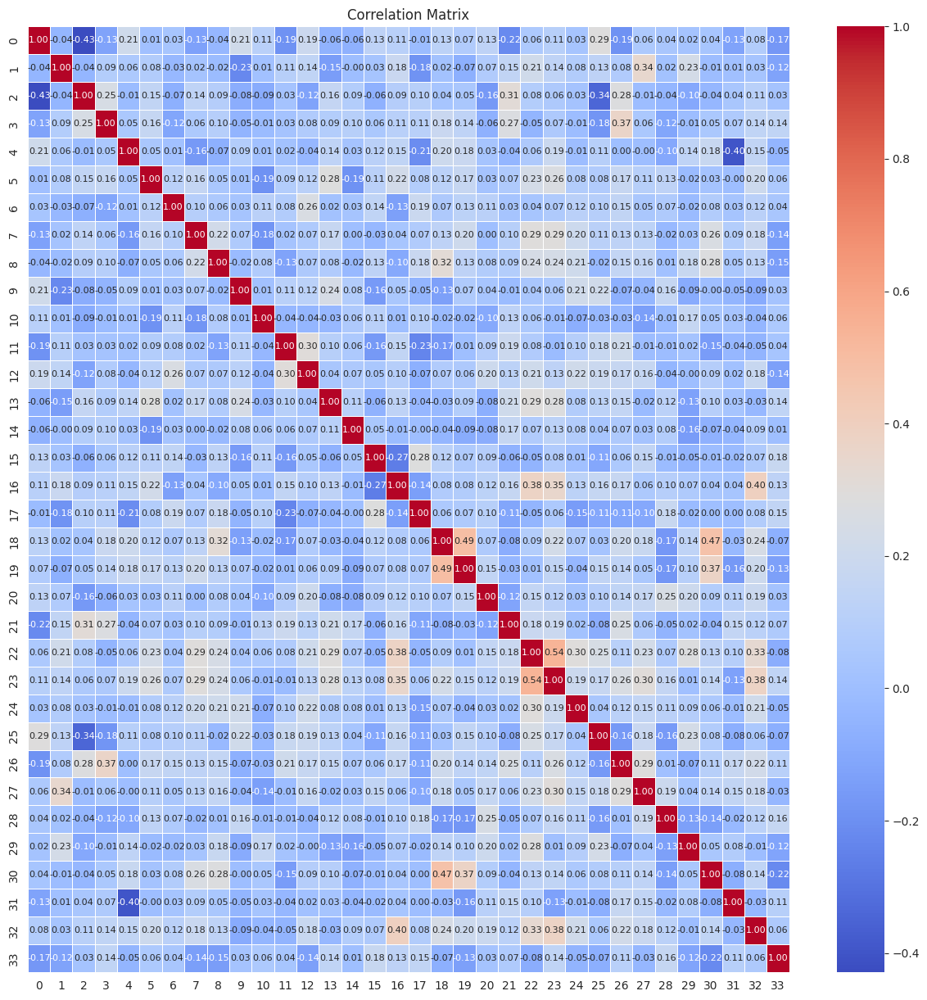

In [ ]:
# Assuming 'data' is your DataFrame

heatmap_data = data_numerical.copy()

# Step 1: Rename columns with numbers based on their order
heatmap_data.columns = range(heatmap_data.shape[1])

# Step 1: Create a mapping of column numbers to column names
column_mapping = {i: name for i, name in enumerate(data_numerical.columns)}

# Step 2: Display the mapping
print("Column Number to Column Name Mapping:")
for col_num, col_name in column_mapping.items():
    print(f"{col_num}: {col_name}")

# Plot a correlation matrix to explore relationships between variables
plt.figure(figsize=(15,15))
sns.heatmap(heatmap_data.corr(), annot=True, cmap="coolwarm",linewidth=0.5,fmt=".2f", annot_kws={"size": 8})
plt.title('Correlation Matrix')
plt.show()


Predicting App Usage:

Dependent Variable: App usage frequency (continuous).


Independent Variables: Age, gender, income, educational qualification, food justice attitudes, eating out frequency.

In [ ]:
# Assuming 'data_numerical' is the DataFrame and 'TargetColumn' is the dependent variable

# Step 1: Split the dataset into features (X) and target (y)
X = data_numerical[['Age','Gender', 'What is your Annual Income?', 'Educational Qualification', 'Do you believe that food justice and equity should be a priority for government policies?',
                    'On average, how much of your monthly income do you allocate towards purchasing food?']]  # Replace 'TargetColumn' with your actual target column
y = data_numerical['Do you use online grocery delivery services or food ordering apps?']

# Step 2: Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Create and train the Linear Regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Step 4: Make predictions on the testing set
y_pred = regressor.predict(X_test)

# Step 5: Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Add a constant to the model (for intercept)
X_train_sm = sm.add_constant(X_train)

# Fit the model using OLS (Ordinary Least Squares)
model = sm.OLS(y_train, X_train_sm).fit()

# Print the detailed summary
print(model.summary())


                                                    OLS Regression Results                                                    
Dep. Variable:     Do you use online grocery delivery services or food ordering apps?   R-squared:                       0.116
Model:                                                                            OLS   Adj. R-squared:                  0.092
Method:                                                                 Least Squares   F-statistic:                     4.816
Date:                                                                Mon, 14 Oct 2024   Prob (F-statistic):           0.000122
Time:                                                                        16:24:13   Log-Likelihood:                -147.69
No. Observations:                                                                 227   AIC:                             309.4
Df Residuals:                                                                     220   BIC:                   

Predicting Attitudes Towards Food Justice:

Dependent Variable: Food justice concern (Likert scale or continuous).


Independent Variables: Income, education level, use of organic food, app usage frequency, gender.

In [ ]:
# Step 1: Split the dataset into features (X) and target (y)
X = data_numerical[['Age','Gender', 'What is your Annual Income?', 'Educational Qualification',
                    'Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?',
                    'How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?',
                    'Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?']]  # Replace 'TargetColumn' with your actual target column
y = data_numerical['Do you believe that food justice and equity should be a priority for government policies?']

# Step 2: Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Create and train the Linear Regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Step 4: Make predictions on the testing set
y_pred = regressor.predict(X_test)

# Step 5: Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Add a constant to the model (for intercept)
X_train_sm = sm.add_constant(X_train)

# Fit the model using OLS (Ordinary Least Squares)
model = sm.OLS(y_train, X_train_sm).fit()

# Print the detailed summary
print(model.summary())

                                                                OLS Regression Results                                                               
Dep. Variable:     Do you believe that food justice and equity should be a priority for government policies?   R-squared:                       0.034
Model:                                                                                                   OLS   Adj. R-squared:                  0.003
Method:                                                                                        Least Squares   F-statistic:                     1.113
Date:                                                                                       Mon, 14 Oct 2024   Prob (F-statistic):              0.356
Time:                                                                                               16:24:13   Log-Likelihood:                -141.43
No. Observations:                                                                                   

Predicting Amount Spent on Food:

Dependent Variable: Amount spent on food (continuous).

Independent Variables: Income, age, eating out frequency, organic food preference

In [ ]:
# Step 1: Split the dataset into features (X) and target (y)
X = data_numerical[['Age','Gender', 'What is your Annual Income?', 'Educational Qualification',
                    'How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',
                    'How knowledgeable do you feel about the connection between nutrition and mental health?',
                    'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?']]  # Replace 'TargetColumn' with your actual target column
y = data_numerical['On average, how much of your monthly income do you allocate towards purchasing food?']

# Step 2: Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Create and train the Linear Regression model
regressor = LinearRegression()
regressor.fit(X_train, y_train)

# Step 4: Make predictions on the testing set
y_pred = regressor.predict(X_test)

# Step 5: Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Add a constant to the model (for intercept)
X_train_sm = sm.add_constant(X_train)

# Fit the model using OLS (Ordinary Least Squares)
model = sm.OLS(y_train, X_train_sm).fit()

# Print the detailed summary
print(model.summary())

                                                             OLS Regression Results                                                             
Dep. Variable:     On average, how much of your monthly income do you allocate towards purchasing food?   R-squared:                       0.105
Model:                                                                                              OLS   Adj. R-squared:                  0.076
Method:                                                                                   Least Squares   F-statistic:                     3.654
Date:                                                                                  Mon, 14 Oct 2024   Prob (F-statistic):           0.000945
Time:                                                                                          16:24:13   Log-Likelihood:                -350.48
No. Observations:                                                                                   227   AIC:                    

# Revised Analysis

In [ ]:
import pandas as pd
from collections import Counter
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

df = pd.read_csv('/content/Gastronomy Research Questionnaire.csv.csv')
df = df.drop(df.columns[:3], axis=1)

# Assuming 'Gender' is your label column and 'df' is the feature set
X = df.drop('Gender', axis=1)
y = df['Gender']

# Store original categorical values for reversal
original_categorical_values = {}
for col in X.columns:
    if X[col].dtype == 'object':
        original_categorical_values[col] = X[col].copy()  # Store original values

# Encode categorical features
for col in X.columns:
    if X[col].dtype == 'object':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Apply SMOTE to balance the data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Create a balanced dataframe
balanced_data = pd.DataFrame(X_resampled, columns=X.columns)
balanced_data['Gender'] = y_resampled

# Move 'Gender' column to the first position
cols = list(balanced_data.columns)
cols.insert(0, cols.pop(cols.index('Gender')))
balanced_data = balanced_data.loc[:, cols]

# --- Reverse the label encoding ---
for col in original_categorical_values:
    le = LabelEncoder()
    le.fit(original_categorical_values[col])  # Fit using original values
    balanced_data[col] = le.inverse_transform(balanced_data[col].astype(int))

# Display the updated DataFrame with original categorical values
balanced_data.head()

,Gender,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",How far is the nearest grocery store or market from your residence?,Have you ever experienced shortages or stockouts of essential food items in local shops or markets?,"On average, how much time do you spend traveling to purchase groceries or food items?","On average, how much of your monthly income do you allocate towards purchasing food?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?"
0,Female,21,Urban,Bachelor's Degree,INR 1-5 Lakhs,3 (Moderate),Less than 1km,No,Less than 15 minutes,More than 40%,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,Often,No,Agree,Occasionally
1,Male,21,Semi Urban,High School,None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,Less than 10%,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,Sometimes,No,Neutral,Never
2,Male,19,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,10% - 20%,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,Always,No,Strongly agree,Frequently
3,Male,20,Urban,Bachelor's Degree,None as of now (Student),2 (Limited),1-3 km,Yes,15-30 minutes,20% - 30%,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,Rarely,No,Neutral,Occasionally
4,Male,21,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),3 (Moderate),more than 5km,No,Less than 15 minutes,10% - 20%,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,Always,No,Agree,Never


In [ ]:
# prompt: make a list of columns of balanced data

import pandas as pd

# Assuming 'balanced_data' DataFrame is already created and available in the current environment
# from the provided code.

# Get the list of columns from the balanced dataset.
columns_list = balanced_data.columns.tolist()

# Print the list of columns.
columns_list


['Gender',
 'Age',
 'Area of Residence',
 'Educational Qualification',
 'What is your Annual Income?',
 'On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?',
 'How far is the nearest grocery store or market from your residence?',
 'Have you ever experienced shortages or stockouts of essential food items in local shops or markets?',
 'On average, how much time do you spend traveling to purchase groceries or food items?',
 'On average, how much of your monthly income do you allocate towards purchasing food?',
 'How reliable do you find transportation options to access food retailers or markets in your community?',
 'How frequently do you consume locally sourced food products?',
 'What factors influence your decision to choose locally sourced food products? (Select all that apply)',
 'How frequently do you consume processed or packaged food items?',
 'How frequently do you consume fast food or takeout meals?',
 'Do you fo

In [ ]:
# prompt: balanced data column description in table

# Assuming 'balanced_data' DataFrame is already created and available in the current environment
# from the provided code.

# Generate descriptive statistics for all columns in the balanced dataset.
description = balanced_data.describe(include='all')

# Display the descriptive statistics.
description


,Gender,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",How far is the nearest grocery store or market from your residence?,Have you ever experienced shortages or stockouts of essential food items in local shops or markets?,"On average, how much time do you spend traveling to purchase groceries or food items?","On average, how much of your monthly income do you allocate towards purchasing food?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?"
count,164,164.000000,164,164,164,164,164,164,164,164,...,164,164,164,164,164,164,164,164,164,164
unique,2,NaN,4,5,6,5,4,2,4,5,...,5,3,5,5,5,2,5,2,5,4
top,Female,NaN,Urban,Bachelor's Degree,None as of now (Student),3 (Moderate),Less than 1km,No,15-30 minutes,20% - 30%,...,Never,Neutral,Occasionally,Occasionally,Moderately knowledgeable,Yes,Sometimes,No,Agree,Occasionally
freq,82,NaN,105,67,129,69,96,128,64,49,...,71,85,68,84,52,101,48,149,67,58
mean,NaN,19.408537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,2.571228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,16.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,18.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,19.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,20.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
balanced_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164 entries, 0 to 163
Data columns (total 59 columns):
 #   Column                                                                                                                                                              Non-Null Count  Dtype 
---  ------                                                                                                                                                              --------------  ----- 
 0   Gender                                                                                                                                                              164 non-null    object
 1   Age                                                                                                                                                                 164 non-null    int64 
 2   Area of Residence                                                                                                         

In [ ]:
# balanced_data.to_csv('balanced_data.csv', index=False)

## Descriptive Analysis

In [ ]:
# prompt: Descriptive Analysis: Summarize demographic and socioeconomic data to understand the sample composition.

import pandas as pd

# Load the balanced dataset.
# balanced_data = pd.read_csv('balanced_data.csv')

# Display basic statistics for numerical columns.
numerical_summary = balanced_data.describe()
# print("Numerical Summary:\n", numerical_summary)

# Display basic statistics for categorical columns.
categorical_summary = balanced_data.describe(include=['object'])
# print("\nCategorical Summary:\n", categorical_summary)

# Analyze the distribution of key demographics.
demographics = ['Age', 'Gender', 'Area of Residence', 'Educational Qualification', 'What is your Annual Income?']
for demo in demographics:
  if demo in balanced_data.columns:
    print(f"\nDistribution of {demo}:\n", balanced_data[demo].value_counts(normalize=True) * 100)
  else:
    print(f"Column '{demo}' not found in dataset.")


# Analyze the relationship between demographics and other variables

# Replace 'Yes' and 'No' with 1 and 0 respectively in the column
balanced_data['Do you use online grocery delivery services or food ordering apps?'] = balanced_data['Do you use online grocery delivery services or food ordering apps?'].map({'Yes': 1, 'No': 0})

# Example: Analyze the relationship between income and food app usage
if 'What is your Annual Income?' in balanced_data.columns and 'Do you use online grocery delivery services or food ordering apps?' in balanced_data.columns:
    income_app_usage = balanced_data.groupby('What is your Annual Income?')['Do you use online grocery delivery services or food ordering apps?'].mean()
    print("\nAverage app usage by income level:\n", income_app_usage)
else:
    print("Required columns not found for the analysis")


# Further analysis can be done for other demographic variable combinations as per the need



Distribution of Age:
 Age
18    26.219512
20    23.170732
19    17.682927
21    14.024390
17    10.365854
22     3.048780
16     2.439024
32     0.609756
34     0.609756
26     0.609756
37     0.609756
23     0.609756
Name: proportion, dtype: float64

Distribution of Gender:
 Gender
Female    50.0
Male      50.0
Name: proportion, dtype: float64

Distribution of Area of Residence:
 Area of Residence
Urban         64.024390
Semi Urban    23.170732
Rural          6.707317
Semi Rural     6.097561
Name: proportion, dtype: float64

Distribution of Educational Qualification:
 Educational Qualification
Bachelor's Degree                                  40.853659
High School                                        31.097561
High school graduate, diploma or the equivalent    20.121951
Doctorate (PhD)                                     7.317073
Master’s degree                                     0.609756
Name: proportion, dtype: float64

Distribution of What is your Annual Income?:
 What is your

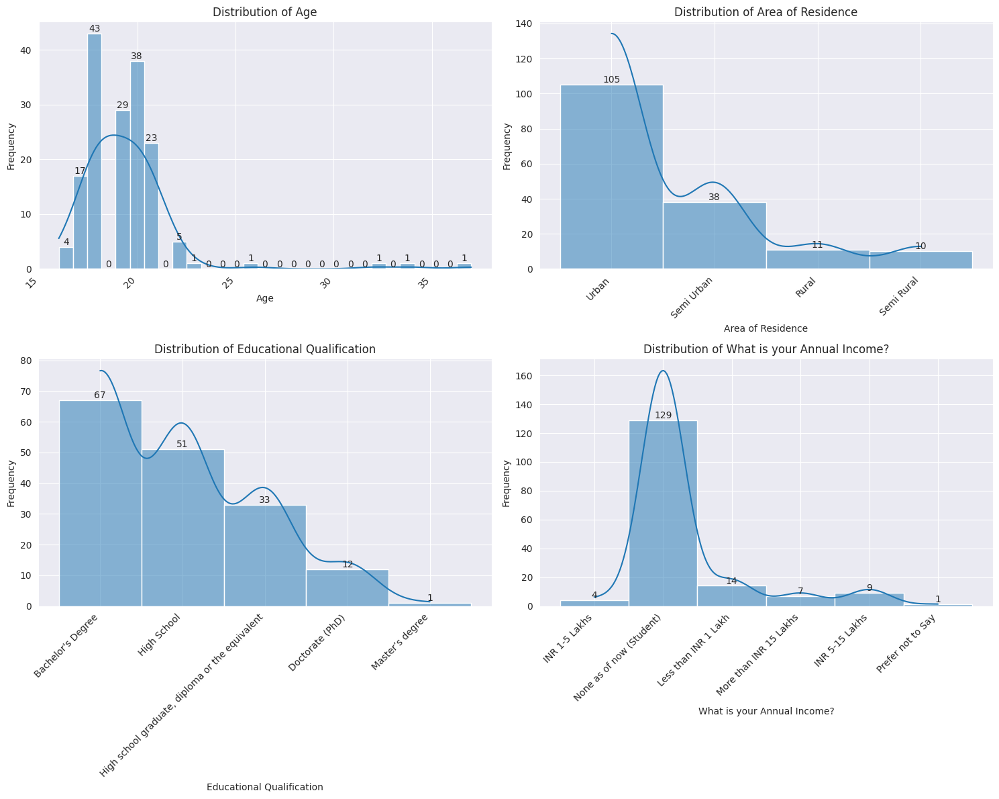

In [ ]:
# ... (previous code for loading and preprocessing the data) ...

# Analyze the distribution of key demographics in a 2x2 grid
demographics = ['Age', 'Area of Residence', 'Educational Qualification', 'What is your Annual Income?']
fig, axes = plt.subplots(2, 2, figsize=(15, 12))  # Create a 2x2 grid of subplots

# Flatten the axes array for easier iteration
axes = axes.flatten()

for i, demo in enumerate(demographics):
    if demo in balanced_data.columns:
        ax = axes[i]  # Get the current subplot axis
        ax=sns.histplot(balanced_data[demo], kde=True, ax=ax)  # Create histogram with KDE
        for p in ax.patches:
           ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
           ha='center', va='center', fontsize=10, xytext=(0, 5), textcoords='offset points')
        ax.set_title(f'Distribution of {demo}')

        # Wrap x-axis label to prevent overlapping
        # ax.set_xlabel('\n'.join(wrap(demo, 20)))  # Adjust wrap width (20 here) as needed
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Rotate 45 degrees
        ax.set_ylabel('Frequency')
    else:
        print(f"Column '{demo}' not found in dataset.")

plt.tight_layout()  # Adjust subplot spacing to prevent overlapping
plt.show()

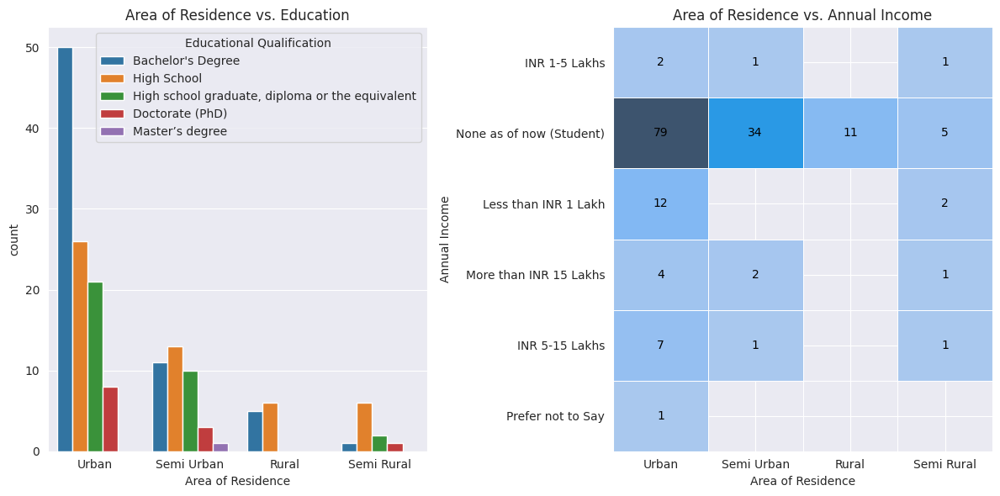

In [ ]:
# prompt: plot the area of residence vs. education and residence vs. annual income in 1*2 grid

# Assuming 'balanced_data' DataFrame is available from the previous code

data = balanced_data
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(x='Area of Residence', hue='Educational Qualification', data=balanced_data)
plt.title('Area of Residence vs. Education')
plt.xticks(rotation=0, ha='center') # Rotates x-axis labels for better readability


plt.subplot(1, 2, 2)
ax=sns.histplot(data, x='Area of Residence', y='What is your Annual Income?', edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
# Add lines between cells
for p in ax.patches:
    plt.gca().add_patch(plt.Rectangle(
        (p.get_x(), p.get_y()),
        p.get_width(),
        p.get_height(),
        fill=False,
        edgecolor='black',  # You can change the color
        linewidth=0.5  # Adjust the line width
    ))

ax.margins(x=0, y=0)  # remove unneeded whitespace
# plt.tight_layout()
plt.title('Area of Residence vs. Annual Income')
plt.xlabel('Area of Residence')
plt.ylabel('Annual Income')
# plt.show()

# sns.scatterplot(x='Area of Residence', y='What is your Annual Income?', data=balanced_data)
# plt.title('Area of Residence vs. Annual Income')
# plt.xticks(rotation=45, ha='right') # Rotates x-axis labels for better readability


plt.tight_layout()
plt.show()


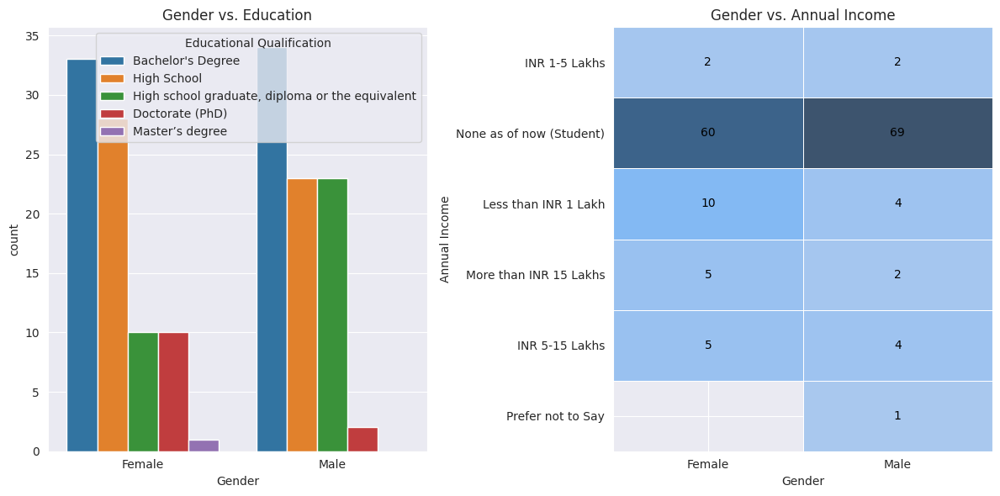

In [ ]:
# prompt: plot the area of residence vs. education and residence vs. annual income in 1*2 grid

# Assuming 'balanced_data' DataFrame is available from the previous code

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(x='Gender', hue='Educational Qualification', data=balanced_data)
plt.title('Gender vs. Education')
plt.xticks(rotation=0, ha='center') # Rotates x-axis labels for better readability


plt.subplot(1, 2, 2)
ax=sns.histplot(data, x='Gender', y='What is your Annual Income?', edgecolor='white', linewidth=0.5)
coords = ax.collections[0].get_coordinates()
half_width = (coords[0, 1, 0] - coords[0, 0, 0]) / 2
half_height = (coords[1, 0, 1] - coords[0, 0, 1]) / 2
for v, (xv, yv) in zip(ax.collections[0].get_array().ravel(), coords[:-1, :-1, :].reshape(-1, 2)):
    if not np.ma.is_masked(v):
        ax.text(xv + half_width, yv + half_height, f'{v:.0f}', ha='center', va='center', color='Black')
# Add lines between cells
for p in ax.patches:
    plt.gca().add_patch(plt.Rectangle(
        (p.get_x(), p.get_y()),
        p.get_width(),
        p.get_height(),
        fill=False,
        edgecolor='black',  # You can change the color
        linewidth=0.5  # Adjust the line width
    ))

ax.margins(x=0, y=0)  # remove unneeded whitespace
# plt.tight_layout()
plt.title('Gender vs. Annual Income')
plt.xlabel('Gender')
plt.ylabel('Annual Income')
# plt.show()

# sns.scatterplot(x='Area of Residence', y='What is your Annual Income?', data=balanced_data)
# plt.title('Area of Residence vs. Annual Income')
# plt.xticks(rotation=45, ha='right') # Rotates x-axis labels for better readability


plt.tight_layout()
plt.show()


## Correlation Analysis

In [ ]:
# prompt: convert balanced data to numerical data

# Assuming 'balanced_data' DataFrame is already created and available.

# Convert relevant columns to numerical representations.
# Example using Label Encoding for categorical features:
from sklearn.preprocessing import LabelEncoder

# Initialize the LabelEncoder object.
le = LabelEncoder()

# Identify columns with object (string) data types
object_columns = balanced_data.select_dtypes(include=['object']).columns

# Iterate through object columns and apply label encoding.
for col in object_columns:
    balanced_data[col] = le.fit_transform(balanced_data[col])

# Now you can proceed with your correlation analysis or other numerical operations
# on the 'balanced_data' DataFrame.


In [ ]:
balanced_data.head()

,Gender,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",How far is the nearest grocery store or market from your residence?,Have you ever experienced shortages or stockouts of essential food items in local shops or markets?,"On average, how much time do you spend traveling to purchase groceries or food items?","On average, how much of your monthly income do you allocate towards purchasing food?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?"
0,0,21,3,0,0,2,2,0,2,4,...,3,0,2,3,1,1,2,0,0,2
1,1,21,2,2,4,3,2,0,2,3,...,3,0,2,2,3,0,4,0,2,1
2,1,19,3,3,4,3,2,0,2,0,...,1,0,4,3,3,1,0,0,3,0
3,1,20,3,0,4,1,0,1,0,1,...,2,0,2,3,2,0,3,0,2,2
4,1,21,3,3,4,2,3,0,2,0,...,4,2,2,4,3,1,0,0,0,1


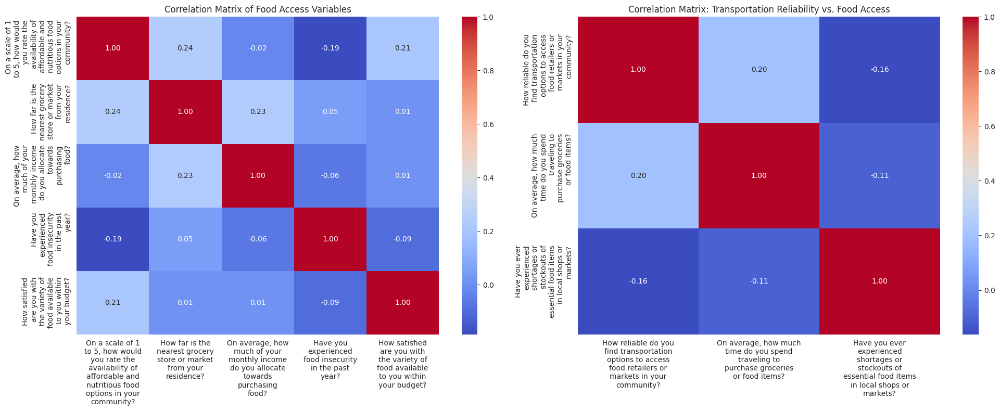

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation1 = [
    'On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?',
    'How far is the nearest grocery store or market from your residence?',
    'On average, how much of your monthly income do you allocate towards purchasing food?',
    'Have you experienced food insecurity in the past year?',
    'How satisfied are you with the variety of food available to you within your budget?'
]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data1 = balanced_data[columns_for_correlation1].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data1.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Food Access Variables')



# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation2 = [
    'How reliable do you find transportation options to access food retailers or markets in your community?',
    'On average, how much time do you spend traveling to purchase groceries or food items?',
    'Have you ever experienced shortages or stockouts of essential food items in local shops or markets?'
]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data2 = balanced_data[columns_for_correlation2].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data2.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix: Transportation Reliability vs. Food Access')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

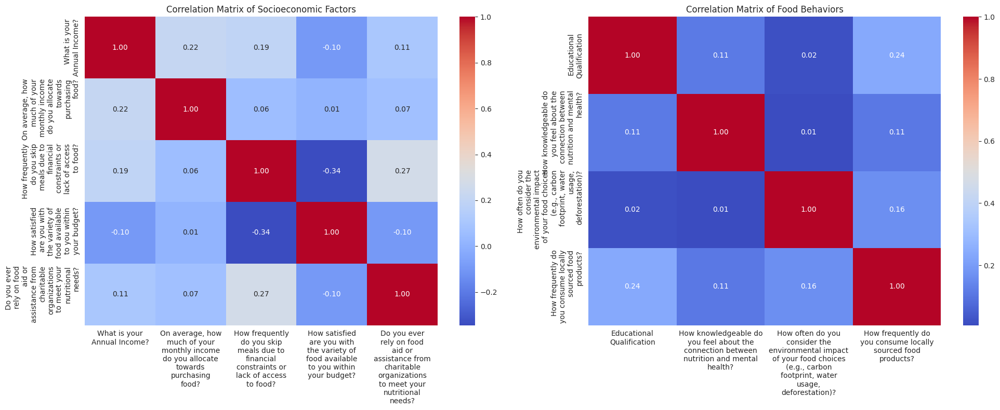

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation3 = [
    'What is your Annual Income?',
    'On average, how much of your monthly income do you allocate towards purchasing food?',
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'How satisfied are you with the variety of food available to you within your budget?',
    'Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data3 = balanced_data[columns_for_correlation3].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data3.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Socioeconomic Factors')



# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation4 = [
    'Educational Qualification',
    'How knowledgeable do you feel about the connection between nutrition and mental health?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'How frequently do you consume locally sourced food products?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data4 = balanced_data[columns_for_correlation4].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data4.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Food Behaviors')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

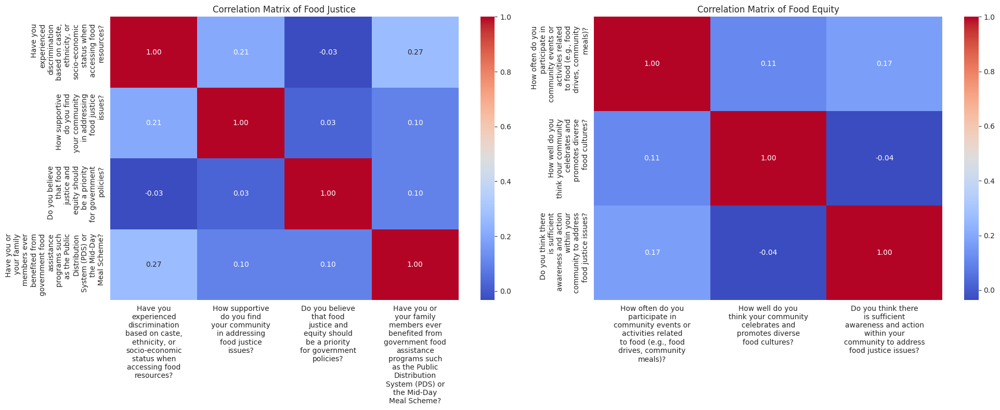

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation5 = [
    'Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?',
    'How supportive do you find your community in addressing food justice issues?',
    'Do you believe that food justice and equity should be a priority for government policies?',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data5 = balanced_data[columns_for_correlation5].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data5.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Food Justice')


# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation6 = [
    'How often do you participate in community events or activities related to food (e.g., food drives, community meals)?',
    'How well do you think your community celebrates and promotes diverse food cultures?',
    'Do you think there is sufficient awareness and action within your community to address food justice issues?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data6 = balanced_data[columns_for_correlation6].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data6.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Food Equity')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

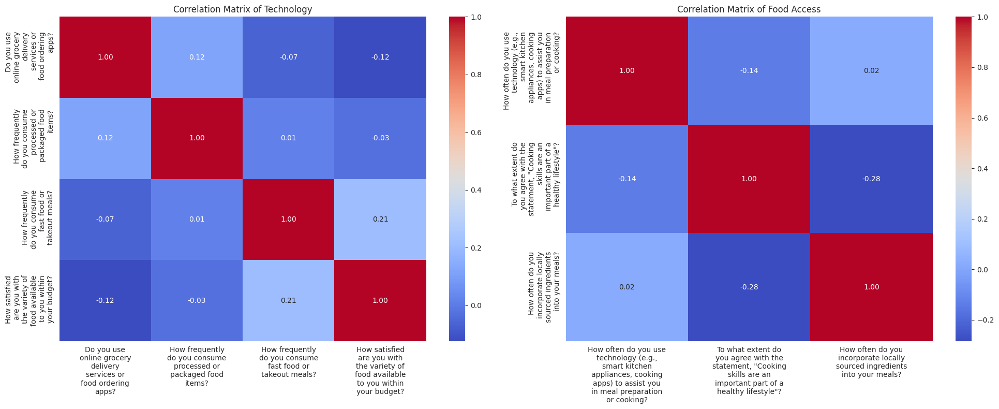

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation = [
    'Do you use online grocery delivery services or food ordering apps?',
    'How frequently do you consume processed or packaged food items?',
    'How frequently do you consume fast food or takeout meals?',
    'How satisfied are you with the variety of food available to you within your budget?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Technology')


# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation = [
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'To what extent do you agree with the statement, "Cooking skills are an important part of a healthy lifestyle"?',
    'How often do you incorporate locally sourced ingredients into your meals?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Food Access')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

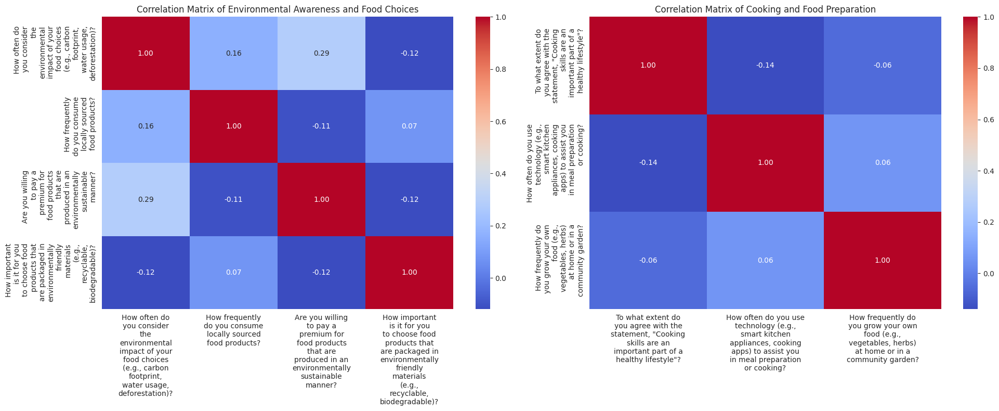

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation = [
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'How frequently do you consume locally sourced food products?',
    'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?',
    'How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Environmental Awareness and Food Choices')


# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation = [
    'To what extent do you agree with the statement, "Cooking skills are an important part of a healthy lifestyle"?',
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Cooking and Food Preparation')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

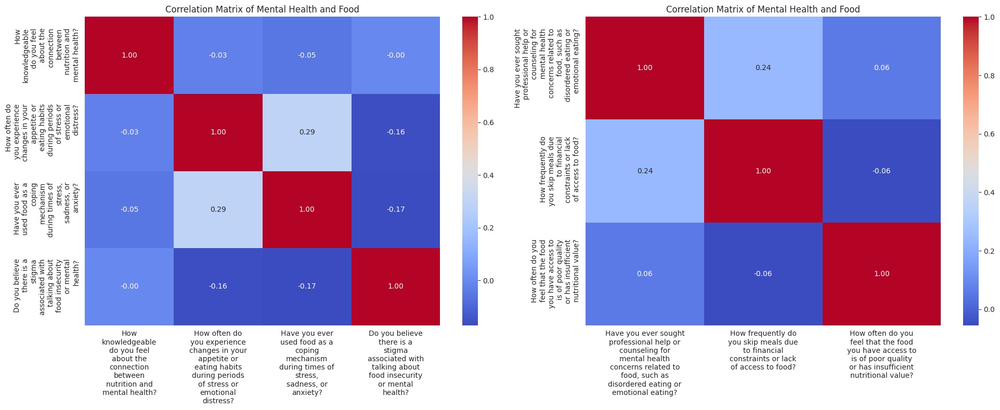

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation = [
    'How knowledgeable do you feel about the connection between nutrition and mental health?',
    'How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?',
    'Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? ',
    'Do you believe there is a stigma associated with talking about food insecurity or mental health?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Mental Health and Food')


# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation = [
    'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?',
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Mental Health and Food')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

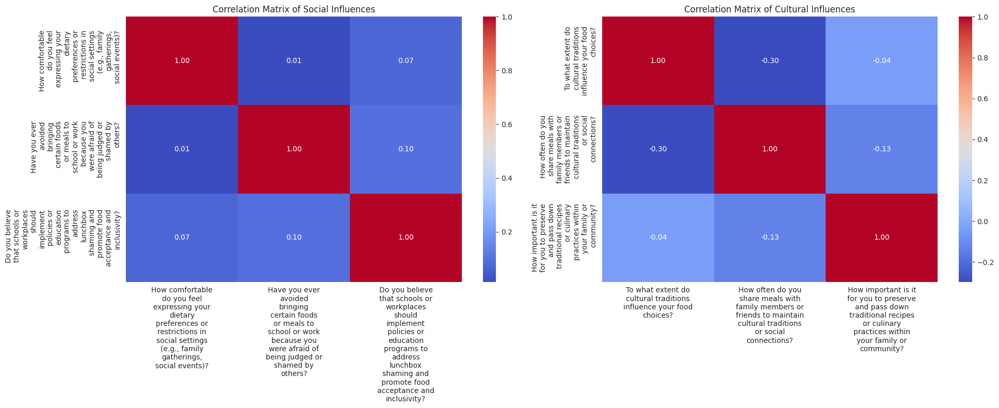

In [ ]:
# ... (Your previous code for data loading, preprocessing, and correlation calculation) ...


# Create a figure with 1 row and 2 columns of subplots
fig, axes = plt.subplots(1, 2, figsize=(20,8))  # Adjust figsize as needed


# --- Heatmap 1: Food Access Variables ---
# Select the relevant columns for correlation analysis
columns_for_correlation = [
    'How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?',
    'Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?',
    'Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the first subplot (axes[0])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[0])

# Wrap x-axis labels for the first heatmap
axes[0].set_xticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_xticklabels() ], rotation=0)
# Wrap y-axis labels for the first heatmap
axes[0].set_yticklabels([ '\n'.join(wrap(label.get_text(), 15)) for label in axes[0].get_yticklabels() ], rotation=90)

axes[0].set_title('Correlation Matrix of Social Influences')


# --- Heatmap 2: Transportation Reliability vs. Food Access ---
columns_for_correlation = [
    'To what extent do cultural traditions influence your food choices?',
    'How often do you share meals with family members or friends to maintain cultural traditions or social connections? ',
    'How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?'
    ]

# ... (Your code for data subsetting and handling non-numeric data) ...
correlation_data = balanced_data[columns_for_correlation].copy()
# Calculate the correlation matrix
correlation_matrix = correlation_data.corr(method='spearman')

# Create the heatmap on the second subplot (axes[1])
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", ax=axes[1])

# Wrap x-axis and y-axis labels for the second heatmap
axes[1].set_xticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_xticklabels()], rotation=0)
axes[1].set_yticklabels(['\n'.join(wrap(label.get_text(), 20)) for label in axes[1].get_yticklabels()], rotation=90)

axes[1].set_title('Correlation Matrix of Cultural Influences')


# Adjust layout and display the figure
plt.tight_layout()
plt.show()

## Comparative Analysis

In [ ]:
df = pd.read_csv('/content/balanced_data.csv')
df.head()

,Gender,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",How far is the nearest grocery store or market from your residence?,Have you ever experienced shortages or stockouts of essential food items in local shops or markets?,"On average, how much time do you spend traveling to purchase groceries or food items?","On average, how much of your monthly income do you allocate towards purchasing food?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?"
0,Female,21,Urban,Bachelor's Degree,INR 1-5 Lakhs,3 (Moderate),Less than 1km,No,Less than 15 minutes,More than 40%,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,Often,No,Agree,Occasionally
1,Male,21,Semi Urban,High School,None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,Less than 10%,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,Sometimes,No,Neutral,Never
2,Male,19,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,10% - 20%,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,Always,No,Strongly agree,Frequently
3,Male,20,Urban,Bachelor's Degree,None as of now (Student),2 (Limited),1-3 km,Yes,15-30 minutes,20% - 30%,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,Rarely,No,Neutral,Occasionally
4,Male,21,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),3 (Moderate),more than 5km,No,Less than 15 minutes,10% - 20%,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,Always,No,Agree,Never


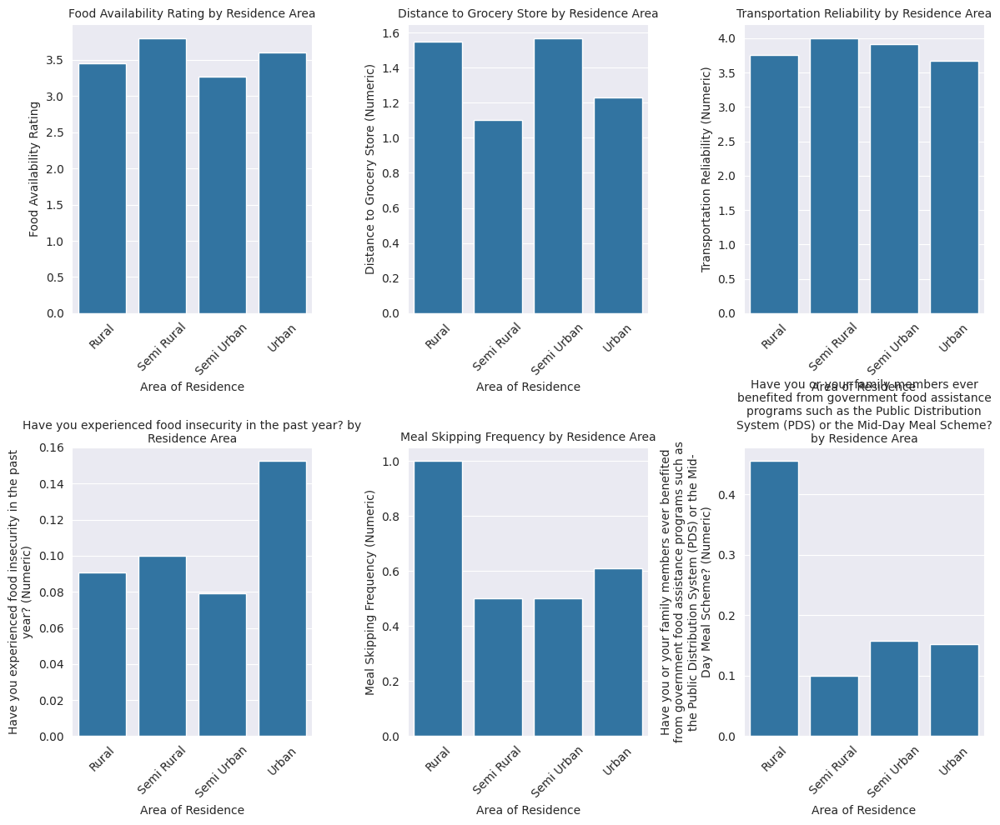

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to extract numeric rating from string
def extract_rating(value):
    try:
        return int(value.split(' ')[0])  # Extract the number before the space
    except (AttributeError, ValueError):
        return None  # Handle missing or invalid values

# Apply the function to the relevant column
df['Food Availability Rating'] = df['On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?'].apply(extract_rating)

# Function to convert distance to numeric value
def distance_to_numeric(value):
    if 'Less than 1km' in value:
        return 0.5  # Assuming 'Less than 1km' is approximately 0.5 km
    elif '1-3 km' in value:
        return 2  # Assuming '1-3 km' is approximately 2 km
    elif '3-5 km' in value:
        return 4  # Assuming '3-5 km' is approximately 4 km
    else:
        return None  # Handle other cases as needed

# Apply the distance conversion function
df['Distance to Grocery Store (Numeric)'] = df['How far is the nearest grocery store or market from your residence?'].apply(distance_to_numeric)

# Function to convert transportation reliability to numeric value
def reliability_to_numeric(value):
    if value == 'Very reliable':
        return 5
    elif value == 'Reliable':
        return 4
    elif value == 'Somewhat reliable':
        return 3
    elif value == 'Unreliable':
        return 2
    elif value == 'Very unreliable':
        return 1
    else:
        return None

# Apply the reliability conversion function
df['Transportation Reliability (Numeric)'] = df['How reliable do you find transportation options to access food retailers or markets in your community?'].apply(reliability_to_numeric)

# Function to convert yes/no to 1/0
def yes_no_to_numeric(value):
    if value == 'Yes':
        return 1
    elif value == 'No':
        return 0
    else:
        return None

# Apply the yes/no conversion function to relevant columns
for column in [
    'Have you experienced food insecurity in the past year?',
    'Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs?',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?'
]:
    df[column + ' (Numeric)'] = df[column].apply(yes_no_to_numeric)

# Function to convert meal skipping frequency to numeric value
def meal_skipping_to_numeric(value):
    if value == 'Never':
        return 0
    elif value == 'Rarely':
        return 1
    elif value == 'Sometimes':
        return 2
    elif value == 'Often':
        return 3
    elif value == 'Very often':
        return 4
    else:
        return None

# Apply the meal skipping conversion function
df['Meal Skipping Frequency (Numeric)'] = df['How frequently do you skip meals due to financial constraints or lack of access to food?'].apply(meal_skipping_to_numeric)


# Now, group data and calculate the mean using the new numeric columns
grouped_data = df.groupby('Area of Residence').agg({
    'Food Availability Rating': 'mean',
    'Distance to Grocery Store (Numeric)': 'mean',
    'Transportation Reliability (Numeric)': 'mean',
    'Have you experienced food insecurity in the past year? (Numeric)': 'mean',
    'Meal Skipping Frequency (Numeric)': 'mean',
    'Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs? (Numeric)': 'mean',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme? (Numeric)': 'mean'
}).reset_index()

plt.figure(figsize=(12, 10))

subplots_data = [
    (231, 'Food Availability Rating'),
    (232, 'Distance to Grocery Store (Numeric)'),
    (233, 'Transportation Reliability (Numeric)'),
    (234, 'Have you experienced food insecurity in the past year? (Numeric)'),
    (235, 'Meal Skipping Frequency (Numeric)'),
    (236, 'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme? (Numeric)')
]

# Loop through the subplots data and create the plots
for subplot_spec, y_label in subplots_data:
    plt.subplot(subplot_spec)
    ax = sns.barplot(x='Area of Residence', y=y_label, data=grouped_data)
    plt.title(y_label.replace(' (Numeric)', '') + ' by Residence Area', fontsize=10, wrap=True) # Remove "(Numeric)" from title
    plt.xticks(rotation=45)
    ax.set_ylabel('\n'.join(wrap(y_label, 50)))  # Wrap y-axis label

plt.tight_layout()
plt.show()


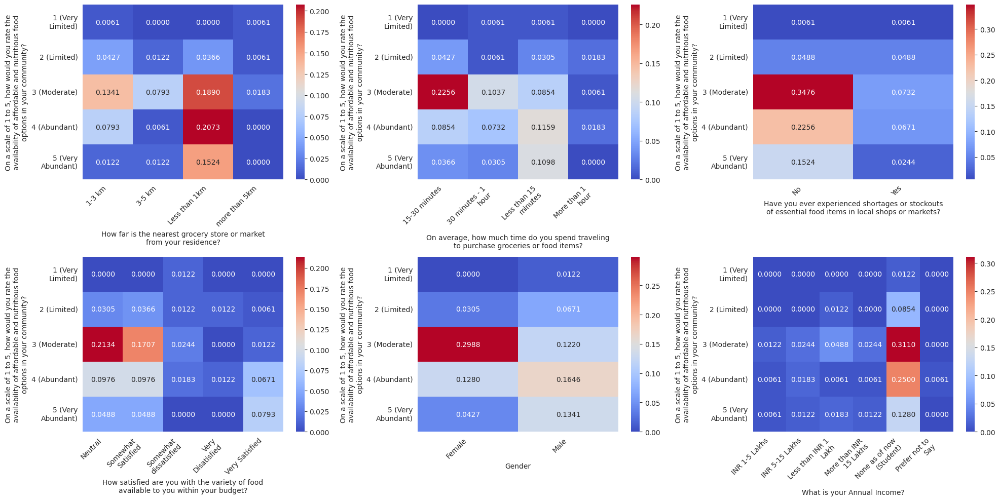

In [ ]:
# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Food Availability Rating'
variables = [
    'How far is the nearest grocery store or market from your residence?',
    'On average, how much time do you spend traveling to purchase groceries or food items?',
    'Have you ever experienced shortages or stockouts of essential food items in local shops or markets?',
    'How satisfied are you with the variety of food available to you within your budget?',
    'Gender',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?'

# Calculate the number of subplots needed
num_subplots = len(variables)

# Calculate rows and columns for the grid to fit all subplots
num_cols = 3  # You can adjust this based on your preference
num_rows = (num_subplots + num_cols - 1) // num_cols

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]  # Use primary_variable for comparison
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i])

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

    # Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

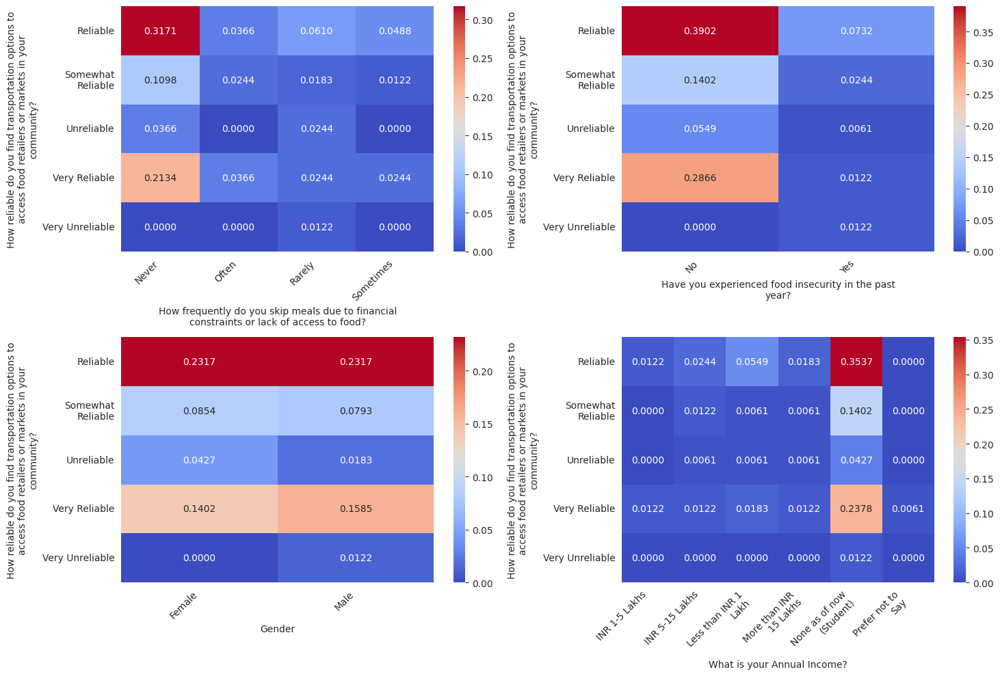

In [ ]:
# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Transportation Reliability'
variables = [
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'Have you experienced food insecurity in the past year?',
    'Gender',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'How reliable do you find transportation options to access food retailers or markets in your community?'

# Calculate the number of subplots needed
num_subplots = len(variables)

# Calculate rows and columns for the grid to fit all subplots
num_cols = 2  # You can adjust this based on your preference
num_rows = (num_subplots + num_cols - 1) // num_cols

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15,10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

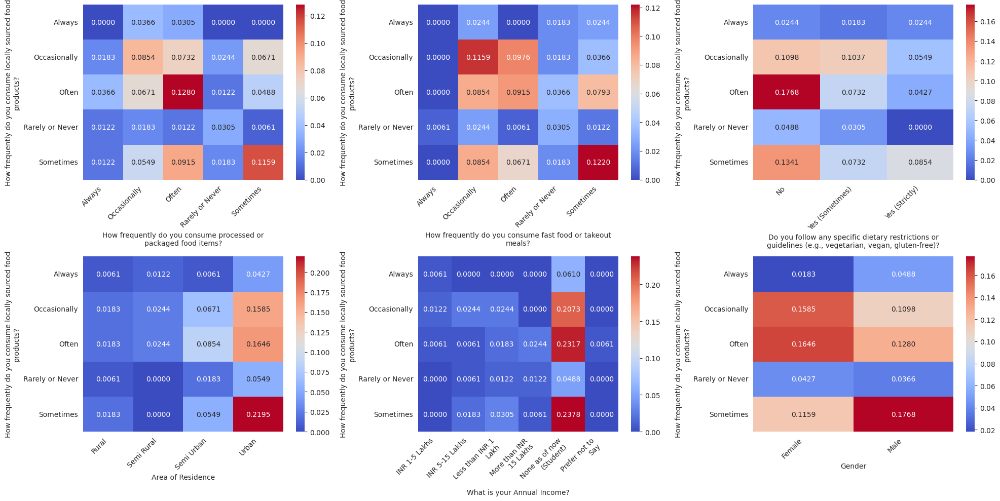

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Locally Sourced Food Consumption'
variables = [
    'How frequently do you consume processed or packaged food items?',
    'How frequently do you consume fast food or takeout meals?',
    'Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?',
    'Area of Residence',
    'What is your Annual Income?',
    'Gender'
]

# Define the primary variable for comparison
primary_variable = 'How frequently do you consume locally sourced food products?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 3 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot
# Adjust layout and display the figure
plt.tight_layout()
plt.show()

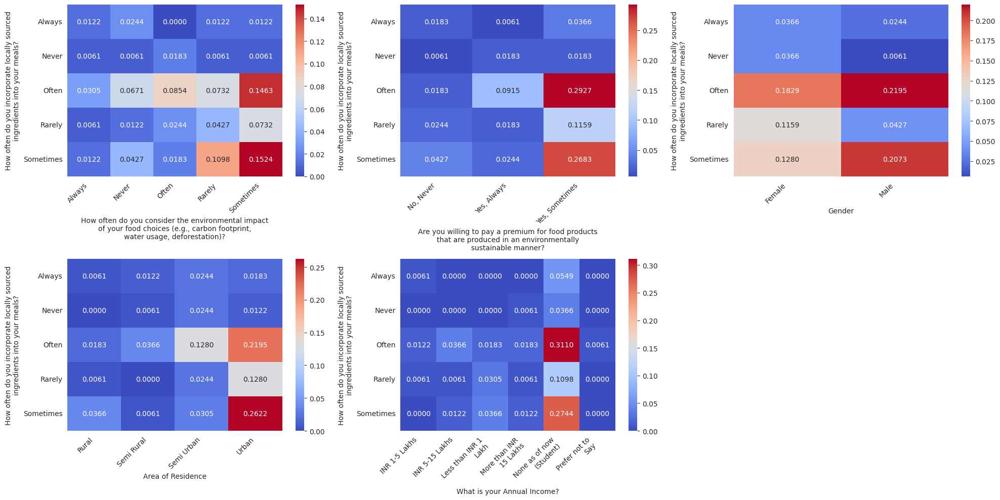

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Locally Sourced Ingredients'
variables = [
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'How often do you incorporate locally sourced ingredients into your meals?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot
# Adjust layout and display the figure
plt.tight_layout()
plt.show()

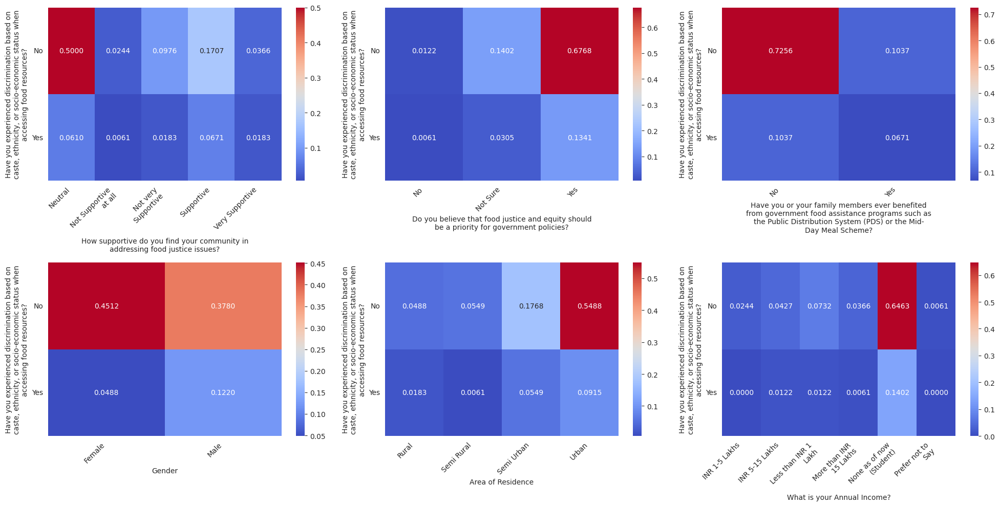

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Food Discrimination'
variables = [
    'How supportive do you find your community in addressing food justice issues?',
    'Do you believe that food justice and equity should be a priority for government policies?',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 3 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

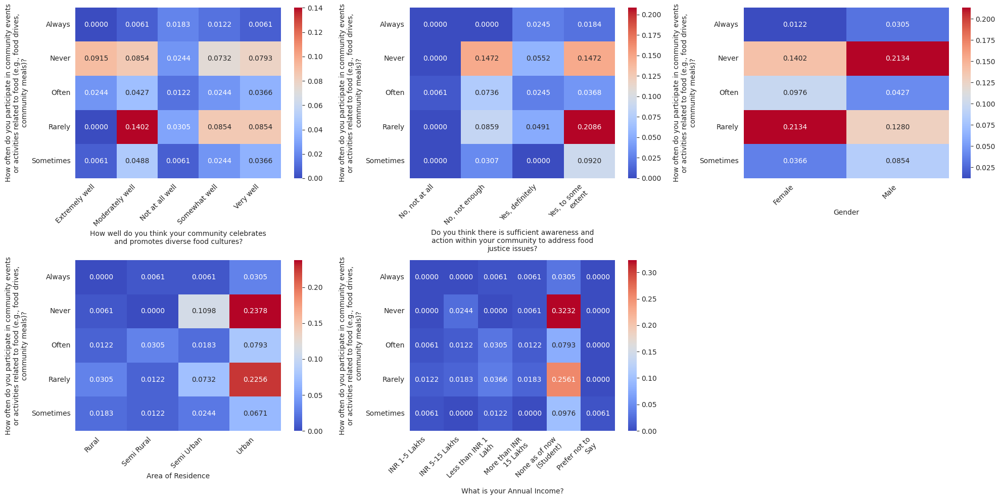

In [ ]:

# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Food-Related Community Participation'
variables = [
    'How well do you think your community celebrates and promotes diverse food cultures?',
    'Do you think there is sufficient awareness and action within your community to address food justice issues?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'

]

# Define the primary variable for comparison
primary_variable = 'How often do you participate in community events or activities related to food (e.g., food drives, community meals)?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

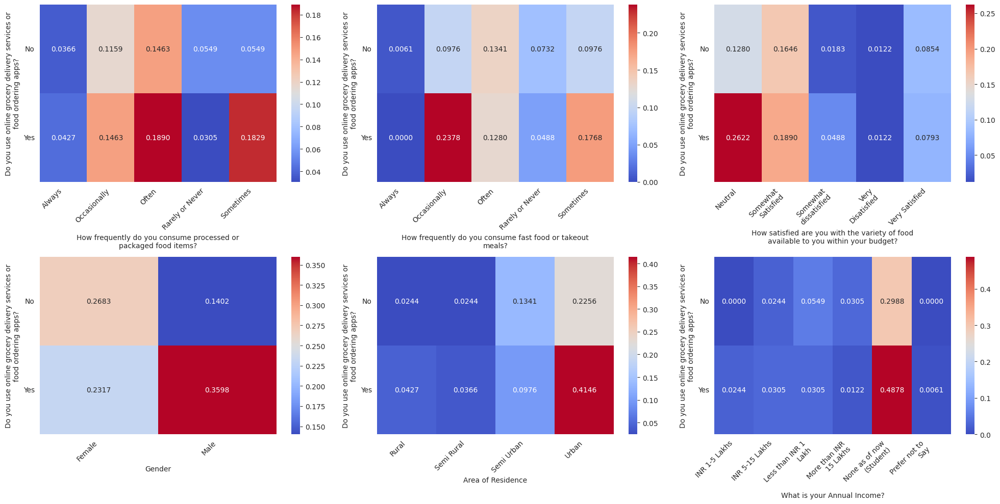

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Online Grocery/Food Ordering App Usage'
variables = [
    'How frequently do you consume processed or packaged food items?',
    'How frequently do you consume fast food or takeout meals?',
    'How satisfied are you with the variety of food available to you within your budget?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'Do you use online grocery delivery services or food ordering apps?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 3 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

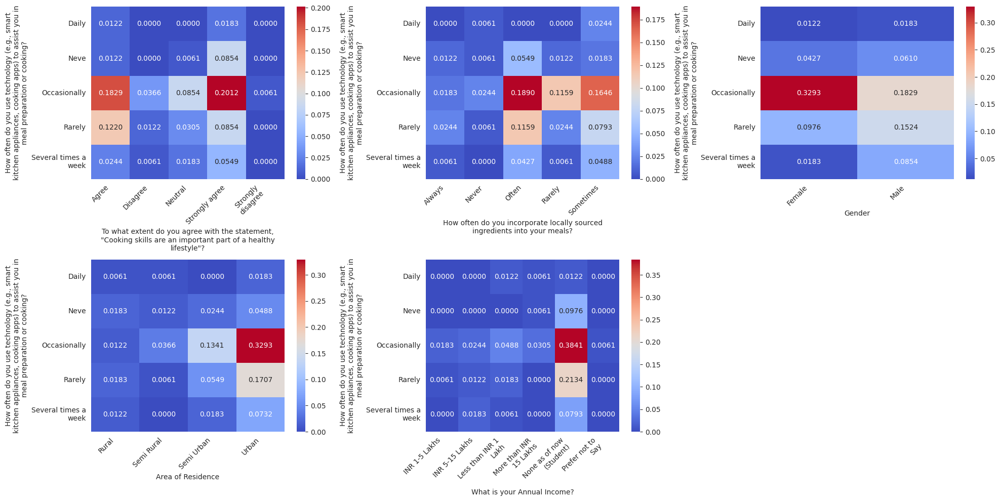

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Technology Use in Meal Prep'
variables = [
    'To what extent do you agree with the statement, "Cooking skills are an important part of a healthy lifestyle"?',
    'How often do you incorporate locally sourced ingredients into your meals?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot
# Adjust layout and display the figure
plt.tight_layout()
plt.show()

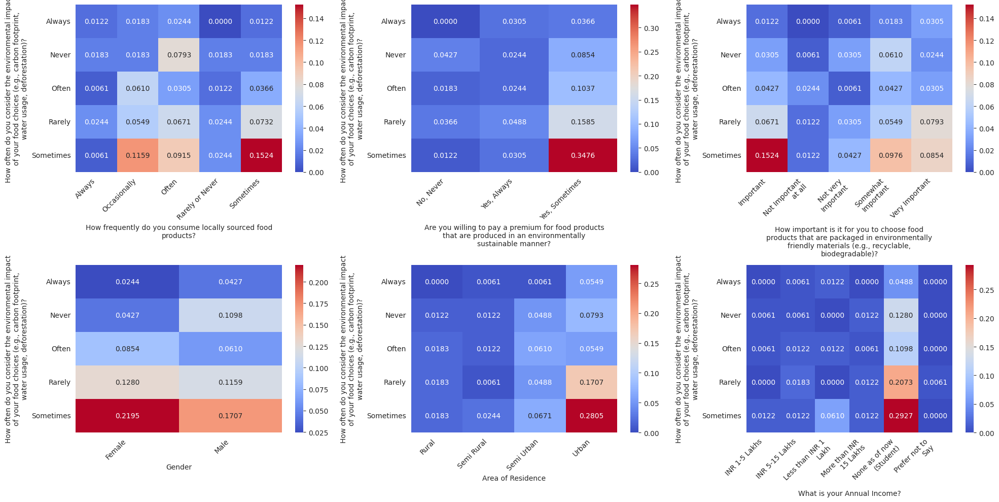

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Environmental Impact Consideration'
variables = [
    'How frequently do you consume locally sourced food products?',
    'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?',
    'How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 3 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

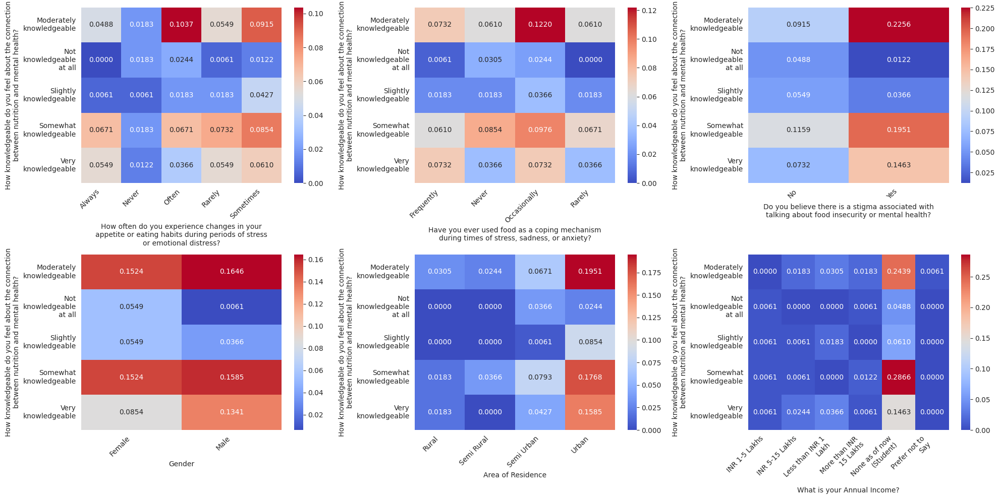

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Nutrition and Mental Health Knowledge'
variables = [
    'How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?',
    'Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? ',
    'Do you believe there is a stigma associated with talking about food insecurity or mental health?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
    ]

# Define the primary variable for comparison
primary_variable = 'How knowledgeable do you feel about the connection between nutrition and mental health?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 4 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

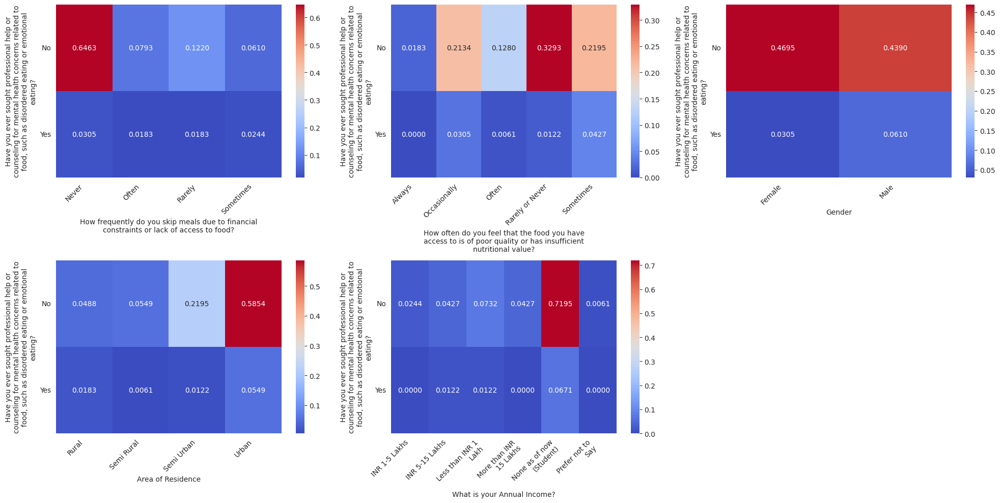

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Seeking Professional Help for Food-Related Mental Health'
variables = [
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'How often do you feel that the food you have access to is of poor quality or has insufficient nutritional value?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

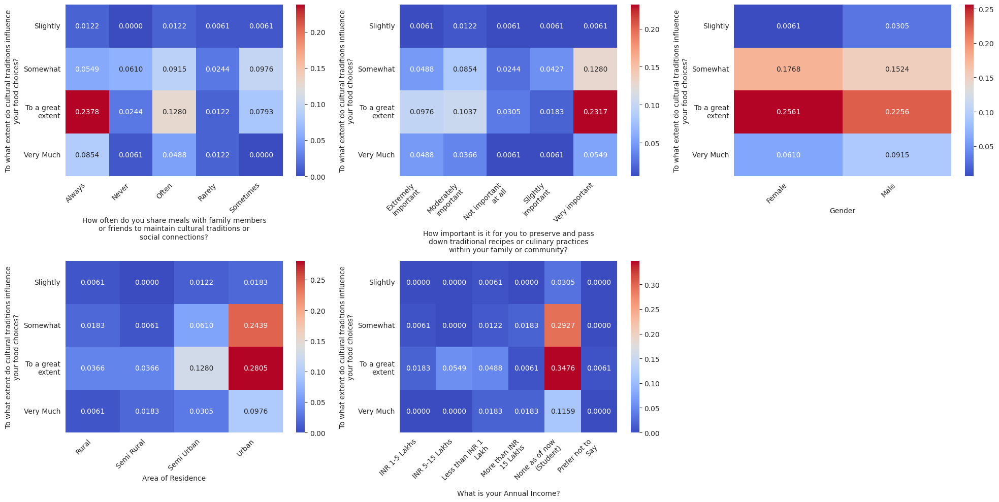

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Cultural Influence on Food Choices'
variables = [
    'How often do you share meals with family members or friends to maintain cultural traditions or social connections? ',
    'How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'To what extent do cultural traditions influence your food choices?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot
# Adjust layout and display the figure
plt.tight_layout()
plt.show()

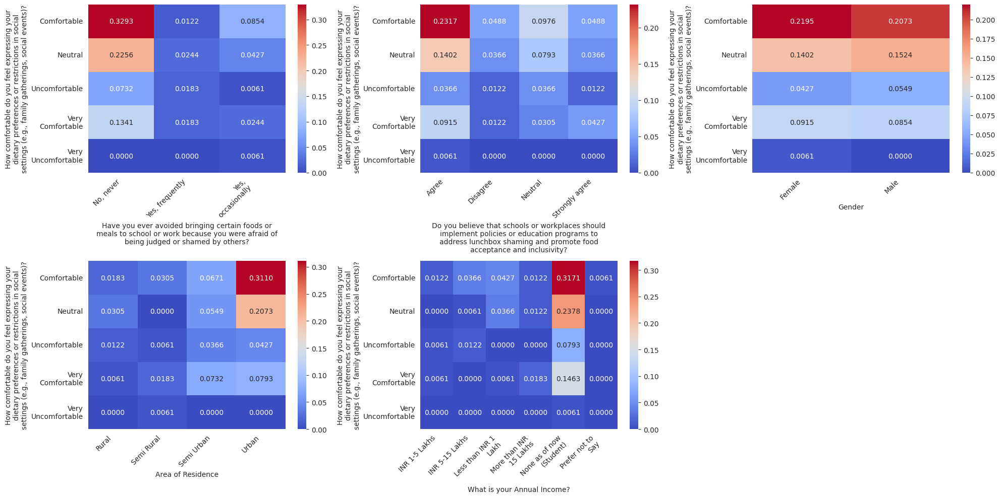

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Comfort Expressing Dietary Preferences'
variables = [
    'Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?',
    'Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)

    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)

# Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot

# Adjust layout and display the figure
plt.tight_layout()
plt.show()

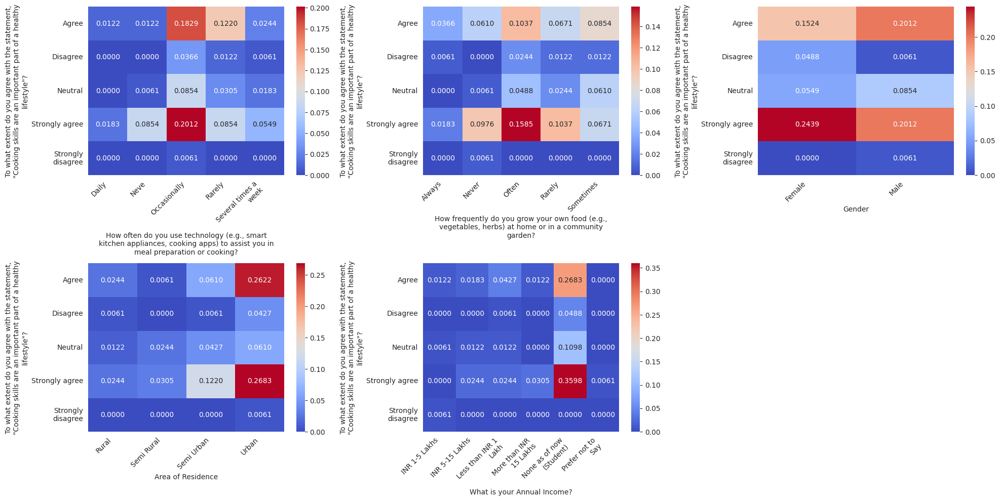

In [ ]:


# Assuming 'df' is your DataFrame

# List of variables to analyze against 'Importance of Cooking Skills'
variables = [
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',
    'Gender',
    'Area of Residence',
    'What is your Annual Income?'
]

# Define the primary variable for comparison
primary_variable = 'To what extent do you agree with the statement, "Cooking skills are an important part of a healthy lifestyle"?'

# Number of rows and columns for the grid, adjusted for the number of variables
num_rows = 2  # Adjusted for 2 variables
num_cols = 3

# Create the figure and axes for the grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))  # Adjusted figsize

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable
for i, variable in enumerate(variables):
    # Create contingency table
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)

    # Calculate Cramer's V (a measure of association)
    cramers_v = table.test_nominal_association().statistic

    # Create heatmap
    sns.heatmap(
        table.table_orig / table.table_orig.sum().sum(),
        annot=True,
        cmap='coolwarm',
        fmt=".4f",
        ax=axes[i]
    )

    # Set title with Cramer's V and wrap it
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap x-axis and y-axis labels
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)

    # Wrap x-axis label (name)
    x_label = axes[i].get_xlabel()
    wrapped_x_label = '\n'.join(wrap(x_label, 50))  # Adjust wrap width as needed
    axes[i].set_xlabel(wrapped_x_label)
    # Wrap y-axis label (name)
    y_label = axes[i].get_ylabel()
    wrapped_y_label = '\n'.join(wrap(y_label, 50))  # Adjust wrap width as needed
    axes[i].set_ylabel(wrapped_y_label)


# Remove the extra empty subplot if the number of variables is less than num_rows * num_cols
if len(variables) < num_rows * num_cols:
    fig.delaxes(axes[len(variables)])  # Delete the unused subplot
# Adjust layout and display the figure
plt.tight_layout()
plt.show()

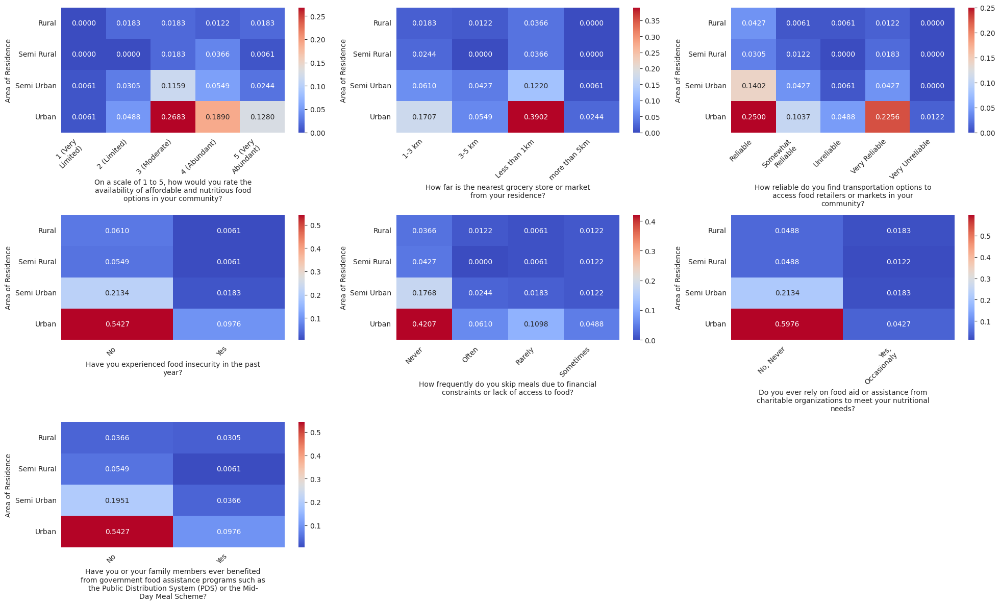

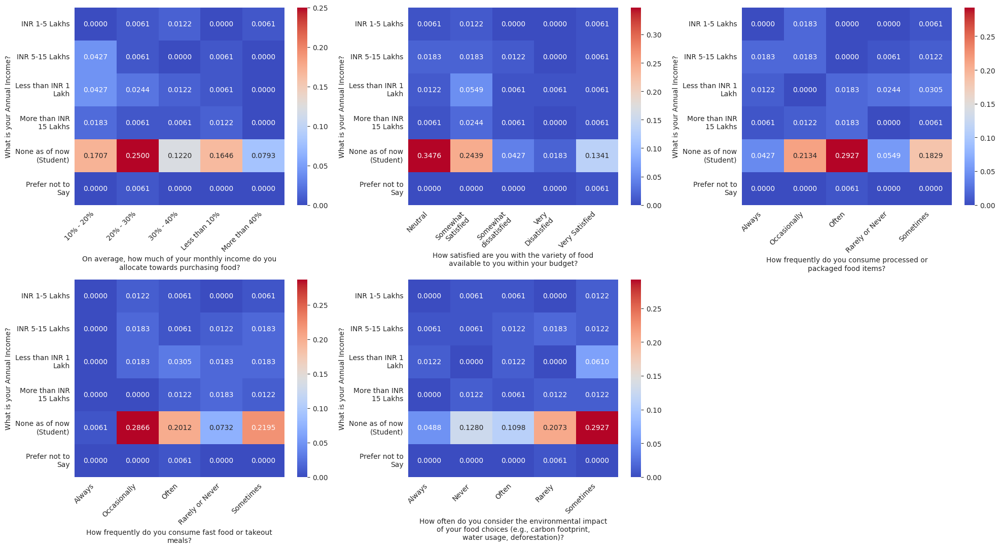

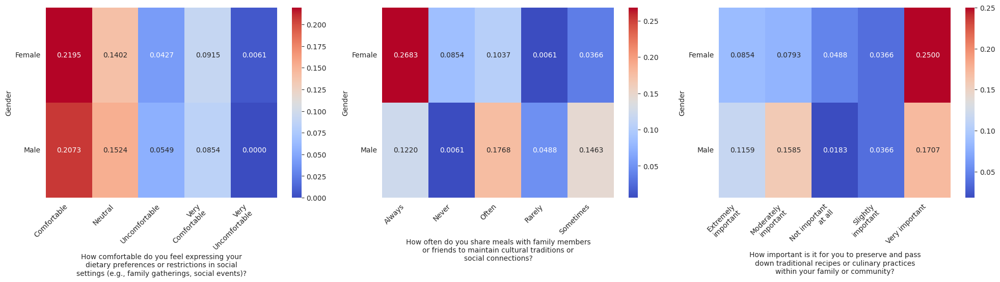

In [ ]:


# Assuming 'df' is your DataFrame

# --- Area of Residence vs. Food Access and Security ---
primary_variable = 'Area of Residence'
variables = [
    'On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?',
    'How far is the nearest grocery store or market from your residence?',
    'How reliable do you find transportation options to access food retailers or markets in your community?',
    'Have you experienced food insecurity in the past year?',
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs?',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?'
]

# Create a figure and axes for the heatmaps
num_rows = 4  # Adjust for the number of variables
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,15))  # Adjust figsize
axes = axes.flatten()

# Loop through variables and create heatmaps
for i, variable in enumerate(variables):
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)
    cramers_v = table.test_nominal_association().statistic  # Calculate Cramer's V

    sns.heatmap(table.table_orig / table.table_orig.sum().sum(), annot=True, cmap='coolwarm', fmt=".4f", ax=axes[i])
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap labels for better readability
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)
    axes[i].set_xlabel('\n'.join(wrap(axes[i].get_xlabel(), 50)))
    axes[i].set_ylabel('\n'.join(wrap(axes[i].get_ylabel(), 50)))

# Remove extra subplots if necessary
if len(variables) < num_rows * num_cols:
    for j in range(len(variables), num_rows * num_cols):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# --- Annual Income vs. Food Spending and Habits ---
primary_variable = 'What is your Annual Income?'
variables = [
    'On average, how much of your monthly income do you allocate towards purchasing food?',
    'How satisfied are you with the variety of food available to you within your budget?',
    'How frequently do you consume processed or packaged food items?',
    'How frequently do you consume fast food or takeout meals?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?'
]

# Create a figure and axes for the heatmaps
num_rows = 3  # Adjust for the number of variables
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))  # Adjust figsize
axes = axes.flatten()

# Loop through variables and create heatmaps (same logic as above)
# ... (Repeat the heatmap creation and labeling code from the previous section) ...
# Loop through variables and create heatmaps
for i, variable in enumerate(variables):
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)
    cramers_v = table.test_nominal_association().statistic  # Calculate Cramer's V

    sns.heatmap(table.table_orig / table.table_orig.sum().sum(), annot=True, cmap='coolwarm', fmt=".4f", ax=axes[i])
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap labels for better readability
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)
    axes[i].set_xlabel('\n'.join(wrap(axes[i].get_xlabel(), 50)))
    axes[i].set_ylabel('\n'.join(wrap(axes[i].get_ylabel(), 50)))

# Remove extra subplots if necessary
if len(variables) < num_rows * num_cols:
    for j in range(len(variables), num_rows * num_cols):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# --- Gender vs. Social and Cultural Aspects ---
primary_variable = 'Gender'
variables = [
    'How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?',
    'How often do you share meals with family members or friends to maintain cultural traditions or social connections? ',
    'How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?'
]

# Create a figure and axes for the heatmaps
num_rows = 3  # Adjust for the number of variables
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))  # Adjust figsize
axes = axes.flatten()

# Loop through variables and create heatmaps (same logic as above)
# ... (Repeat the heatmap creation and labeling code from the previous section) ...
# Loop through variables and create heatmaps
for i, variable in enumerate(variables):
    data = df[[primary_variable, variable]]
    table = sm.stats.Table.from_data(data)
    cramers_v = table.test_nominal_association().statistic  # Calculate Cramer's V

    sns.heatmap(table.table_orig / table.table_orig.sum().sum(), annot=True, cmap='coolwarm', fmt=".4f", ax=axes[i])
    # title = f'{variable} vs. {primary_variable}'
    # wrapped_title = '\n'.join(wrap(title, 60))
    # axes[i].set_title(wrapped_title, fontsize=10)

    # Wrap labels for better readability
    axes[i].set_xticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_xticklabels()], rotation=45, ha='right')
    axes[i].set_yticklabels(['\n'.join(wrap(label.get_text(), 15)) for label in axes[i].get_yticklabels()], rotation=0)
    axes[i].set_xlabel('\n'.join(wrap(axes[i].get_xlabel(), 50)))
    axes[i].set_ylabel('\n'.join(wrap(axes[i].get_ylabel(), 50)))

# Remove extra subplots if necessary
if len(variables) < num_rows * num_cols:
    for j in range(len(variables), num_rows * num_cols):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## Regression Analysis

In [ ]:
# prompt: perform the multinomial regression on Dependent Variable: Have you experienced food insecurity in the past year?
# Independent Variables:
# Area of Residence
# Annual Income
# How far is the nearest grocery store or market from your residence?
# How reliable do you find transportation options to access food retailers or markets in your community?


# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Have you experienced food insecurity in the past year?'
independent_variables = [
    'Gender',
    'Area of Residence',
    'What is your Annual Income?',
    'How far is the nearest grocery store or market from your residence?',
    'How reliable do you find transportation options to access food retailers or markets in your community?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables:
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le #store the encoder to use later for inverse_transform
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
      pass # handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Convert the dependent variable to numerical using Label Encoding
if df_analysis[dependent_variable].dtype == 'object':
    le_dependent = LabelEncoder()
    df_analysis[dependent_variable] = le_dependent.fit_transform(df_analysis[dependent_variable])
else:
    print(f"Warning: Dependent variable '{dependent_variable}' is not categorical.")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train) #multinomial logistic regression
results = model.fit()

# print(results.summary())


# Make predictions
predictions = results.predict(X_test)

# Evaluate the model
# You can use metrics like accuracy, precision, recall, F1-score, etc.,
# depending on the nature of your dependent variable.
# More evaluation metrics can be added here
# predictions

# Get the results summary
summary = results.summary()

# Extract the coefficients table as a DataFrame directly
results_df = pd.read_html(summary.as_html(), header=0, index_col=0)[1]

# Drop unnecessary columns
results_df = results_df[['coef', 'P>|z|']]

# Rename columns for clarity
results_df = results_df.rename(columns={'coef': 'coefficients', 'P>|z|': 'p-value'})
results_df.index.name = 'variables'
results_df = results_df.reset_index()

# Create a new DataFrame for the desired table
results_table = pd.DataFrame(columns=['variables', 'coefficients', 'p-value', 'statistical significance'])

# Populate the table with data from the results DataFrame, handling potential missing values
results_table['variables'] = results_df['variables']
results_table['coefficients'] = pd.to_numeric(results_df['coefficients'], errors='coerce').fillna('NaN')
results_table['p-value'] = pd.to_numeric(results_df['p-value'], errors='coerce').fillna('NaN')

# Determine statistical significance, handling NaNs
results_table['statistical significance'] = results_table['p-value'].apply(
    lambda p: 'Significant' if (isinstance(p, (int, float)) and p < 0.05) else ('Not Significant' if (isinstance(p, (int, float)) and p >=0.05) else 'NaN')
)

# Display or save the results table
# results_table.to_csv(f'{dependent_variable}.csv', index=False)
# results_table


Optimization terminated successfully.
         Current function value: 0.367577
         Iterations 6


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                            MNLogit Regression Results                                            
==================================================================================================================
Dep. Variable:     Have you experienced food insecurity in the past year?   No. Observations:                  131
Model:                                                            MNLogit   Df Residuals:                      125
Method:                                                               MLE   Df Model:                            5
Date:                                                    Tue, 11 Feb 2025   Pseudo R-squ.:                 0.04761
Time:                                                            04:12:48   Log-Likelihood:                -48.153
converged:                                                           True   LL-Null:                       -50.560
Covariance Type:                                                nonrobust   LLR p-value:                    0.4390
==========================================================================================================================================================================
                                              Have you experienced food insecurity in the past year?=1       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                     -1.5397      1.310     -1.175      0.240      -4.107       1.028
Gender                                                                                                     0.6350      0.544      1.168      0.243      -0.431       1.701
Area of Residence                                                                                          0.2753      0.350      0.787      0.431      -0.410       0.961
What is your Annual Income?                                                                               -0.2532      0.232     -1.091      0.275      -0.708       0.202
How far is the nearest grocery store or market from your residence?                                       -0.1652      0.290     -0.570      0.569      -0.733       0.403
How reliable do you find transportation options to access food retailers or markets in your community?    -0.2586      0.214     -1.210      0.226      -0.678       0.160
==========================================================================================================================================================================
"""

In [ ]:


# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How frequently do you consume processed or packaged food items?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'Do you use online grocery delivery services or food ordering apps?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables:
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Convert the dependent variable to numerical using Label Encoding
if df_analysis[dependent_variable].dtype == 'object':
    le_dependent = LabelEncoder()
    df_analysis[dependent_variable] = le_dependent.fit_transform(df_analysis[dependent_variable])
else:
    print(f"Warning: Dependent variable '{dependent_variable}' is not categorical.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
summary = results.summary()

# Extract the coefficients table as a DataFrame directly
results_df = pd.read_html(summary.as_html(), header=0, index_col=0)[1]

# Drop unnecessary columns
results_df = results_df[['coef', 'P>|z|']]

# Rename columns for clarity
results_df = results_df.rename(columns={'coef': 'coefficients', 'P>|z|': 'p-value'})
results_df.index.name = 'variables'
results_df = results_df.reset_index()

# Create a new DataFrame for the desired table
results_table = pd.DataFrame(columns=['variables', 'coefficients', 'p-value', 'statistical significance'])

# Populate the table with data from the results DataFrame, handling potential missing values
results_table['variables'] = results_df['variables']
results_table['coefficients'] = pd.to_numeric(results_df['coefficients'], errors='coerce').fillna('NaN')
results_table['p-value'] = pd.to_numeric(results_df['p-value'], errors='coerce').fillna('NaN')

# Determine statistical significance, handling NaNs
results_table['statistical significance'] = results_table['p-value'].apply(
    lambda p: 'Significant' if (isinstance(p, (int, float)) and p < 0.05) else ('Not Significant' if (isinstance(p, (int, float)) and p >=0.05) else 'NaN')
)

# Display or save the results table
# results_table.to_csv(f'{dependent_variable}.csv', index=False)
results_table

Optimization terminated successfully.
         Current function value: 1.315930
         Iterations 7


,variables,coefficients,p-value,statistical significance
0,const,0.5696,0.736,Not Significant
1,Area of Residence,0.1835,0.626,Not Significant
2,What is your Annual Income?,0.4039,0.166,Not Significant
3,Do you use online grocery delivery services or...,0.2128,0.78,Not Significant
4,How often do you consider the environmental im...,-0.4274,0.155,Not Significant
5,How frequently do you consume processed or pac...,NaN,NaN,NaN
6,const,-6.0562,0.03,Significant
7,Area of Residence,0.7232,0.073,Not Significant
8,What is your Annual Income?,1.6837,0.006,Significant
9,Do you use online grocery delivery services or...,0.0862,0.911,Not Significant


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                                 MNLogit Regression Results                                                
===========================================================================================================================
Dep. Variable:     How frequently do you consume processed or packaged food items?   No. Observations:                  131
Model:                                                                     MNLogit   Df Residuals:                      111
Method:                                                                        MLE   Df Model:                           16
Date:                                                             Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1148
Time:                                                                     04:17:00   Log-Likelihood:                -172.39
converged:                                                                    True   LL-Null:                       -194.74
Covariance Type:                                                         nonrobust   LLR p-value:                 0.0001536
=================================================================================================================================================================================================
                                                            How frequently do you consume processed or packaged food items?=1       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                             0.5696      1.689      0.337      0.736      -2.741       3.880
Area of Residence                                                                                                                 0.1835      0.376      0.488      0.626      -0.554       0.921
What is your Annual Income?                                                                                                       0.4039      0.292      1.384      0.166      -0.168       0.976
Do you use online grocery delivery services or food ordering apps?                                                                0.2128      0.760      0.280      0.780      -1.278       1.703
How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?    -0.4274      0.300     -1.423      0.155      -1.016       0.161
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                            How frequently do you consume processed or packaged food items?=2       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                            -6.0562      2.786     -2.174      0.030     -11.516      -0.596
Area of Residence                                                                                                                 0.7232      0.404      1.791      0.073      -0.068       1.515
What is your Annual Income?                                                                                                       1.6837      0.612      2.751      0.006       0.484       2.883
Do you use online grocery delivery services or food ordering apps?                                                      

In [ ]:
# prompt: adopt the code for: Dependent Variable: Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?
# Independent Variables:
# Annual Income
# How often do you consider the environmental impact of your food choices?
# How knowledgeable do you feel about the connection between nutrition and mental health?

import pandas as pd
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?'
independent_variables = [
    'What is your Annual Income?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'How knowledgeable do you feel about the connection between nutrition and mental health?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables:
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Convert the dependent variable to numerical using Label Encoding
if df_analysis[dependent_variable].dtype == 'object':
    le_dependent = LabelEncoder()
    df_analysis[dependent_variable] = le_dependent.fit_transform(df_analysis[dependent_variable])
else:
    print(f"Warning: Dependent variable '{dependent_variable}' is not categorical.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
summary = results.summary()

# Extract the coefficients table as a DataFrame directly
results_df = pd.read_html(summary.as_html(), header=0, index_col=0)[1]

# Drop unnecessary columns
results_df = results_df[['coef', 'P>|z|']]

# Rename columns for clarity
results_df = results_df.rename(columns={'coef': 'coefficients', 'P>|z|': 'p-value'})
results_df.index.name = 'variables'
results_df = results_df.reset_index()

# Create a new DataFrame for the desired table
results_table = pd.DataFrame(columns=['variables', 'coefficients', 'p-value', 'statistical significance'])

# Populate the table with data from the results DataFrame, handling potential missing values
results_table['variables'] = results_df['variables']
results_table['coefficients'] = pd.to_numeric(results_df['coefficients'], errors='coerce').fillna('NaN')
results_table['p-value'] = pd.to_numeric(results_df['p-value'], errors='coerce').fillna('NaN')

# Determine statistical significance, handling NaNs
results_table['statistical significance'] = results_table['p-value'].apply(
    lambda p: 'Significant' if (isinstance(p, (int, float)) and p < 0.05) else ('Not Significant' if (isinstance(p, (int, float)) and p >=0.05) else 'NaN')
)

# Display or save the results table
results_table


Optimization terminated successfully.
         Current function value: 0.727467
         Iterations 8


,variables,coefficients,p-value,statistical significance
0,const,3.1939,0.291,Not Significant
1,What is your Annual Income?,-0.5935,0.429,Not Significant
2,How often do you consider the environmental im...,0.0369,0.881,Not Significant
3,How knowledgeable do you feel about the connec...,-0.2462,0.274,Not Significant
4,Are you willing to pay a premium for food prod...,NaN,NaN,NaN
5,const,4.358,0.129,Not Significant
6,What is your Annual Income?,-0.9344,0.19,Not Significant
7,How often do you consider the environmental im...,0.553,0.012,Significant
8,How knowledgeable do you feel about the connec...,-0.1903,0.345,Not Significant


In [ ]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                        MNLogit Regression Results                                                                        
==========================================================================================================================================================================
Dep. Variable:     Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?   No. Observations:                  131
Model:                                                                                                                    MNLogit   Df Residuals:                      123
Method:                                                                                                                       MLE   Df Model:                            6
Date:                                                                                                            Tue, 11 Feb 2025   Pseudo R-squ.:                 0.08702
Time:                                                                                                                    04:21:22   Log-Likelihood:                -95.298
converged:                                                                                                                   True   LL-Null:                       -104.38
Covariance Type:                                                                                                        nonrobust   LLR p-value:                  0.005827
=================================================================================================================================================================================================
             Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?=1       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                             3.1939      3.024      1.056      0.291      -2.734       9.121
What is your Annual Income?                                                                                                      -0.5935      0.750     -0.791      0.429      -2.063       0.876
How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?     0.0369      0.247      0.149      0.881      -0.447       0.521
How knowledgeable do you feel about the connection between nutrition and mental health?                                          -0.2462      0.225     -1.094      0.274      -0.688       0.195
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
             Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?=2       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                             4.3580      2.874      1.516      0.129      -1.276       9.992
What is your Annual Income?                                                                                                      -0.9344      0.712     -1.312      0.190      -2.331       0.462
How often do you consider the environmental impact of your food choices (e.g., carbon

In [ ]:
# prompt: adopt the code for: Dependent Variable: How frequently do you skip meals due to financial constraints or lack of access to food?
# Independent Variables:
# Annual Income
# On average, how much of your monthly income do you allocate towards purchasing food?
# Have you experienced food insecurity in the past year?
# How reliable do you find transportation options to access food retailers or markets in your community?


# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How frequently do you skip meals due to financial constraints or lack of access to food?'
independent_variables = [
    'What is your Annual Income?',
    'On average, how much of your monthly income do you allocate towards purchasing food?',
    'Have you experienced food insecurity in the past year?',
    'How reliable do you find transportation options to access food retailers or markets in your community?'
]

# ... (rest of your code remains the same)

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables:
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le #store the encoder to use later for inverse_transform
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
      pass # handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Convert the dependent variable to numerical using Label Encoding
if df_analysis[dependent_variable].dtype == 'object':
    le_dependent = LabelEncoder()
    df_analysis[dependent_variable] = le_dependent.fit_transform(df_analysis[dependent_variable])
else:
    print(f"Warning: Dependent variable '{dependent_variable}' is not categorical.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
summary = results.summary()

# Extract the coefficients table as a DataFrame directly
results_df = pd.read_html(summary.as_html(), header=0, index_col=0)[1]

# Drop unnecessary columns
results_df = results_df[['coef', 'P>|z|']]

# Rename columns for clarity
results_df = results_df.rename(columns={'coef': 'coefficients', 'P>|z|': 'p-value'})
results_df.index.name = 'variables'
results_df = results_df.reset_index()

# Create a new DataFrame for the desired table
results_table = pd.DataFrame(columns=['variables', 'coefficients', 'p-value', 'statistical significance'])

# Populate the table with data from the results DataFrame, handling potential missing values
results_table['variables'] = results_df['variables']
results_table['coefficients'] = pd.to_numeric(results_df['coefficients'], errors='coerce').fillna('NaN')
results_table['p-value'] = pd.to_numeric(results_df['p-value'], errors='coerce').fillna('NaN')

# Determine statistical significance, handling NaNs
results_table['statistical significance'] = results_table['p-value'].apply(
    lambda p: 'Significant' if (isinstance(p, (int, float)) and p < 0.05) else ('Not Significant' if (isinstance(p, (int, float)) and p >=0.05) else 'NaN')
)

# Display or save the results table
results_table



Optimization terminated successfully.
         Current function value: 0.907813
         Iterations 7


,variables,coefficients,p-value,statistical significance
0,const,-5.2951,0.064,Not Significant
1,What is your Annual Income?,0.9106,0.215,Not Significant
2,"On average, how much of your monthly income do...",-0.2341,0.376,Not Significant
3,Have you experienced food insecurity in the pa...,0.42,0.716,Not Significant
4,How reliable do you find transportation option...,0.0632,0.794,Not Significant
5,How frequently do you skip meals due to financ...,NaN,NaN,NaN
6,const,-3.8068,0.006,Significant
7,What is your Annual Income?,0.4744,0.178,Not Significant
8,"On average, how much of your monthly income do...",0.0872,0.653,Not Significant
9,Have you experienced food insecurity in the pa...,1.6798,0.016,Significant


In [ ]:
# prompt: adopt the code for: Dependent Variable: Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs? (Binary: Yes/No)
# Independent Variables:
# Area of Residence (Urban, Semi-Urban, Rural)
# Annual Income
# Have you experienced food insecurity in the past year?
# How frequently do you skip meals due to financial constraints or lack of access to food?
# How reliable do you find transportation options to access food retailers or markets in your community? perform logistic regression

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
# Define dependent and independent variables
dependent_variable = 'Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'Have you experienced food insecurity in the past year?',
    'How frequently do you skip meals due to financial constraints or lack of access to food?',
    'How reliable do you find transportation options to access food retailers or markets in your community?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]: # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le #store the encoder to use later for inverse_transform
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
      pass # handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Fit the logistic regression model
# model = LogisticRegression(solver='liblinear') # Use liblinear solver for small datasets
# model.fit(X_train, y_train)

X_train_sm = sm.add_constant(X_train)
model_sm = sm.Logit(y_train, X_train_sm)
results_sm = model_sm.fit()

# # Make predictions
# y_pred = model.predict(X_test)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy}")
# print(classification_report(y_test, y_pred)) # Added classification report

# #You can access model coefficients and other information using:
# print(model.coef_)
# model.intercept_

results_sm.summary()


         Current function value: 0.256061
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                      Logit Regression Results                                                                      
====================================================================================================================================================================
Dep. Variable:     Do you ever rely on food aid or assistance from charitable organizations to meet your nutritional needs?   No. Observations:                  131
Model:                                                                                                                Logit   Df Residuals:                      125
Method:                                                                                                                 MLE   Df Model:                            5
Date:                                                                                                      Tue, 11 Feb 2025   Pseudo R-squ.:                  0.2082
Time:                                                                                                              04:35:57   Log-Likelihood:                -33.544
converged:                                                                                                            False   LL-Null:                       -42.366
Covariance Type:                                                                                                  nonrobust   LLR p-value:                  0.003428
==========================================================================================================================================================================
                                                                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                    -67.7289   2.13e+04     -0.003      0.997   -4.18e+04    4.17e+04
Area of Residence                                                                                         -0.3718      0.326     -1.139      0.255      -1.012       0.268
What is your Annual Income?                                                                               16.5845   5327.119      0.003      0.998   -1.04e+04    1.05e+04
Have you experienced food insecurity in the past year?                                                     0.2733      0.869      0.315      0.753      -1.430       1.976
How frequently do you skip meals due to financial constraints or lack of access to food?                   0.6085      0.278      2.187      0.029       0.063       1.154
How reliable do you find transportation options to access food retailers or markets in your community?    -0.3744      0.278     -1.346      0.178      -0.920       0.171
==========================================================================================================================================================================

Possibly complete quasi-separation: A fraction 0.18 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
import pandas as pd

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Do you use online grocery delivery services or food ordering apps?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'Educational Qualification',
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'How frequently do you consume fast food or takeout meals?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]: # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le #store the encoder to use later for inverse_transform
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
      pass # handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#  Logistic Regression using statsmodels
X_train_sm = sm.add_constant(X_train)
model_sm = sm.Logit(y_train, X_train_sm)
results_sm = model_sm.fit()
results_sm.summary()

Optimization terminated successfully.
         Current function value: 0.660633
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                   Logit Regression Results                                                   
==============================================================================================================================
Dep. Variable:     Do you use online grocery delivery services or food ordering apps?   No. Observations:                  131
Model:                                                                          Logit   Df Residuals:                      125
Method:                                                                           MLE   Df Model:                            5
Date:                                                                Tue, 11 Feb 2025   Pseudo R-squ.:                 0.02883
Time:                                                                        04:39:21   Log-Likelihood:                -86.543
converged:                                                                       True   LL-Null:                       -89.112
Covariance Type:                                                            nonrobust   LLR p-value:                    0.3993
================================================================================================================================================================================================
                                                                                                                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                           -0.3233      1.032     -0.313      0.754      -2.346       1.699
Area of Residence                                                                                                                0.0439      0.221      0.198      0.843      -0.390       0.478
What is your Annual Income?                                                                                                     -0.0367      0.187     -0.196      0.844      -0.402       0.329
Educational Qualification                                                                                                       -0.0772      0.149     -0.518      0.604      -0.369       0.215
How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?     0.4346      0.215      2.022      0.043       0.013       0.856
How frequently do you consume fast food or takeout meals?                                                                       -0.0999      0.149     -0.669      0.504      -0.393       0.193
================================================================================================================================================================================================
"""

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
from sklearn.preprocessing import LabelEncoder

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?'
independent_variables = [
    'Educational Qualification',
    'What is your Annual Income?',
    'How knowledgeable do you feel about the connection between nutrition and mental health?',
    'How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',
    'How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

Optimization terminated successfully.
         Current function value: 1.326689
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                                MNLogit Regression Results                                                                               
=========================================================================================================================================================================================
Dep. Variable:     How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?   No. Observations:                  131
Model:                                                                                                                                   MNLogit   Df Residuals:                      107
Method:                                                                                                                                      MLE   Df Model:                           20
Date:                                                                                                                           Tue, 11 Feb 2025   Pseudo R-squ.:                 0.08179
Time:                                                                                                                                   04:43:40   Log-Likelihood:                -173.80
converged:                                                                                                                                  True   LL-Null:                       -189.28
Covariance Type:                                                                                                                       nonrobust   LLR p-value:                   0.05569
==================================================================================================================================================================================================================
               How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                              2.4619      2.252      1.093      0.274      -1.951       6.875
Educational Qualification                                                                                                                          1.2073      0.528      2.287      0.022       0.173       2.242
What is your Annual Income?                                                                                                                       -0.0108      0.456     -0.024      0.981      -0.905       0.883
How knowledgeable do you feel about the connection between nutrition and mental health?                                                            0.0424      0.288      0.147      0.883      -0.522       0.607
How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?                                              -0.3835      0.372     -1.032      0.302      -1.112       0.345
How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?    -0.6546      0.386     -1.696      0.090      -1.411       0.102
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
               How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?=2       coef    std err    

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
from sklearn.preprocessing import LabelEncoder

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How frequently do you consume fast food or takeout meals?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'How satisfied are you with the variety of food available to you within your budget?',
    'How frequently do you skip meals due to financial constraints or lack of access to food?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

Optimization terminated successfully.
         Current function value: 1.223106
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                                              MNLogit Regression Results                                             
=====================================================================================================================
Dep. Variable:     How frequently do you consume fast food or takeout meals?   No. Observations:                  131
Model:                                                               MNLogit   Df Residuals:                      113
Method:                                                                  MLE   Df Model:                           15
Date:                                                       Tue, 11 Feb 2025   Pseudo R-squ.:                 0.07645
Time:                                                               04:46:15   Log-Likelihood:                -160.23
converged:                                                              True   LL-Null:                       -173.49
Covariance Type:                                                   nonrobust   LLR p-value:                   0.03284
================================================================================================================================================================================================
                                                                 How frequently do you consume fast food or takeout meals?=2       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                           -1.7353      1.391     -1.248      0.212      -4.461       0.991
Area of Residence                                                                                                                0.1895      0.279      0.678      0.498      -0.358       0.737
What is your Annual Income?                                                                                                      0.2465      0.297      0.831      0.406      -0.335       0.828
How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?    -0.0032      0.279     -0.011      0.991      -0.549       0.543
How satisfied are you with the variety of food available to you within your budget?                                             -0.1704      0.213     -0.802      0.423      -0.587       0.246
How frequently do you skip meals due to financial constraints or lack of access to food?                                         0.1620      0.229      0.707      0.479      -0.287       0.611
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                                 How frequently do you consume fast food or takeout meals?=3       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                           -0.8760      1.545     -0.567      0.571      -3.905       2.153
Area of Residence                                                                                                                0.2295      0.401      0.573      0.567      -0.556       1.015
What is your Annual Income?                                                                                                     -0.2735      0.274     -0.997      0.319      -0.811       0

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
import pandas as pd

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Do you believe that food justice and equity should be a priority for government policies?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?',
    'How supportive do you find your community in addressing food justice issues?',
    'How often do you participate in community events or activities related to food (e.g., food drives, community meals)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Ensure the dependent variable is binary (0 or 1)
# If it has more than 2 unique values after Label Encoding, adjust as needed
# For example, if it represents agreement levels, you might need to recode:
# - "Strongly Agree" and "Agree" to 1 (representing agreement)
# - "Neutral", "Disagree", "Strongly Disagree" to 0 (representing disagreement)

# Example recoding (adjust based on your specific categories):
# Check unique values before recoding:
print(f"Unique values of '{dependent_variable}' before recoding: {df_analysis[dependent_variable].unique()}")

# Recode the dependent variable to be binary (0 or 1)
# Assuming 'Yes' is encoded as 0 and 'No' is encoded as any other value:
df_analysis[dependent_variable] = df_analysis[dependent_variable].apply(lambda x: 1 if x == 0 else 0)

#Check unique values after recoding:
print(f"Unique values of '{dependent_variable}' after recoding: {df_analysis[dependent_variable].unique()}")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the logistic regression model using statsmodels
X_train_sm = sm.add_constant(X_train)
model_sm = sm.Logit(y_train, X_train_sm)
results_sm = model_sm.fit()

# Print the model summary
results_sm.summary()

Unique values of 'Do you believe that food justice and equity should be a priority for government policies?' before recoding: [2 1 0]
Unique values of 'Do you believe that food justice and equity should be a priority for government policies?' after recoding: [0 1]
         Current function value: 0.053215
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                               Logit Regression Results                                                              
=====================================================================================================================================================
Dep. Variable:     Do you believe that food justice and equity should be a priority for government policies?   No. Observations:                  131
Model:                                                                                                 Logit   Df Residuals:                      125
Method:                                                                                                  MLE   Df Model:                            5
Date:                                                                                       Tue, 11 Feb 2025   Pseudo R-squ.:                  0.3264
Time:                                                                                               04:48:10   Log-Likelihood:                -6.9711
converged:                                                                                             False   LL-Null:                       -10.349
Covariance Type:                                                                                   nonrobust   LLR p-value:                    0.2395
==========================================================================================================================================================================================
                                                                                                                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                   -101.1131   9777.112     -0.010      0.992   -1.93e+04    1.91e+04
Area of Residence                                                                                                         15.5678   2053.167      0.008      0.994   -4008.565    4039.701
What is your Annual Income?                                                                                               11.7584   1898.231      0.006      0.995   -3708.706    3732.223
Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?     2.8755      1.832      1.569      0.117      -0.716       6.467
How supportive do you find your community in addressing food justice issues?                                              -0.0867      0.518     -0.167      0.867      -1.102       0.929
How often do you participate in community events or activities related to food (e.g., food drives, community meals)?       1.2206      0.943      1.295      0.195      -0.627       3.068
==========================================================================================================================================================================================

Possibly complete quasi-separation: A fraction 0.49 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
import pandas as pd

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?'
independent_variables = [
    'Gender',
    'Age',
    'How knowledgeable do you feel about the connection between nutrition and mental health?',
    'How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?',
    'Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? '
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Ensure the dependent variable is binary (0 or 1)
# Assuming 'Yes' is encoded as 1 and 'No' is encoded as 0 after Label Encoding:
# Check unique values before recoding:
print(f"Unique values of '{dependent_variable}' before recoding: {df_analysis[dependent_variable].unique()}")

df_analysis[dependent_variable] = df_analysis[dependent_variable].apply(lambda x: 1 if x == 1 else 0)  # Modify this line if 'Yes'/'No' encoding is different

#Check unique values after recoding:
print(f"Unique values of '{dependent_variable}' after recoding: {df_analysis[dependent_variable].unique()}")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the logistic regression model using statsmodels
X_train_sm = sm.add_constant(X_train)
model_sm = sm.Logit(y_train, X_train_sm)
results_sm = model_sm.fit()

# Print the model summary
results_sm.summary()

# Optional - use scikit-learn for prediction and evaluation:
# # Fit the logistic regression model using scikit-learn
# model = LogisticRegression(solver='liblinear')  # Use liblinear solver for small datasets
# model.fit(X_train, y_train)

# # Make predictions
# y_pred = model.predict(X_test)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy}")
# print(classification_report(y_test, y_pred))

Unique values of 'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?' before recoding: [0 1]
Unique values of 'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?' after recoding: [0 1]
Optimization terminated successfully.
         Current function value: 0.266874
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                                          Logit Regression Results                                                                                         
===========================================================================================================================================================================================================
Dep. Variable:     Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?   No. Observations:                  131
Model:                                                                                                                                                       Logit   Df Residuals:                      125
Method:                                                                                                                                                        MLE   Df Model:                            5
Date:                                                                                                                                             Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1285
Time:                                                                                                                                                     04:50:00   Log-Likelihood:                -34.960
converged:                                                                                                                                                    True   LL-Null:                       -40.116
Covariance Type:                                                                                                                                         nonrobust   LLR p-value:                   0.06687
=========================================================================================================================================================================================
                                                                                                                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                    -4.1614      1.959     -2.125      0.034      -8.000      -0.323
Gender                                                                                                                    0.3850      0.656      0.587      0.557      -0.901       1.671
Age                                                                                                                       0.0820      0.092      0.891      0.373      -0.098       0.262
How knowledgeable do you feel about the connection between nutrition and mental health?                                  -0.3934      0.214     -1.836      0.066      -0.814       0.027
How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?    -0.3336      0.252     -1.326      0.185      -0.827       0.159
Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?                                0.8593      0.389      2.208      0.027       0.097       1.622
=========================================================================================================================================================================================
"""

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
import pandas as pd

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?'
independent_variables = [
    'What is your Annual Income?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?',
    'How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Ensure the dependent variable is binary (0 or 1)
# Assuming 'Yes' is encoded as 1 and 'No' is encoded as 0 after Label Encoding:
# Check unique values before recoding:
print(f"Unique values of '{dependent_variable}' before recoding: {df_analysis[dependent_variable].unique()}")

df_analysis[dependent_variable] = df_analysis[dependent_variable].apply(lambda x: 1 if x == 1 else 0)  # Modify this line if 'Yes'/'No' encoding is different

#Check unique values after recoding:
print(f"Unique values of '{dependent_variable}' after recoding: {df_analysis[dependent_variable].unique()}")


# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the logistic regression model using statsmodels
X_train_sm = sm.add_constant(X_train)
model_sm = sm.Logit(y_train, X_train_sm)
results_sm = model_sm.fit()

# Print the model summary
results_sm.summary()

# Optional - use scikit-learn for prediction and evaluation:
# # Fit the logistic regression model using scikit-learn
# model = LogisticRegression(solver='liblinear')  # Use liblinear solver for small datasets
# model.fit(X_train, y_train)

# # Make predictions
# y_pred = model.predict(X_test)

# # Evaluate the model
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy}")
# print(classification_report(y_test, y_pred))

Unique values of 'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?' before recoding: [2 1 0]
Unique values of 'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?' after recoding: [0 1]
Optimization terminated successfully.
         Current function value: 0.403086
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                         Logit Regression Results                                                                         
==========================================================================================================================================================================
Dep. Variable:     Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?   No. Observations:                  131
Model:                                                                                                                      Logit   Df Residuals:                      126
Method:                                                                                                                       MLE   Df Model:                            4
Date:                                                                                                            Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1324
Time:                                                                                                                    04:51:22   Log-Likelihood:                -52.804
converged:                                                                                                                   True   LL-Null:                       -60.864
Covariance Type:                                                                                                        nonrobust   LLR p-value:                  0.002862
==================================================================================================================================================================================================================
                                                                                                                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                             -3.3316      1.413     -2.358      0.018      -6.101      -0.562
What is your Annual Income?                                                                                                                        0.2542      0.297      0.857      0.392      -0.327       0.836
How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?                     -0.3595      0.182     -1.973      0.048      -0.716      -0.002
How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?                                               0.1713      0.206      0.830      0.407      -0.233       0.576
How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?     0.5288      0.195      2.706      0.007       0.146       0.912
==================================================================================================================================================================================================================
"""

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How frequently do you skip meals due to financial constraints or lack of access to food?'
independent_variables = [
    'What is your Annual Income?',
    'On average, how much of your monthly income do you allocate towards purchasing food?',
    'Have you experienced food insecurity in the past year?',
    'How reliable do you find transportation options to access food retailers or markets in your community?',
    'How satisfied are you with the variety of food available to you within your budget?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

Optimization terminated successfully.
         Current function value: 0.831908
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                             MNLogit Regression Results                                                             
====================================================================================================================================================
Dep. Variable:     How frequently do you skip meals due to financial constraints or lack of access to food?   No. Observations:                  131
Model:                                                                                              MNLogit   Df Residuals:                      113
Method:                                                                                                 MLE   Df Model:                           15
Date:                                                                                      Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1420
Time:                                                                                              04:53:54   Log-Likelihood:                -108.98
converged:                                                                                             True   LL-Null:                       -127.02
Covariance Type:                                                                                  nonrobust   LLR p-value:                  0.001719
==========================================================================================================================================================================
            How frequently do you skip meals due to financial constraints or lack of access to food?=1       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                     -4.2818      2.884     -1.485      0.138      -9.935       1.371
What is your Annual Income?                                                                                0.8719      0.733      1.189      0.234      -0.565       2.309
On average, how much of your monthly income do you allocate towards purchasing food?                      -0.2059      0.285     -0.722      0.471      -0.765       0.353
Have you experienced food insecurity in the past year?                                                     0.3897      1.205      0.323      0.746      -1.972       2.751
How reliable do you find transportation options to access food retailers or markets in your community?     0.0619      0.265      0.234      0.815      -0.458       0.582
How satisfied are you with the variety of food available to you within your budget?                       -1.2503      0.601     -2.079      0.038      -2.429      -0.072
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
            How frequently do you skip meals due to financial constraints or lack of access to food?=2       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                     -3.4282      1.427     -2.403      0.016      -6.225      -0.632
What is your Annual Income?                                                                                0.5460      0.364      1.499      0.134      -0.168       1.260
On average, how much of your monthly income do you allocate towards purchasing food?                       0.1206      0.208      0.581      0.561      -0.286       0.527
Have you experienced food insecurity in the pa

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'Educational Qualification',
    'Do you use online grocery delivery services or food ordering apps?',
    'How knowledgeable do you feel about the connection between nutrition and mental health?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

Optimization terminated successfully.
         Current function value: 1.089857
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                               MNLogit Regression Results                                                                               
========================================================================================================================================================================================
Dep. Variable:     How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?   No. Observations:                  131
Model:                                                                                                                                  MNLogit   Df Residuals:                      107
Method:                                                                                                                                     MLE   Df Model:                           20
Date:                                                                                                                          Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1065
Time:                                                                                                                                  04:55:16   Log-Likelihood:                -142.77
converged:                                                                                                                                 True   LL-Null:                       -159.79
Covariance Type:                                                                                                                      nonrobust   LLR p-value:                   0.02582
==================================================================================================================================================================================================
How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?=1       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                             -3.9364      3.757     -1.048      0.295     -11.300       3.428
Area of Residence                                                                                                                 -0.2588      0.567     -0.456      0.648      -1.370       0.852
What is your Annual Income?                                                                                                        0.9399      0.803      1.170      0.242      -0.635       2.514
Educational Qualification                                                                                                          0.2286      0.529      0.432      0.666      -0.808       1.265
Do you use online grocery delivery services or food ordering apps?                                                                -0.9599      1.232     -0.779      0.436      -3.374       1.454
How knowledgeable do you feel about the connection between nutrition and mental health?                                            0.5892      0.497      1.185      0.236      -0.385       1.564
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?=2       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'To what extent do cultural traditions influence your food choices?'
independent_variables = [
    'Area of Residence',
    'How often do you share meals with family members or friends to maintain cultural traditions or social connections? ',
    'How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?',
    'How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

Optimization terminated successfully.
         Current function value: 1.063833
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                  MNLogit Regression Results                                                  
==============================================================================================================================
Dep. Variable:     To what extent do cultural traditions influence your food choices?   No. Observations:                  131
Model:                                                                        MNLogit   Df Residuals:                      116
Method:                                                                           MLE   Df Model:                           12
Date:                                                                Tue, 11 Feb 2025   Pseudo R-squ.:                 0.08475
Time:                                                                        04:58:12   Log-Likelihood:                -139.36
converged:                                                                       True   LL-Null:                       -152.27
Covariance Type:                                                            nonrobust   LLR p-value:                   0.01142
================================================================================================================================================================================================================
                                                                        To what extent do cultural traditions influence your food choices?=1       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                            0.0273      1.499      0.018      0.985      -2.911       2.966
Area of Residence                                                                                                                                0.5586      0.459      1.218      0.223      -0.340       1.458
How often do you share meals with family members or friends to maintain cultural traditions or social connections?                               0.2502      0.319      0.784      0.433      -0.376       0.876
How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?                 0.2278      0.306      0.744      0.457      -0.373       0.828
How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?    -0.0176      0.461     -0.038      0.970      -0.922       0.886
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                                        To what extent do cultural traditions influence your food choices?=2       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                            1.1285      1.443      0.782      0.434      -1.699       3.956
Area of Residence                                                                                                                                0.4579      0.449      1.021      0.307      -0.421       1.337
How often do you share meals with family members or friends to maintain cultural traditions 

In [ ]:

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How often do you participate in community events or activities related to food (e.g., food drives, community meals)?'
independent_variables = [
    'Area of Residence',
    'What is your Annual Income?',
    'How supportive do you find your community in addressing food justice issues?',
    'Do you believe that food justice and equity should be a priority for government policies?',
    'How well do you think your community celebrates and promotes diverse food cultures?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

         Current function value: 1.325985
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                                           MNLogit Regression Results                                                                           
================================================================================================================================================================================
Dep. Variable:     How often do you participate in community events or activities related to food (e.g., food drives, community meals)?   No. Observations:                  131
Model:                                                                                                                          MNLogit   Df Residuals:                      107
Method:                                                                                                                             MLE   Df Model:                           20
Date:                                                                                                                  Tue, 11 Feb 2025   Pseudo R-squ.:                 0.06066
Time:                                                                                                                          05:00:21   Log-Likelihood:                -173.70
converged:                                                                                                                        False   LL-Null:                       -184.92
Covariance Type:                                                                                                              nonrobust   LLR p-value:                    0.3175
==========================================================================================================================================================================================
How often do you participate in community events or activities related to food (e.g., food drives, community meals)?=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                     40.2243   3.18e+04      0.001      0.999   -6.22e+04    6.23e+04
Area of Residence                                                                                                          0.3025      0.579      0.522      0.602      -0.833       1.438
What is your Annual Income?                                                                                                0.2648      0.449      0.590      0.555      -0.615       1.144
How supportive do you find your community in addressing food justice issues?                                              -0.4199      0.283     -1.485      0.137      -0.974       0.134
Do you believe that food justice and equity should be a priority for government policies?                                -19.5323   1.59e+04     -0.001      0.999   -3.11e+04    3.11e+04
How well do you think your community celebrates and promotes diverse food cultures?                                       -0.2693      0.310     -0.869      0.385      -0.876       0.338
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
How often do you participate in community events or activities related to food (e.g., food drives, community meals)?=2       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                              

In [ ]:


# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'How aware are you of government policies related to food security and nutrition?'
independent_variables = [
    'Educational Qualification',
    'What is your Annual Income?',
    'Area of Residence',
    'Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?',
    'How often do you participate in community events or activities related to food (e.g., food drives, community meals)?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

         Current function value: 1.260573
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                         MNLogit Regression Results                                                         
============================================================================================================================================
Dep. Variable:     How aware are you of government policies related to food security and nutrition?   No. Observations:                  131
Model:                                                                                      MNLogit   Df Residuals:                      107
Method:                                                                                         MLE   Df Model:                           20
Date:                                                                              Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1290
Time:                                                                                      05:01:47   Log-Likelihood:                -165.14
converged:                                                                                    False   LL-Null:                       -189.59
Covariance Type:                                                                          nonrobust   LLR p-value:                 0.0003169
====================================================================================================================================================================================================================================
                                                                              How aware are you of government policies related to food security and nutrition?=1       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                                               -1.9761      3.456     -0.572      0.568      -8.751       4.798
Educational Qualification                                                                                                                                            0.4579      0.313      1.465      0.143      -0.155       1.071
What is your Annual Income?                                                                                                                                          0.6536      0.786      0.832      0.405      -0.886       2.194
Area of Residence                                                                                                                                                   -0.4871      0.429     -1.135      0.256      -1.328       0.354
Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?   -23.9118   6.75e+04     -0.000      1.000   -1.32e+05    1.32e+05
How often do you participate in community events or activities related to food (e.g., food drives, community meals)?                                                -0.1373      0.329     -0.417      0.676      -0.782       0.507
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                                              How aware are you of government policies related to food security and nutrition?=2       coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [ ]:
import pandas as pd
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

# Assuming your data is in a pandas DataFrame called 'df'
# Replace 'your_file.csv' with the actual file path if reading from a file
# df = pd.read_csv('your_file.csv')

# Define dependent and independent variables
dependent_variable = 'Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? '
independent_variables = [
    'Gender',
    'Age',
    'How knowledgeable do you feel about the connection between nutrition and mental health?',
    'How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?',
    'Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?'
]

# Create a copy of the DataFrame to avoid modifying the original
df_analysis = df.copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for col in independent_variables + [dependent_variable]:  # Encode dependent variable as well
    if df_analysis[col].dtype == 'object':  # Check if the column is categorical
        le = LabelEncoder()
        df_analysis[col] = le.fit_transform(df_analysis[col])
        label_encoders[col] = le  # Store the encoder for later use
    elif pd.api.types.is_numeric_dtype(df_analysis[col]):
        pass  # Handle numerical data type accordingly, skip for now
    else:
        print(f"Warning: Column '{col}' has an unsupported data type for Label Encoding.")

# Prepare the data for the model
X = df_analysis[independent_variables]
y = df_analysis[dependent_variable]


# Add a constant to the independent variables (intercept)
X = sm.add_constant(X)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the multinomial logistic regression model (if more than 2 categories in dependent var)
# Or use logistic regression for binary classification
model = sm.MNLogit(y_train, X_train)  # Multinomial logistic regression
results = model.fit()

# Make predictions
predictions = results.predict(X_test)

# Get the results summary
results.summary()

         Current function value: 1.184711
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                                               MNLogit Regression Results                                                              
=======================================================================================================================================================
Dep. Variable:     Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?    No. Observations:                  131
Model:                                                                                                 MNLogit   Df Residuals:                      113
Method:                                                                                                    MLE   Df Model:                           15
Date:                                                                                         Tue, 11 Feb 2025   Pseudo R-squ.:                  0.1189
Time:                                                                                                 05:04:32   Log-Likelihood:                -155.20
converged:                                                                                               False   LL-Null:                       -176.14
Covariance Type:                                                                                     nonrobust   LLR p-value:                 0.0002334
===================================================================================================================================================================================================================
                                                  Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? =1       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                               1.1565      2.763      0.419      0.676      -4.259       6.572
Gender                                                                                                                                              1.2302      0.579      2.124      0.034       0.095       2.365
Age                                                                                                                                                -0.1183      0.142     -0.835      0.404      -0.396       0.159
How knowledgeable do you feel about the connection between nutrition and mental health?                                                            -0.1116      0.187     -0.595      0.552      -0.479       0.256
How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?                               0.5246      0.197      2.658      0.008       0.138       0.911
Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?   -24.4557   2.15e+05     -0.000      1.000   -4.21e+05    4.21e+05
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                                                  Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? =2       coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                   

## Cluster Analysis

In [ ]:
df.head()

,Gender,Age,Area of Residence,Educational Qualification,What is your Annual Income?,"On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",How far is the nearest grocery store or market from your residence?,Have you ever experienced shortages or stockouts of essential food items in local shops or markets?,"On average, how much time do you spend traveling to purchase groceries or food items?","On average, how much of your monthly income do you allocate towards purchasing food?",...,How often do you use food tracking or calorie counting apps to monitor your dietary intake?,Do you believe that technology has positively or negatively impacted people's overall relationship with food?,"How often do you engage with food-related content on streaming platforms (e.g., cooking shows, food documentaries)?","How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?",Do you think mental health support services should include resources or programs specifically addressing the relationship between food and mental well-being?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?"
0,Female,21,Urban,Bachelor's Degree,INR 1-5 Lakhs,3 (Moderate),Less than 1km,No,Less than 15 minutes,More than 40%,...,Rarely,Negatively,Occasionally,Rarely,Not knowledgeable at all,Yes,Often,No,Agree,Occasionally
1,Male,21,Semi Urban,High School,None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,Less than 10%,...,Rarely,Negatively,Occasionally,Occasionally,Somewhat knowledgeable,No,Sometimes,No,Neutral,Never
2,Male,19,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),4 (Abundant),Less than 1km,No,Less than 15 minutes,10% - 20%,...,Never,Negatively,Several times a week,Rarely,Somewhat knowledgeable,Yes,Always,No,Strongly agree,Frequently
3,Male,20,Urban,Bachelor's Degree,None as of now (Student),2 (Limited),1-3 km,Yes,15-30 minutes,20% - 30%,...,Occasionally,Negatively,Occasionally,Rarely,Slightly knowledgeable,No,Rarely,No,Neutral,Occasionally
4,Male,21,Urban,"High school graduate, diploma or the equivalent",None as of now (Student),3 (Moderate),more than 5km,No,Less than 15 minutes,10% - 20%,...,Several times a week,Positively,Occasionally,Several times a week,Somewhat knowledgeable,Yes,Always,No,Agree,Never


<Figure size 1200x600 with 0 Axes>

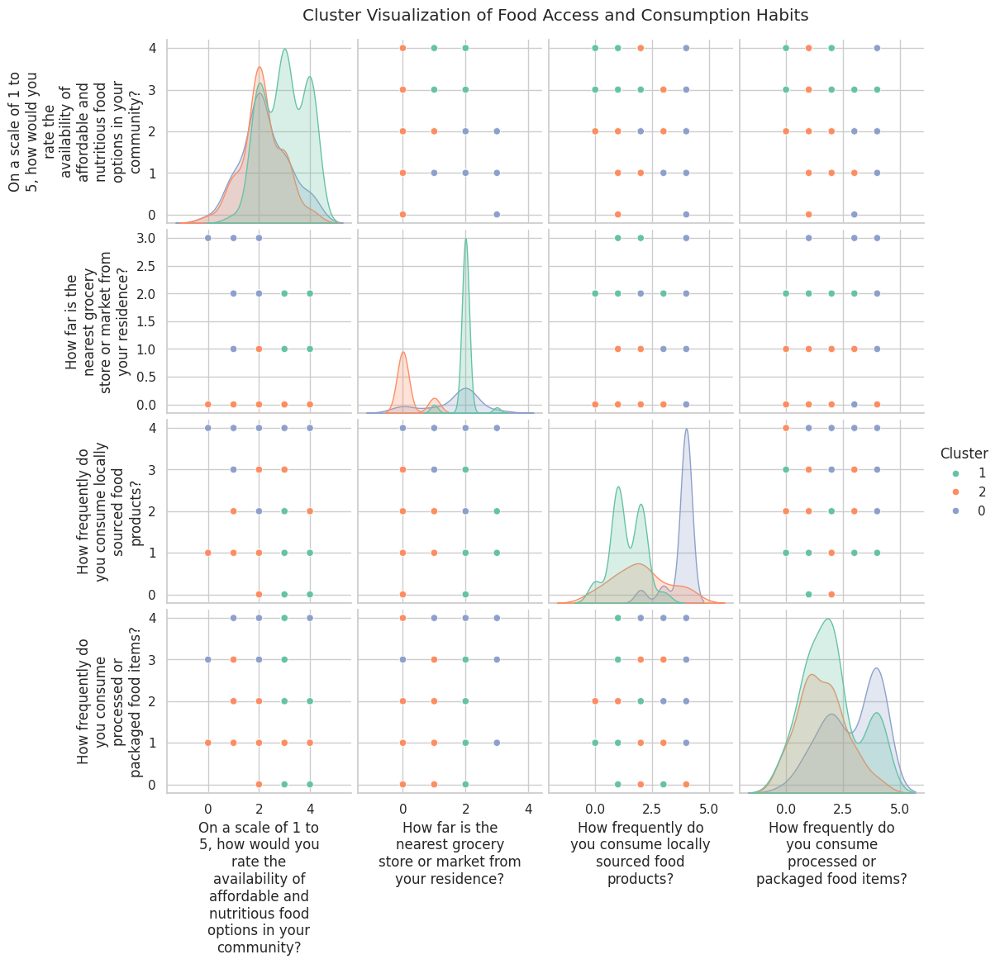

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px

# Selecting relevant columns
columns_of_interest = [
    "On a scale of 1 to 5, how would you rate the availability of affordable and nutritious food options in your community?",
    "How far is the nearest grocery store or market from your residence?",
    "How frequently do you consume locally sourced food products?",
    "How frequently do you consume processed or packaged food items?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method
# import matplotlib.pyplot as plt

# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Food Access and Consumption Habits", y=1.02)
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,  # Apply wrapped labels
    color_continuous_scale=px.colors.diverging.Portland)

# # Update figure size (width, height) in pixels
# fig.update_layout(
#     autosize=False,  # Disable automatic resizing
#     width=1000,     # Set width to 1000 pixels
#     height=600      # Set height to 600 pixels
# )

fig.show()

<Figure size 1200x600 with 0 Axes>

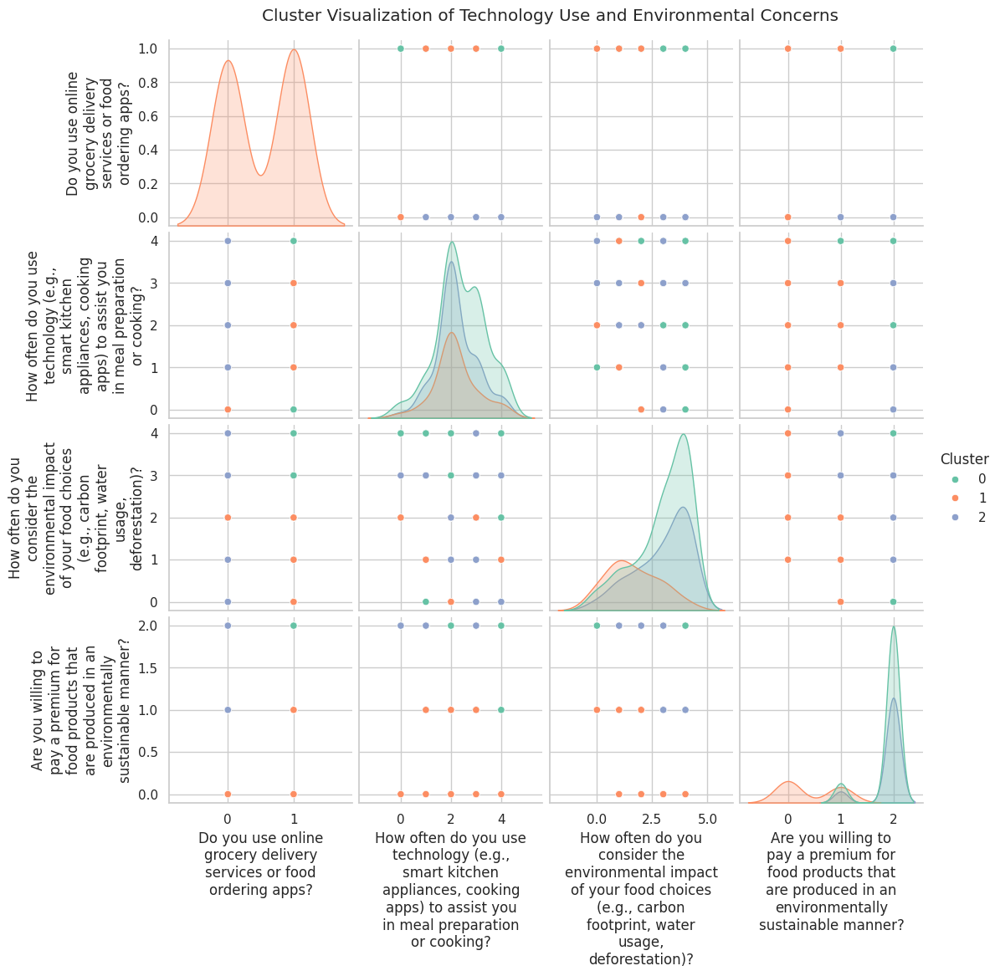

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px

# Selecting relevant columns
columns_of_interest = [
    'Do you use online grocery delivery services or food ordering apps?',
    'How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?',
    'How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?',
    'Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?'
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# # ... (You can uncomment this section to plot the elbow method) ...

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Technology Use and Environmental Concerns", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,Do you use online grocery delivery services or food ordering apps?,"How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?","How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?",Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?
Cluster,,,,
0,1.000000,2.382716,3.012346,1.901235
1,0.516129,2.193548,1.645161,0.419355
2,0.000000,2.211538,2.961538,1.903846


<Figure size 1200x600 with 0 Axes>

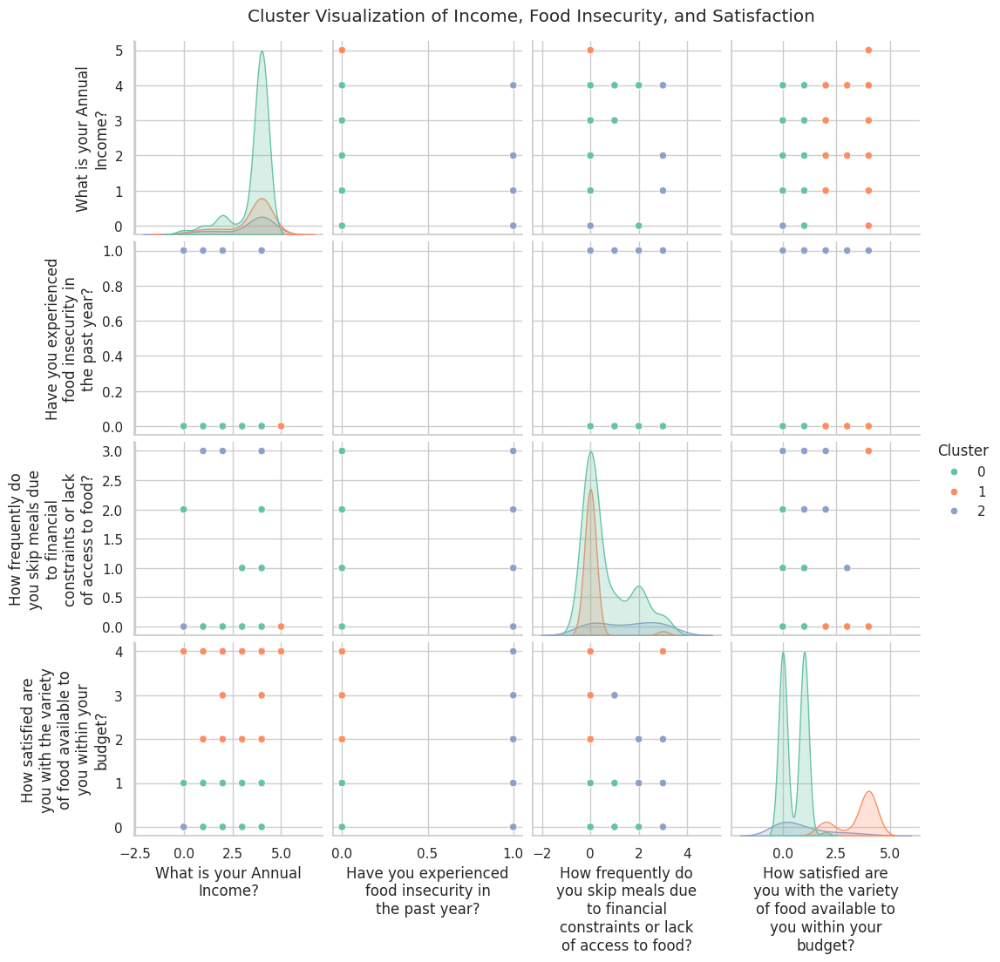

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "What is your Annual Income?",
    "Have you experienced food insecurity in the past year?",
    "How frequently do you skip meals due to financial constraints or lack of access to food?",
    "How satisfied are you with the variety of food available to you within your budget?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Income, Food Insecurity, and Satisfaction", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,What is your Annual Income?,Have you experienced food insecurity in the past year?,How frequently do you skip meals due to financial constraints or lack of access to food?,How satisfied are you with the variety of food available to you within your budget?
Cluster,,,,
0,3.598131,0.0,0.654206,0.514019
1,3.444444,0.0,0.083333,3.500000
2,3.333333,1.0,1.476190,0.904762


<Figure size 1200x600 with 0 Axes>

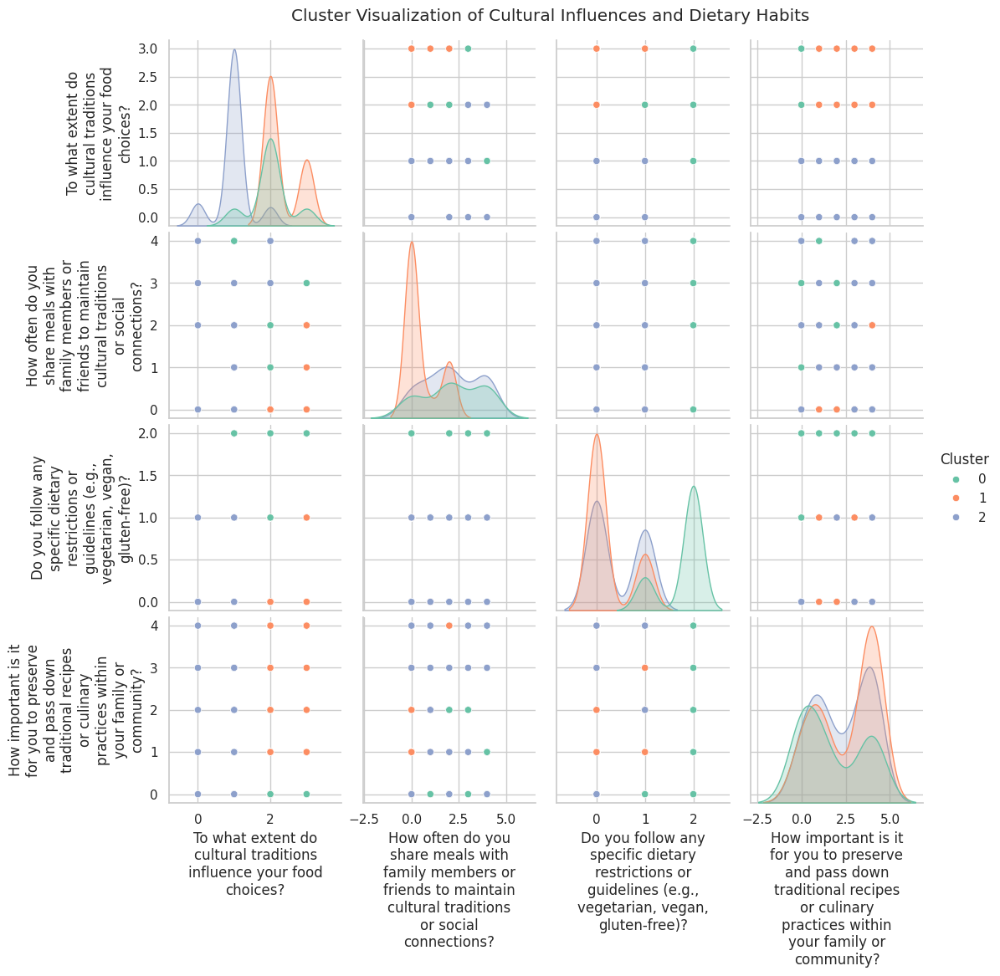

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "To what extent do cultural traditions influence your food choices?",
    "How often do you share meals with family members or friends to maintain cultural traditions or social connections? ",
    "Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",
    "How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Cultural Influences and Dietary Habits", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,To what extent do cultural traditions influence your food choices?,How often do you share meals with family members or friends to maintain cultural traditions or social connections?,"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?
Cluster,,,,
0,2.000000,2.232558,1.790698,1.744186
1,2.306452,0.516129,0.241935,2.596774
2,0.983051,2.135593,0.423729,2.322034


<Figure size 1200x600 with 0 Axes>

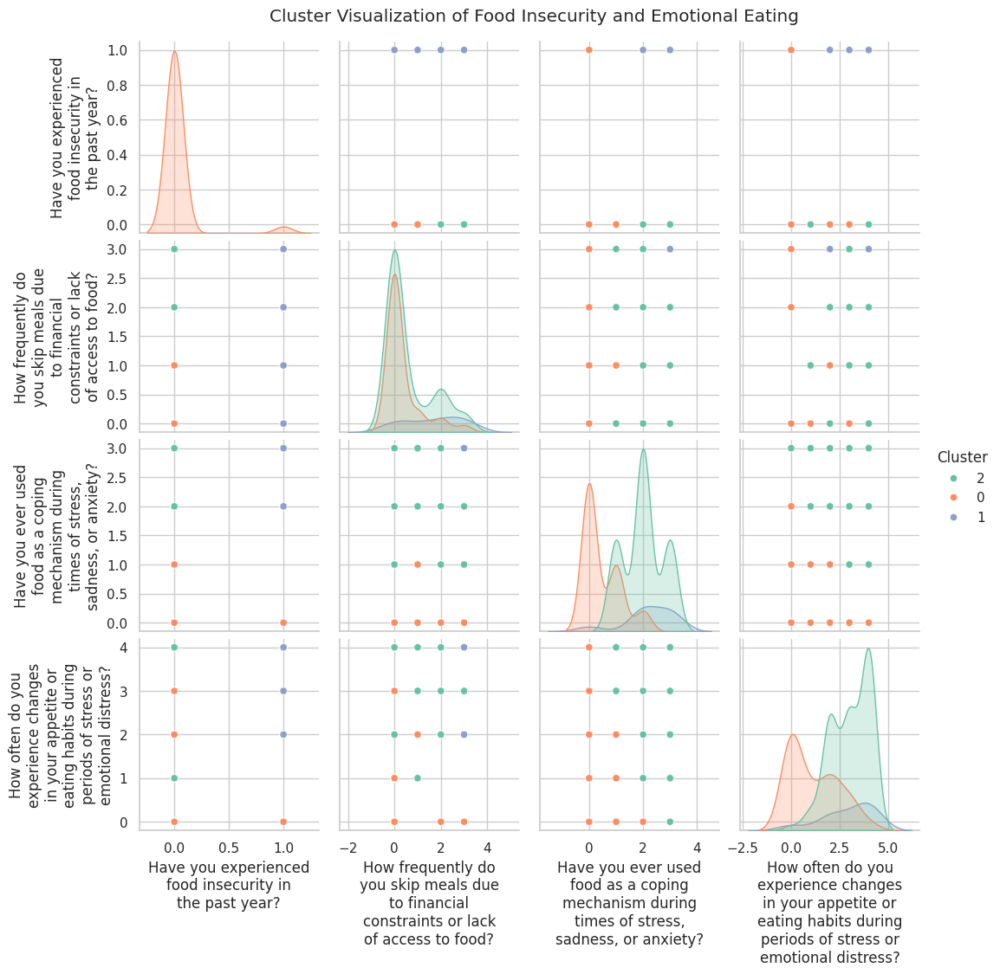

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "Have you experienced food insecurity in the past year?",
    "How frequently do you skip meals due to financial constraints or lack of access to food?",
    "Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety? ",
    "How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Food Insecurity and Emotional Eating", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,Have you experienced food insecurity in the past year?,How frequently do you skip meals due to financial constraints or lack of access to food?,"Have you ever used food as a coping mechanism during times of stress, sadness, or anxiety?",How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?
Cluster,,,,
0,0.035088,0.350877,0.456140,1.157895
1,1.000000,1.631579,2.210526,2.894737
2,0.000000,0.602273,2.000000,3.034091


<Figure size 1200x600 with 0 Axes>

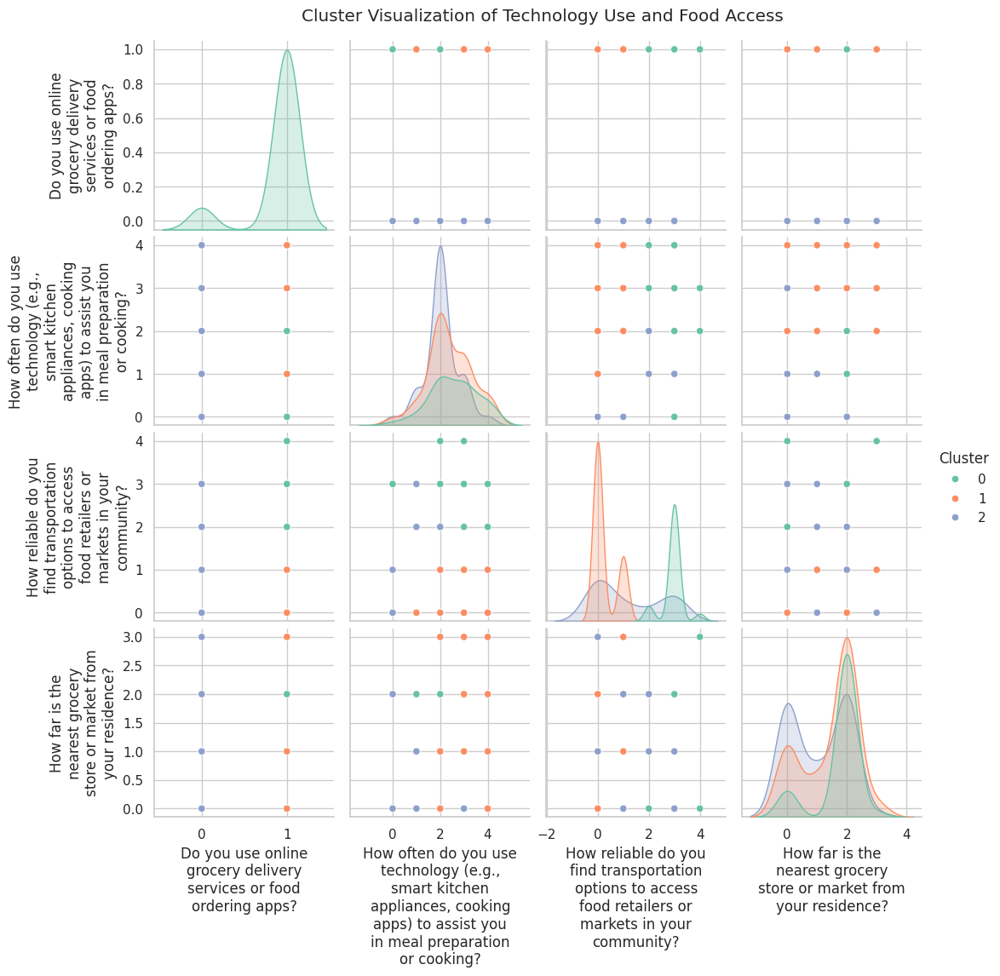

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "Do you use online grocery delivery services or food ordering apps?",
    "How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",
    "How reliable do you find transportation options to access food retailers or markets in your community?",
    "How far is the nearest grocery store or market from your residence?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Technology Use and Food Access", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,Do you use online grocery delivery services or food ordering apps?,"How often do you use technology (e.g., smart kitchen appliances, cooking apps) to assist you in meal preparation or cooking?",How reliable do you find transportation options to access food retailers or markets in your community?,How far is the nearest grocery store or market from your residence?
Cluster,,,,
0,0.891892,2.567568,2.945946,1.756757
1,1.000000,2.375000,0.265625,1.453125
2,0.000000,2.047619,1.206349,1.063492


<Figure size 1200x600 with 0 Axes>

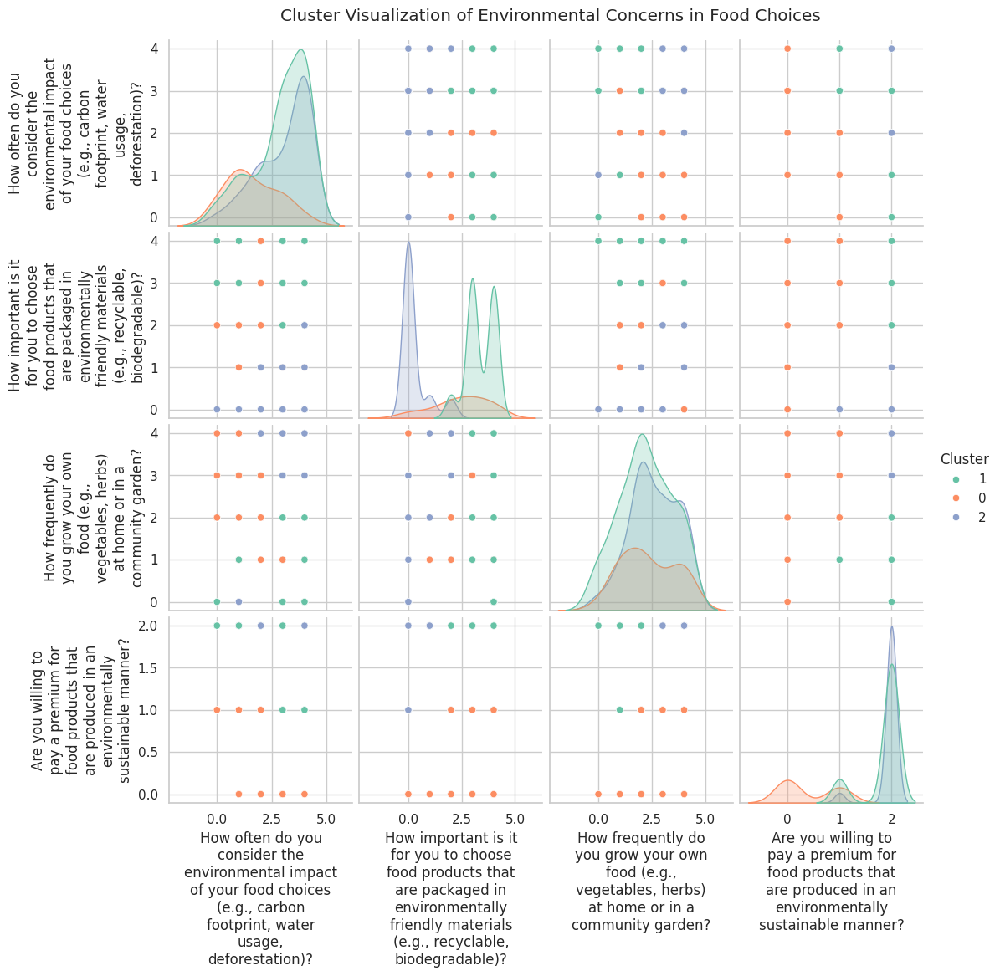

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?",
    "How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?",
    "How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?",
    "Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Environmental Concerns in Food Choices", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

In [ ]:
cluster_analysis

,"How often do you consider the environmental impact of your food choices (e.g., carbon footprint, water usage, deforestation)?","How important is it for you to choose food products that are packaged in environmentally friendly materials (e.g., recyclable, biodegradable)?","How frequently do you grow your own food (e.g., vegetables, herbs) at home or in a community garden?",Are you willing to pay a premium for food products that are produced in an environmentally sustainable manner?
Cluster,,,,
0,1.633333,2.466667,2.333333,0.400000
1,2.934211,3.368421,2.210526,1.855263
2,3.051724,0.275862,2.586207,1.948276


<Figure size 1200x600 with 0 Axes>

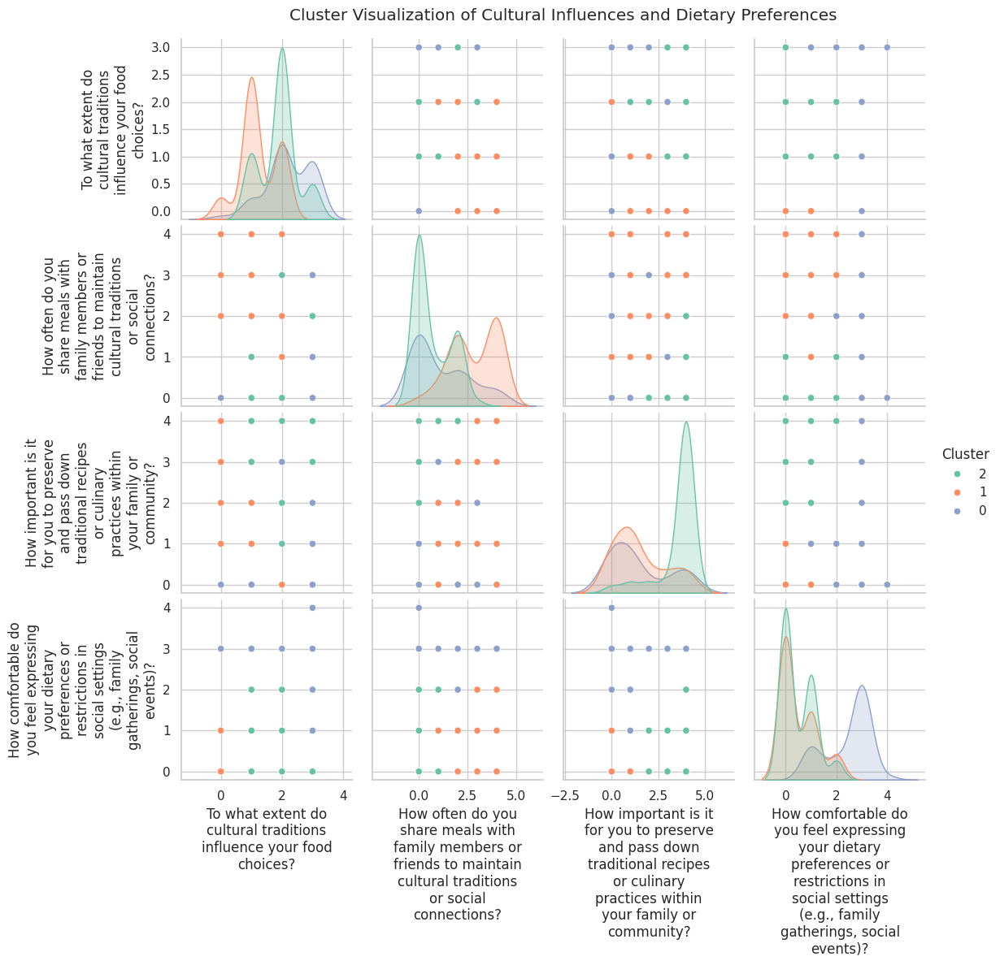

,To what extent do cultural traditions influence your food choices?,How often do you share meals with family members or friends to maintain cultural traditions or social connections?,How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?,"How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?"
Cluster,,,,
0,2.195652,1.152174,1.478261,2.456522
1,1.232143,2.821429,1.482143,0.500000
2,1.887097,0.693548,3.580645,0.483871


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "To what extent do cultural traditions influence your food choices?",
    "How often do you share meals with family members or friends to maintain cultural traditions or social connections? ",
    "How important is it for you to preserve and pass down traditional recipes or culinary practices within your family or community?",
    "How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Cultural Influences and Dietary Preferences", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()

cluster_analysis

<Figure size 1200x600 with 0 Axes>

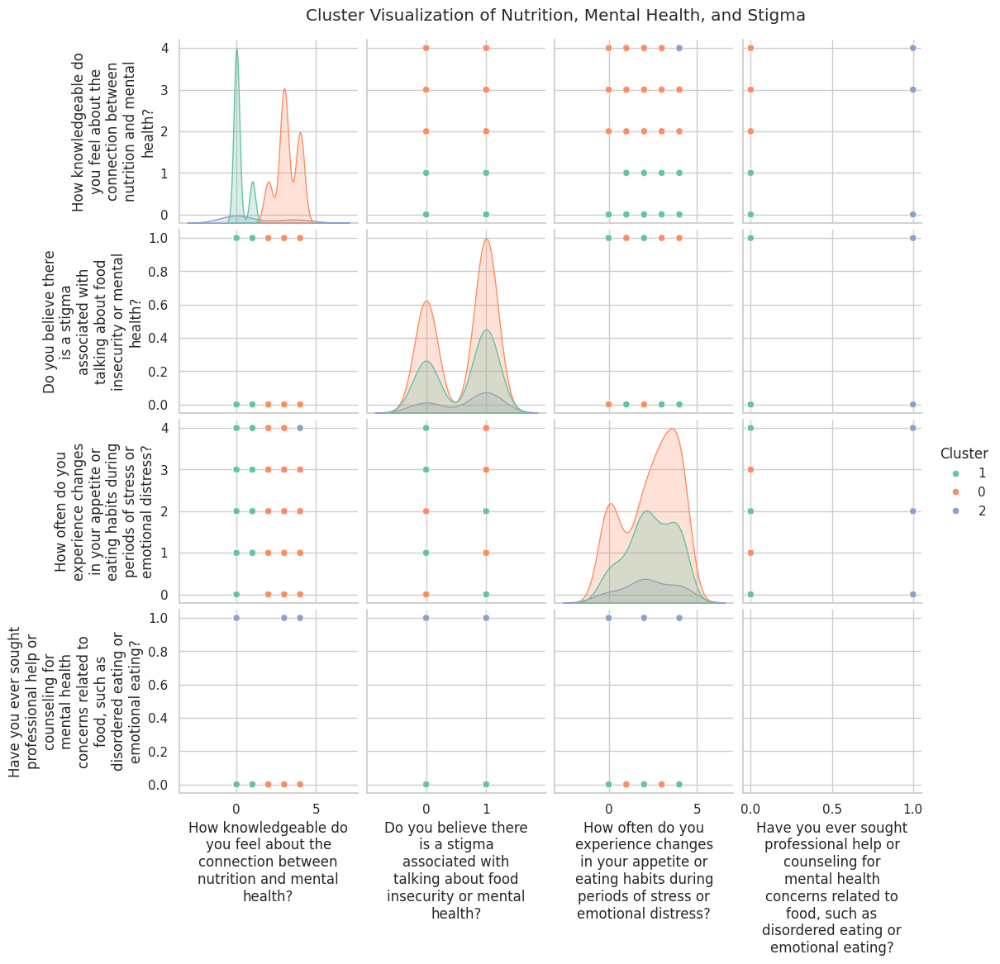

,How knowledgeable do you feel about the connection between nutrition and mental health?,Do you believe there is a stigma associated with talking about food insecurity or mental health?,How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?,"Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?"
Cluster,,,,
0,3.185567,0.608247,2.371134,0.0
1,0.192308,0.615385,2.384615,0.0
2,1.200000,0.666667,2.266667,1.0


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "How knowledgeable do you feel about the connection between nutrition and mental health?",
    "Do you believe there is a stigma associated with talking about food insecurity or mental health?",
    "How often do you experience changes in your appetite or eating habits during periods of stress or emotional distress?",
    "Have you ever sought professional help or counseling for mental health concerns related to food, such as disordered eating or emotional eating?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Nutrition, Mental Health, and Stigma", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis

<Figure size 1200x600 with 0 Axes>

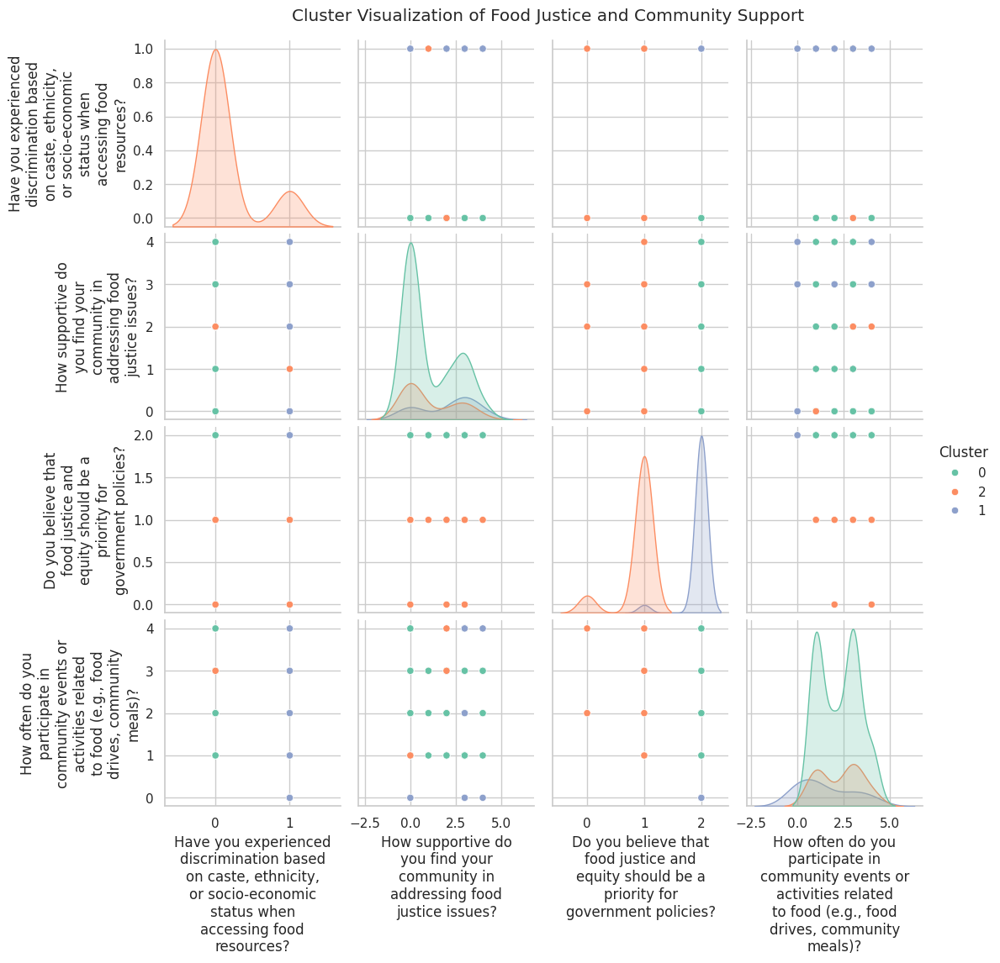

,"Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",How supportive do you find your community in addressing food justice issues?,Do you believe that food justice and equity should be a priority for government policies?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?"
Cluster,,,,
0,0.000000,1.045045,2.000000,2.234234
1,1.000000,2.086957,1.956522,1.521739
2,0.166667,1.066667,0.900000,2.300000


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",
    "How supportive do you find your community in addressing food justice issues?",
    "Do you believe that food justice and equity should be a priority for government policies?",
    "How often do you participate in community events or activities related to food (e.g., food drives, community meals)?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Food Justice and Community Support", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis

<Figure size 1200x600 with 0 Axes>

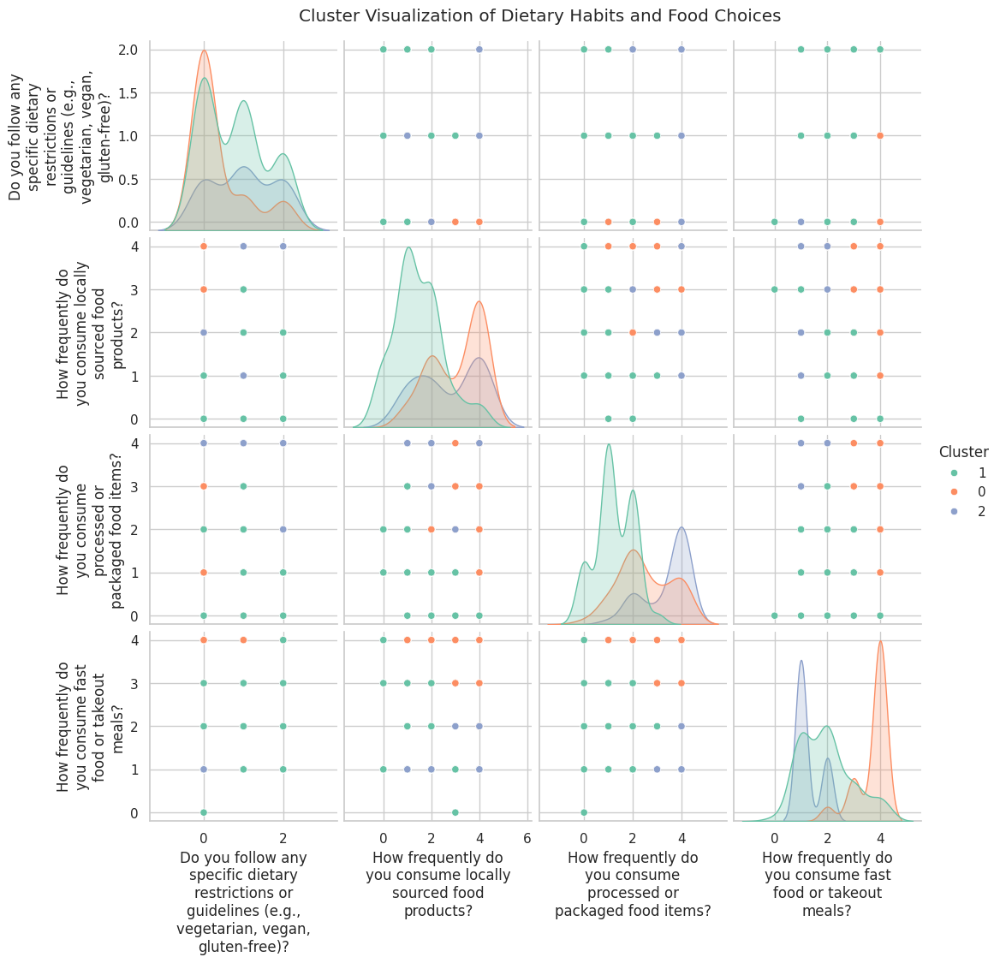

,"Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",How frequently do you consume locally sourced food products?,How frequently do you consume processed or packaged food items?,How frequently do you consume fast food or takeout meals?
Cluster,,,,
0,0.380000,3.080000,2.500000,3.700000
1,0.786667,1.466667,1.240000,1.946667
2,1.000000,2.743590,3.410256,1.282051


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "Do you follow any specific dietary restrictions or guidelines (e.g., vegetarian, vegan, gluten-free)?",
    "How frequently do you consume locally sourced food products?",
    "How frequently do you consume processed or packaged food items?",
    "How frequently do you consume fast food or takeout meals?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Dietary Habits and Food Choices", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis

<Figure size 1200x600 with 0 Axes>

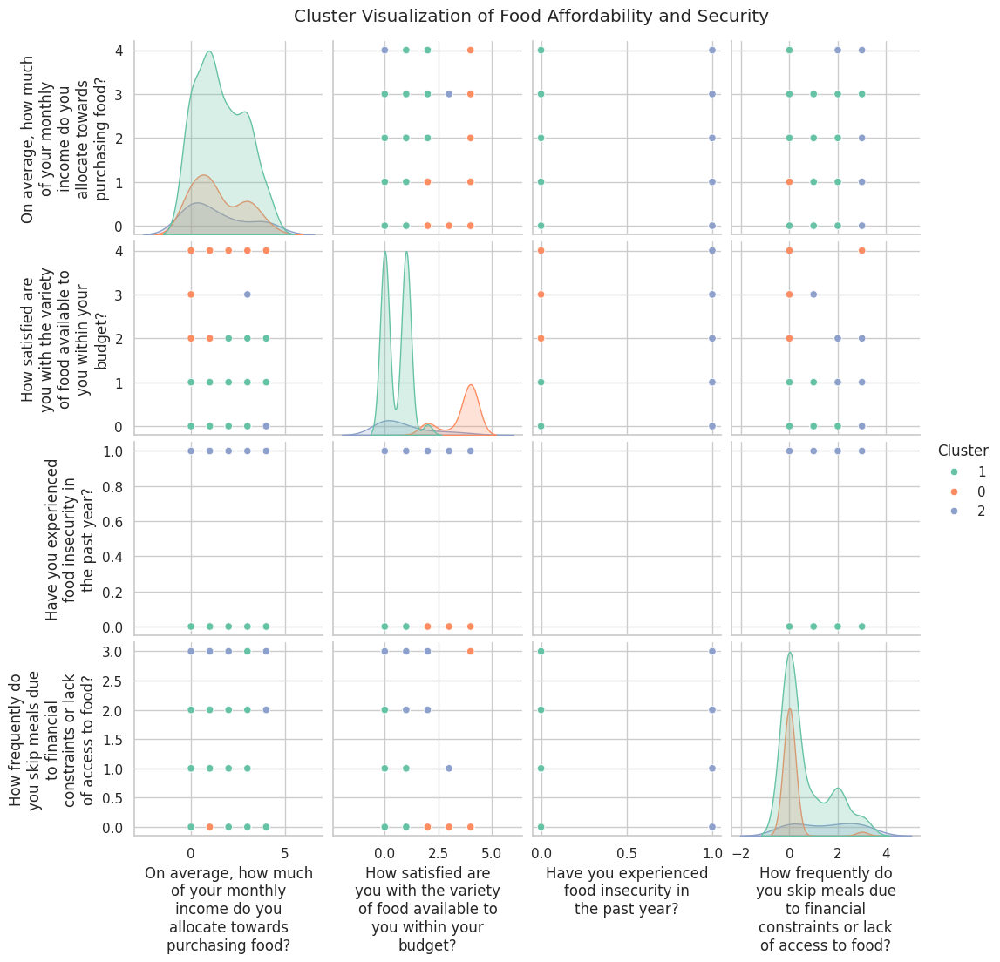

,"On average, how much of your monthly income do you allocate towards purchasing food?",How satisfied are you with the variety of food available to you within your budget?,Have you experienced food insecurity in the past year?,How frequently do you skip meals due to financial constraints or lack of access to food?
Cluster,,,,
0,1.411765,3.588235,0.0,0.088235
1,1.568807,0.541284,0.0,0.642202
2,1.380952,0.904762,1.0,1.476190


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "On average, how much of your monthly income do you allocate towards purchasing food?",
    "How satisfied are you with the variety of food available to you within your budget?",
    "Have you experienced food insecurity in the past year?",
    "How frequently do you skip meals due to financial constraints or lack of access to food?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Food Affordability and Security", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis

<Figure size 1200x600 with 0 Axes>

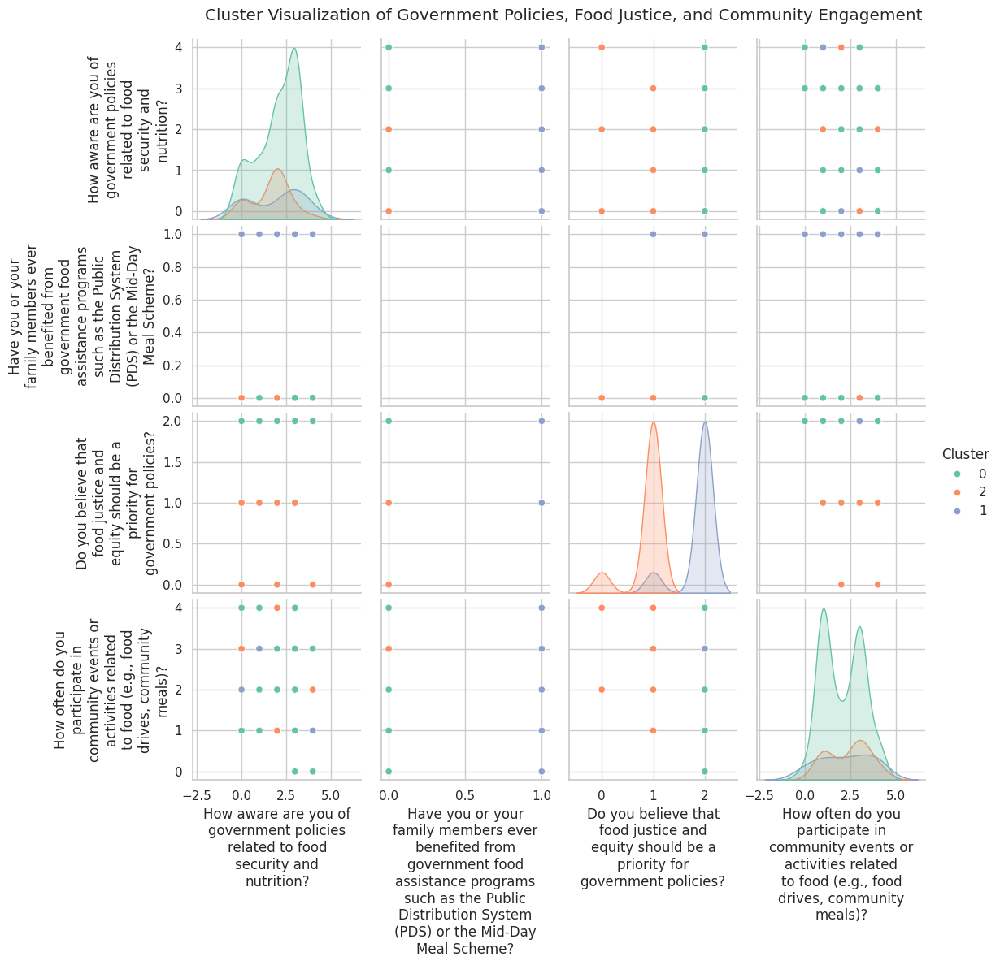

,How aware are you of government policies related to food security and nutrition?,Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?,Do you believe that food justice and equity should be a priority for government policies?,"How often do you participate in community events or activities related to food (e.g., food drives, community meals)?"
Cluster,,,,
0,2.111111,0.0,2.000000,2.064815
1,1.928571,1.0,1.892857,2.214286
2,1.678571,0.0,0.892857,2.392857


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "How aware are you of government policies related to food security and nutrition?",
    "Have you or your family members ever benefited from government food assistance programs such as the Public Distribution System (PDS) or the Mid-Day Meal Scheme?",
    "Do you believe that food justice and equity should be a priority for government policies?",
    "How often do you participate in community events or activities related to food (e.g., food drives, community meals)?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Government Policies, Food Justice, and Community Engagement", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis

<Figure size 1200x600 with 0 Axes>

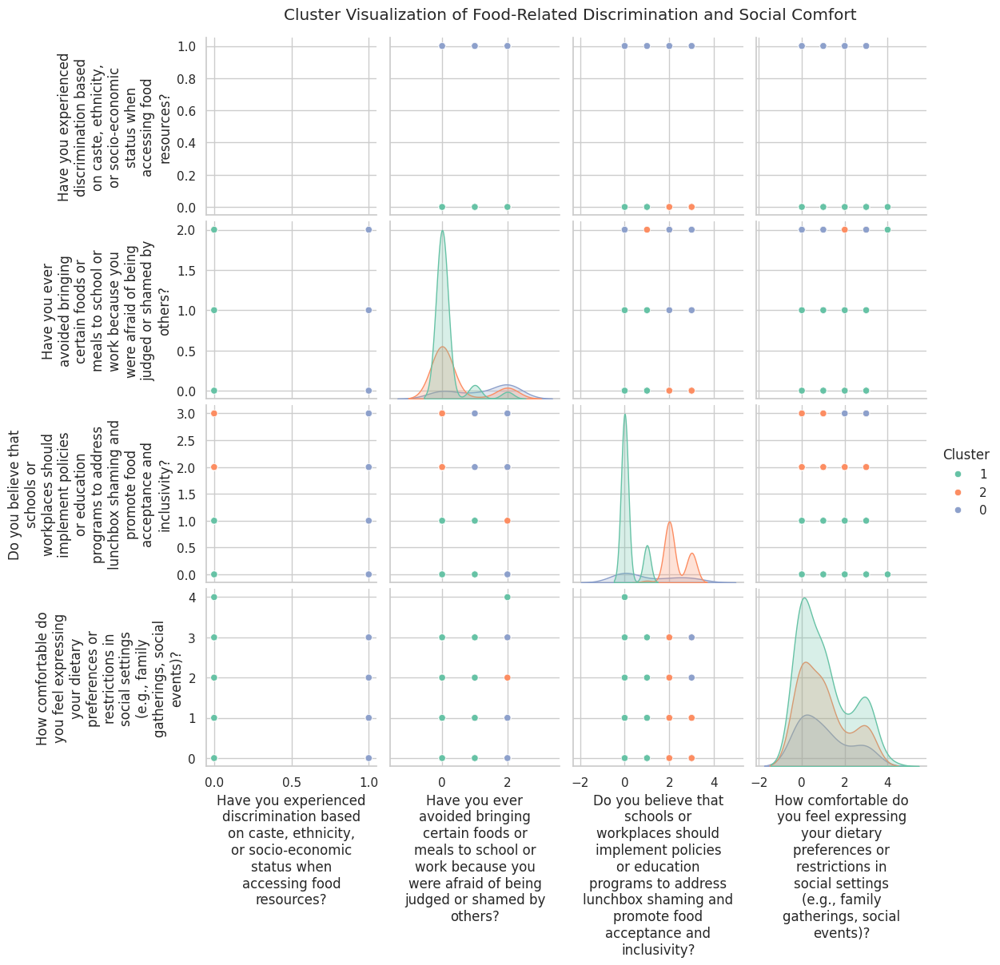

,"Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?,Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?,"How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?"
Cluster,,,,
0,1.0,1.250000,1.071429,1.035714
1,0.0,0.144578,0.180723,1.060241
2,0.0,0.358491,2.301887,1.018868


In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap


# Selecting relevant columns
columns_of_interest = [
    "Have you experienced discrimination based on caste, ethnicity, or socio-economic status when accessing food resources?",
    "Have you ever avoided bringing certain foods or meals to school or work because you were afraid of being judged or shamed by others?",
    "Do you believe that schools or workplaces should implement policies or education programs to address lunchbox shaming and promote food acceptance and inclusivity?",
    "How comfortable do you feel expressing your dietary preferences or restrictions in social settings (e.g., family gatherings, social events)?"
]

df_selected = df[columns_of_interest].copy()

# Convert categorical variables to numerical using Label Encoding
label_encoders = {}
for column in df_selected.columns:
    le = LabelEncoder()
    df_selected[column] = le.fit_transform(df_selected[column])
    label_encoders[column] = le

# Normalize the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_selected)

# Apply K-Means clustering to find an optimal number of clusters using the elbow method
inertia = []
k_values = range(1, 10)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertia.append(kmeans.inertia_)

# # Find the optimal number of clusters using the elbow method (commented out)
# plt.figure(figsize=(8, 5))
# plt.plot(k_values, inertia, marker='o', linestyle='-')
# plt.xlabel('Number of Clusters')
# plt.ylabel('Inertia')
# plt.title('Elbow Method for Optimal Clusters')
# plt.show()

# Based on the elbow method, selecting an optimal number of clusters (e.g., 3)
optimal_k = 3  # You might need to adjust this based on the elbow method plot

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_selected["Cluster"] = kmeans.fit_predict(df_scaled)

# Display cluster distribution
df_selected["Cluster"].value_counts()

# Adding cluster labels back to the original dataset for interpretation
df["Cluster"] = df_selected["Cluster"]

# Analyzing the mean values for each cluster
cluster_analysis = df_selected.groupby("Cluster").mean()
cluster_analysis

# Set plot style
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
# Convert cluster numbers to categorical for better visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(str)
# Pairplot to visualize clusters
g = sns.pairplot(df_selected, hue="Cluster", palette="Set2", diag_kind="kde")
# Wrap x and y axis labels for each subplot
for ax in g.axes.flat:
    ax.set_xlabel('\n'.join(wrap(ax.get_xlabel(), 20)))  # Wrap x labels with width 30
    ax.set_ylabel('\n'.join(wrap(ax.get_ylabel(), 20)))  # Wrap y labels with width 30
plt.suptitle("Cluster Visualization of Food-Related Discrimination and Social Comfort", y=1.02)  # Updated title
plt.show()

# Convert cluster labels back to numeric for visualization
df_selected["Cluster"] = df_selected["Cluster"].astype(int)
wrapped_labels = {col: '<br>'.join(wrap(col, width=30)) for col in columns_of_interest}

fig = px.parallel_coordinates(
    df_selected,
    color="Cluster",
    dimensions=columns_of_interest,
    labels=wrapped_labels,
    color_continuous_scale=px.colors.diverging.Portland)

fig.show()
cluster_analysis